В данном проекте требовалось оценить эффективность терапии.

Были предоставлены демографические данные пациентов (пол, возраст, диагноз, инвалидность, ИМТ, семейный статус, уровень образования и т.д.), данные оценки пациентов по различным шкалам в четырех контрольных точках по времени и данные о группе терапии и летальности. Для соблюдения конфиденциальности все данные обезличены и названия шкал не приводятся.

Пациенты были разбиты на три неравные группы терапии. Часть пациентов получала терапию 24 часа в сутки, часть по требованию. 

Заказчик поставил задачу оценить эффективность терапии как в целом для всех участников, так и в группах терапии по отедельности. Группы терапии сравнивать между собой было нецелесообразным

Для этого применила следующий дизайн оценки:

- описательная статистика (летальность, группы терапии, демографические данных, шкал по визитам)
- анализ выживаемости (в целом, с разделением по группам терапий)
- для нормально распределенных данных (в целом, с разделением по группам терапий) - параметрические тесты изменения показателей шкал по визитам (ANOVA, Тьюки)
- для ненормально распреледенных данных или категориальных переменных (в целом, с разделением по группам терапий) - непараметрические тесты изменения показателей шкал по визитам (Крускал-Уоллис, Манн-Уитни с поправкой Холма-Бонферрони)
- анализ повторных измерений шкал по визитам для нормально распределенных данных - ANOVA для повторных изменений, тест Тьюки
- анализ построных измерений шкал по визитам для ненормально распределенных данных - тест Фридмана, тест Коновера

Для оценки нормальности распределения использовала визульаный метод оценки qq-plot, гистограммы, а так же параметров эксцесса и асимметрии

В данном отчете представлен только расчет и визуализация. Описание результатов не представлено

...

In this project, it was necessary to evaluate the effectiveness of therapy.

Demographic data of patients were provided (sex, age, diagnosis, disability, BMI, family status, education level, etc.), as well as data on patients' assessment on various scales at four time points, therapy group and outcome(mortality). To maintain confidentiality, all data were anonymized, and the names of the scales were not provided.

Patients were divided into three unequal therapy groups. Some patients received therapy 24 hours a day, while others received it on demand.

The task given by the customer was to evaluate the effectiveness of therapy both overall for all participants and in therapy groups separately. Comparing therapy groups with each other was not feasible.

To achieve this, the following evaluation design was applied:

- Descriptive statistics (outcome (mortality), therapy groups, demographic data, scales at visits)
- Survival analysis (overall, in therapy groups separately)
- Parametric tests for normally distributed data (overall, with division by therapy groups) - ANOVA, Tukey test 
- Nonparametric tests for non-normally distributed data or categorical variables (overall, with division by therapy groups) - Kruskal-Wallis, Mann-Whitney tests with Holm-Bonferroni adjustments 
- Analysis of repeated measurements of scale indicators for normally distributed data - ANOVA for repeated measures, Tukey test
- Analysis of non-repeated measurements of scale indicators for non-normally distributed data - Friedman test, Conover test

To assess the normality of the distribution, a visual method of assessment was used, including QQ plots, histograms, and measures of kurtosis and skewness.

This report only includes calculation and visualization. Description of the results is not presented.

<a id='content'></a>

# Table of contents 

[EDA](#EDA)

[Duration of observation and frequency of visits](#Duration_of_observation_and_frequency_of_visits)

[Survival Analysis](#Survival_Analysis)

[Descriptive statistic](#Descriptive_statistic)

 - [Outcome, group of therapy, source, diagnosis, sex, oms, family, disability, education](#ord_var)
 - [Age and BMI](#Age_BMI)
     - [Comparison of age in therapy groups](#Comparison_of_age_in_therapy_groups)
     - [Distribution of age in disability groups](#Distribution_of_age_in_disability_groups)
     - [Correlation between age and BMI](#Correlation_between_age_and_BMI)
     - [Therapy groups and outcomes](#Therapy_groups_and_outcomes)
     - [Chi-squared test (Sex)](#Chi-squared_test_(Sex))
     
 - [Time of equipment using](#Time_of_equipment_using)
     - [Comparison of time distribution of equipment use in therapy groups](#Comparison_of_time_distribution_of_equipment_use_in_therapy_groups)
 - [Quantitative (scales) data](#Quantitative_data)
 
[Analysis of quantitative (hidden) data by visits](#Analysis_of_quantitative_data_by_visits) 

- [Parametric tests (ANOVA, Tukey's test)](#Parametric_tests) 
- [Nonparametric tests (Kruskal Wallis test, Mann-Whitneyu test [method for adjusting p values - Bonferroni])](#Nonparametric_tests) 

[Per-protocol analysis](#Per-protocol_analysis)
- [ANOVA for repeated measures](#ANOVA_for_repeated_measures)
- [The Friedman test for repeated samples](#Friedman_test)

In [1]:
import pandas as pd
import numpy as np
import re
import statistics
import math as m

from scipy import stats
from statsmodels. stats.proportion import proportion_confint
from scipy. stats import f_oneway
from statsmodels.stats.multicomp import (pairwise_tukeyhsd, MultiComparison)
from lifelines.statistics import multivariate_logrank_test
from lifelines import NelsonAalenFitter
from lifelines import KaplanMeierFitter
from scipy.stats import pearsonr
from scipy.stats import kurtosis, skew

import plotly.express as px
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic
import seaborn as sns
import plotly.io as pio
import plotly.graph_objects as go
import pylab as py

# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_colwidth', None)

# ANOVA
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import AnovaRM

# Post-hocs 
import scikit_posthocs as sp

<a id='EDA'></a>
# EDA
[Table of contents](#content)

In [2]:
df1 = pd.read_excel('personal data.xlsx')
df2 = pd.read_excel('visits.xlsx')

In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98 entries, 0 to 97
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ID            98 non-null     int64         
 1   outcome       98 non-null     int64         
 2   stat          98 non-null     int64         
 3   time          98 non-null     int64         
 4   BMI           96 non-null     float64       
 5   age           98 non-null     int64         
 6   group         98 non-null     int64         
 7   diagnosis     98 non-null     int64         
 8   date_visit_1  98 non-null     datetime64[ns]
 9   date_visit_3  98 non-null     object        
 10  date_visit_4  98 non-null     object        
 11  date_visit_2  98 non-null     object        
 12  source        98 non-null     int64         
 13  sex           98 non-null     int64         
 14  oms           97 non-null     float64       
 15  family        98 non-null     int64       

In [4]:
df1.date_visit_1 = pd.to_datetime(df1.date_visit_1, errors='coerce') 
df1.date_visit_2 = pd.to_datetime(df1.date_visit_2, errors='coerce') 
df1.date_visit_3 = pd.to_datetime(df1.date_visit_3, errors='coerce') 
df1.date_visit_4 = pd.to_datetime(df1.date_visit_4, errors='coerce') 

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98 entries, 0 to 97
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ID            98 non-null     int64         
 1   outcome       98 non-null     int64         
 2   stat          98 non-null     int64         
 3   time          98 non-null     int64         
 4   BMI           96 non-null     float64       
 5   age           98 non-null     int64         
 6   group         98 non-null     int64         
 7   diagnosis     98 non-null     int64         
 8   date_visit_1  98 non-null     datetime64[ns]
 9   date_visit_3  78 non-null     datetime64[ns]
 10  date_visit_4  75 non-null     datetime64[ns]
 11  date_visit_2  88 non-null     datetime64[ns]
 12  source        98 non-null     int64         
 13  sex           98 non-null     int64         
 14  oms           97 non-null     float64       
 15  family        98 non-null     int64       

In [5]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   number_of_visit  392 non-null    int64  
 1   ID               392 non-null    int64  
 2   col1             335 non-null    float64
 3   col2             334 non-null    float64
 4   col3             333 non-null    float64
 5   col4             334 non-null    float64
 6   col5             334 non-null    float64
 7   col6             211 non-null    float64
 8   col7             249 non-null    float64
 9   col8             308 non-null    float64
 10  col9             272 non-null    float64
 11  col10            323 non-null    float64
 12  col11            299 non-null    float64
 13  col12            301 non-null    float64
 14  col13            304 non-null    float64
 15  col14            232 non-null    float64
 16  col15            230 non-null    float64
 17  col16           

In [6]:
display('NA number df1: ', df1.isna().sum())
display('Duplicates number df1: ', df1.duplicated().sum())
display('Число пропусков df2: ', df2.isna().sum())
display('NA number df2: ', df2.duplicated().sum())

'NA number df1: '

ID               0
outcome          0
stat             0
time             0
BMI              2
age              0
group            0
diagnosis        0
date_visit_1     0
date_visit_3    20
date_visit_4    23
date_visit_2    10
source           0
sex              0
oms              1
family           0
U_time           2
disability       2
education        8
dtype: int64

'Duplicates number df1: '

0

'Число пропусков df2: '

number_of_visit      0
ID                   0
col1                57
col2                58
col3                59
col4                58
col5                58
col6               181
col7               143
col8                84
col9               120
col10               69
col11               93
col12               91
col13               88
col14              160
col15              162
col16              181
col17              168
col18              163
col19              165
col20              197
col21              161
col22              161
col23              162
col24              163
col25              177
col26              177
col27              177
col28              177
col29              177
col30              177
dtype: int64

'NA number df2: '

0

There are a lot of missing data. Leave it unchanged

In [7]:
# outcome
outcome = ["survive", "non-survive"]

for i in range(len(outcome)):
    df1['outcome'] = df1['outcome'].replace(i, outcome[i])

Merging tables for calculations

In [8]:
df_united = df1.merge(df2, on='ID')

<a id='Duration_of_observation_and_frequency_of_visits'></a>
# Duration of observation and frequency of visits
[Table of contents](#content)

count     98.000000
mean     232.969388
std       77.079482
min       18.000000
25%      251.250000
50%      267.000000
75%      275.000000
max      312.000000
Name: time, dtype: float64

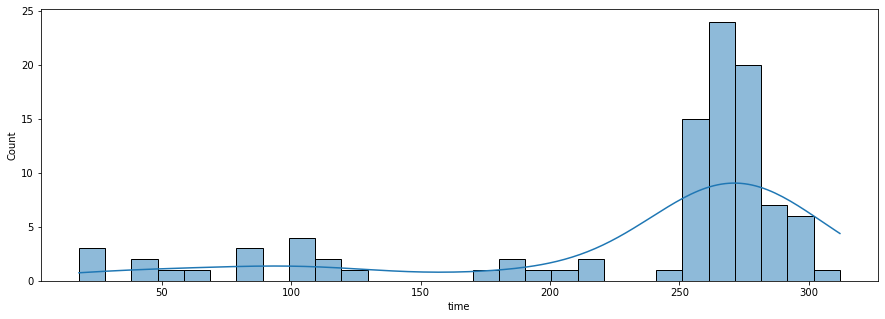

In [9]:
# Duration of observation
plt.figure(figsize = (15, 5))
sns.histplot(df1.time, kde=True)
df1.time.describe()

Distribution is not normal (most patients completed the study). The median duration is 267 days

count     88.000000
mean      96.443182
std       23.404419
min       15.000000
25%       88.000000
50%       95.500000
75%      105.000000
max      168.000000
dtype: float64

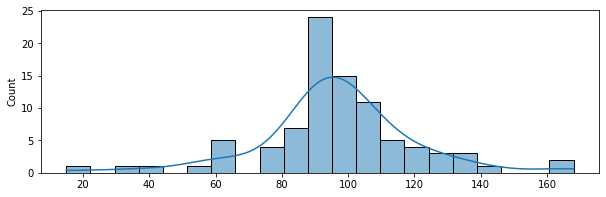

In [10]:
# days between second and first visit
plt.figure(figsize = (10, 3))
sns.histplot((df1.date_visit_2 - df1.date_visit_1).dt.days, kde=True)
(df1.date_visit_2 - df1.date_visit_1).dt.days.describe()

count     78.000000
mean      89.641026
std       29.978769
min        0.000000
25%       72.250000
50%       88.000000
75%      101.750000
max      172.000000
dtype: float64

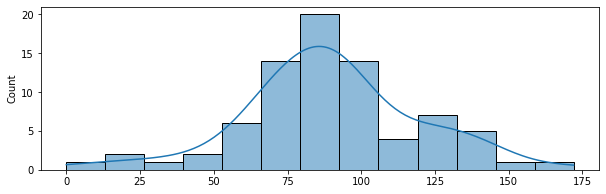

In [11]:
# days between third and second visit
plt.figure(figsize = (10, 3))
sns.histplot((df1.date_visit_3 - df1.date_visit_2).dt.days, kde=True)
(df1.date_visit_3 - df1.date_visit_2).dt.days.describe()

count     73.000000
mean      83.369863
std       26.462503
min       15.000000
25%       66.000000
50%       88.000000
75%       95.000000
max      167.000000
dtype: float64

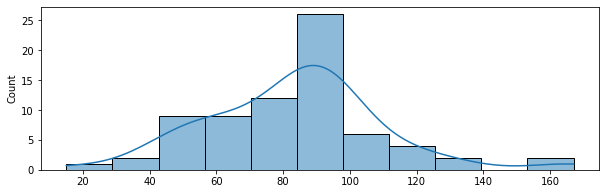

In [12]:
# days between fourth and third visit
plt.figure(figsize = (10, 3))
sns.histplot((df1.date_visit_4 - df1.date_visit_3).dt.days, kde=True)
(df1.date_visit_4 - df1.date_visit_3).dt.days.describe()

On average, visits were conducted every three months

<a id='Survival_Analysis'></a>
# Survival Analysis
[Table of contents](#content)

In [13]:
df1['KM'] = df1['stat'].apply(lambda x: 0 if x <= 2 else 1)

In [14]:
kmf = KaplanMeierFitter()
kmf.fit(df1['time'], event_observed = df1['KM'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 98 total observations, 83 right-censored observations>

Text(0, 0.5, 'Cumulative Survival')

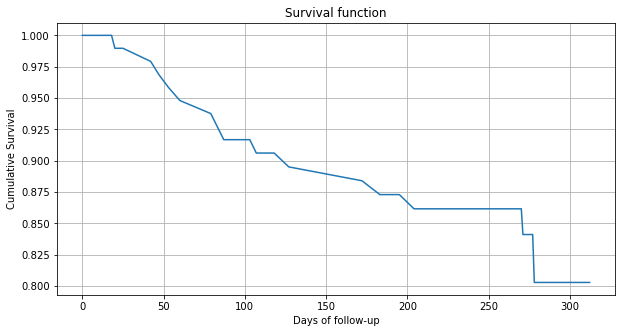

In [15]:
kmf.survival_function_.plot(grid=True, figsize = (10, 5), legend=False)

plt.title("Survival function")
plt.xlabel('Days of follow-up')
plt.ylabel('Cumulative Survival')

Text(0, 0.5, 'Cumulative Survival (95% CI)')

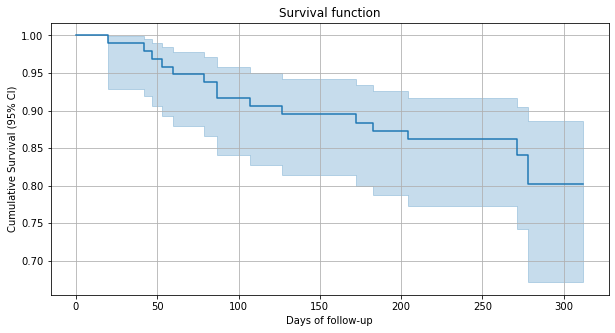

In [16]:
kmf.plot(grid=True, figsize = (10, 5), legend=False)
plt.title("Survival function")
plt.xlabel('Days of follow-up')
plt.ylabel('Cumulative Survival (95% CI)')

Text(0, 0.5, 'Cumulative Risk (95% CI)')

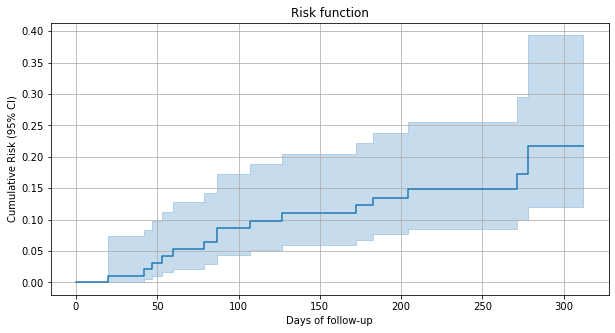

In [17]:
naf = NelsonAalenFitter()

naf.fit(df1['time'], event_observed = df1['KM'])

naf.plot(grid=True, figsize = (10, 5), legend=False)
plt.title("Risk function")
plt.xlabel('Days of follow-up')
plt.ylabel('Cumulative Risk (95% CI)')

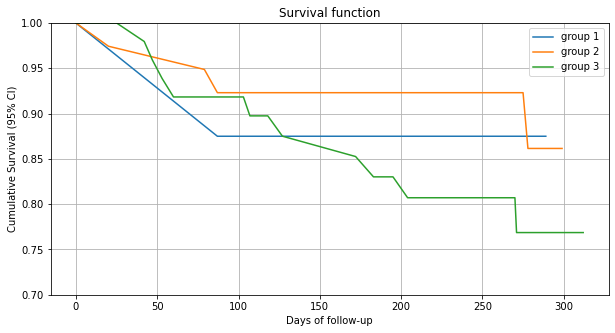

In [18]:
ax = plt.subplot(111)

kmf.fit(df1.query('group == 1')['time'], event_observed=df1.query('group == 1')['KM'], label="group 1")
kmf.survival_function_.plot(ax=ax)

kmf.fit(df1.query('group == 2')['time'], event_observed=df1.query('group == 2')['KM'], label="group 2")
kmf.survival_function_.plot(ax=ax, grid=True, figsize = (10, 5))

kmf.fit(df1.query('group == 3')['time'], event_observed=df1.query('group == 3')['KM'], label="group 3")
kmf.survival_function_.plot(ax=ax, grid=True, figsize = (10, 5))

plt.title("Survival function")
plt.xlabel('Days of follow-up')
plt.ylabel('Cumulative Survival (95% CI)')


plt.ylim(0.7,1);

In [19]:
# logrank comparison
results = multivariate_logrank_test(df1['time'], df1['group'], df1['KM'], alpha=.95)
print(results.print_summary())

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic    p  -log2(p)
           2.12 0.35      1.53

None


The probability of an outcome over time is not dependent on the therapy group

<a id='Descriptive_statistic'></a>
# Descriptive statistic 
[Table of contents](#content)

<a id='ord_var'></a>
### Outcome, group of therapy, source, diagnosis, sex, oms, family, disability, education
[Table of contents](#content)

In [20]:
df1_columns = df1.columns.values.tolist()
df1_columns

['ID',
 'outcome',
 'stat',
 'time',
 'BMI',
 'age',
 'group',
 'diagnosis',
 'date_visit_1',
 'date_visit_3',
 'date_visit_4',
 'date_visit_2',
 'source',
 'sex',
 'oms',
 'family',
 'U_time',
 'disability',
 'education',
 'KM']

In [21]:
# proportions
for item in (['outcome', 'stat', 'group', 'source', 'diagnosis', 'sex', 'oms', 'family', 'disability', 'education']):
    display(item, round(df1[item].value_counts(normalize=True), 4) * 100)

'outcome'

survive        84.69
non-survive    15.31
Name: outcome, dtype: float64

'stat'

1    79.59
3    15.31
2     5.10
Name: stat, dtype: float64

'group'

3    52.04
2    39.80
1     8.16
Name: group, dtype: float64

'source'

1    55.10
6    22.45
4    16.33
3     3.06
5     1.02
2     1.02
7     1.02
Name: source, dtype: float64

'diagnosis'

1     29.59
17    22.45
6     13.27
2      7.14
16     7.14
14     3.06
3      2.04
5      2.04
8      2.04
10     2.04
15     2.04
9      2.04
4      1.02
7      1.02
11     1.02
12     1.02
13     1.02
Name: diagnosis, dtype: float64

'sex'

1    60.2
2    39.8
Name: sex, dtype: float64

'oms'

1.0    92.78
2.0     7.22
Name: oms, dtype: float64

'family'

1     63.27
2     26.53
4      7.14
3      2.04
10     1.02
Name: family, dtype: float64

'disability'

2.0    39.58
0.0    27.08
1.0    22.92
3.0    10.42
Name: disability, dtype: float64

'education'

4.0    57.78
3.0    40.00
5.0     1.11
2.0     1.11
Name: education, dtype: float64

In [22]:
# description stat, pie chart
def pie_chart(data, group, title, colors = None, explode = None, figsize = (8, 8)):
    data_table = (data
                    .groupby(group, as_index = False)
                    .agg({'ID': 'count'})
                    .sort_values(by='ID', ascending=False)
                    .reset_index(drop=True))
    data_table_lable = data_table['ID'].tolist()

    fig, ax = plt.subplots(figsize=figsize)
    labels = data_table[group].tolist()

    for i in range(len(data_table['ID'].tolist())):
        data_table_lable[i] = str(data_table[group].tolist()[i]) + ' (n='+ data_table['ID'][i].astype('str') + ')'

    x = data_table['ID'].tolist()
    ax.pie(x, labels=data_table_lable, autopct='%.1f%%',
         wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
         colors = colors,
         textprops={'size': '14'},
         explode = explode)
    ax.set_title(title, fontsize=18)
    plt.tight_layout()

'Outcome'

survive        84.69
non-survive    15.31
Name: outcome, dtype: float64

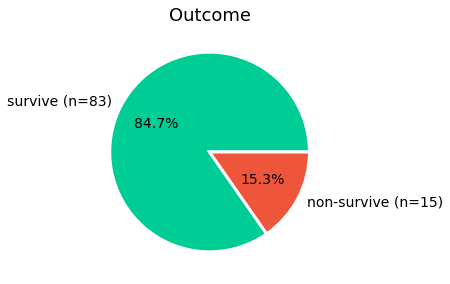

In [23]:
# Outcome visualization
colors = ['#00CC96', '#EF553B']
title = 'Outcome'
pie_chart(df1, 'outcome', title, colors, figsize = (6, 6))
display('Outcome', round(df1['outcome'].value_counts(normalize=True), 4) *100)

In [24]:
# pie chart mkb
def pie_chart_mkb(data, group, title, colors = None, explode = None, figsize = (8, 8)):
    data_table = (data
                    .groupby(group, as_index = False)
                    .agg({'ID': 'count'})
                    .sort_values(by='ID', ascending=False)
                    .reset_index(drop=True))
    data_table_lable = data_table['ID'].tolist()
    fig = px.pie(data_table, values='ID', names=group, title=title)
    fig.show()

    
    
pie_chart_mkb(df1, 'diagnosis', 'Primary diagnosis (ICD-10)', figsize = (6, 6))

<a id='Age_BMI'></a>
### Age and BMI
[Table of contents](#content)

age
count    98.000000
mean     60.602041
std      15.185954
min      25.000000
25%      51.000000
50%      62.000000
75%      71.000000
max      92.000000
Name: age, dtype: float64


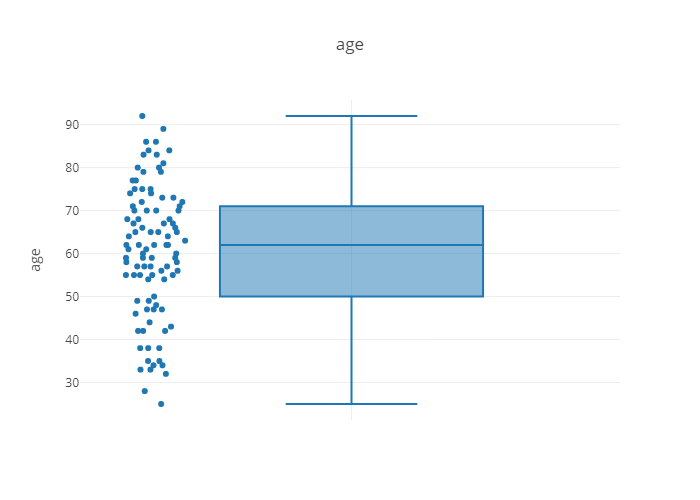

BMI
count    96.000000
mean     29.232831
std       9.963876
min      12.802768
25%      21.229051
50%      27.023927
75%      35.013162
max      64.223905
Name: BMI, dtype: float64


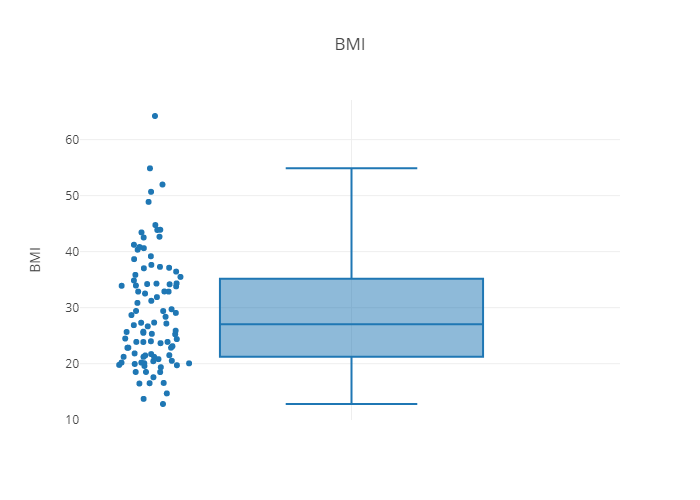

In [25]:
# age and BMI
for item in ['age', 'BMI']:
    print(item)
    print(df1[item].describe())
    fig = px.box(df1, y=item, points="all", 
            template="gridon",
            title = item)
    fig.show('png')

In [26]:
def compar_distrib_in_groups(data, param, group, title):
    '''visualisation and Tukey's test'''
    
    # graf
    fig = px.box(data, x=group, y=param, color = group, points="all", 
                template="gridon",
                title = title)
    fig.show('png')

    # perform Tukey's test
    tukey = pairwise_tukeyhsd(endog=data[param],
    groups=data[group],
    alpha= 0.05)
    
    #display results
    print(tukey)
    
    data_stat = data.groupby(group, as_index=False)[param].agg({'mean', 'sem'})
    data_stat['95% CI low'] = data_stat['mean'] - data_stat['sem'] * 1.96
    data_stat['95% CI up'] = data_stat['mean'] + data_stat['sem'] * 1.96
    print(data_stat)

<a id='Comparison_of_age_in_therapy_groups'></a>
##### Comparison of age in therapy groups
[Table of contents](#content)

,sum_sq,df,F,PR(>F)
C(age),23.215986,44.0,1.653086,0.040312
Residual,16.916667,53.0,NaN,NaN


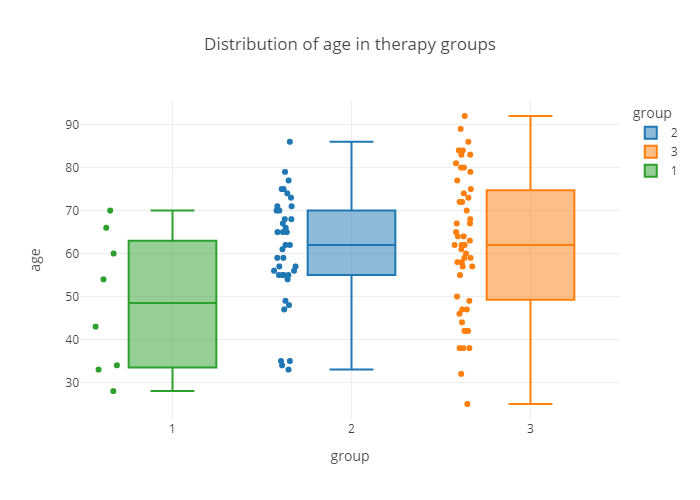

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  12.2436 0.0912 -1.5071 25.9943  False
     1      3  13.8922 0.0417  0.4196 27.3647   True
     2      3   1.6486 0.8614 -5.8877  9.1849  False
----------------------------------------------------
            sem       mean  95% CI low  95% CI up
group                                            
1      5.719640  48.500000   37.289505  59.710495
2      2.034692  60.743590   56.755594  64.731585
3      2.263622  62.392157   57.955458  66.828855


In [27]:
#two-way ANOVA
model = ols('group ~ C(age)', data=df1).fit()
display(sm.stats.anova_lm(model, typ=2))
    
title = 'Distribution of age in therapy groups'
compar_distrib_in_groups(df1, 'age', 'group', title)

Patients in the first group are 14 years younger than patients in the third group (μ = 48.5 [95% CI 37.29 – 59.71] vs μ = 62.39 [95% CI 57.96 – 66.83], p=0.042)

<a id='Distribution_of_age_in_disability_groups'></a>
##### Distribution of age in disability groups
[Table of contents](#content)

,sum_sq,df,F,PR(>F)
C(age),51.416667,44.0,1.421787,0.112694
Residual,41.916667,51.0,NaN,NaN


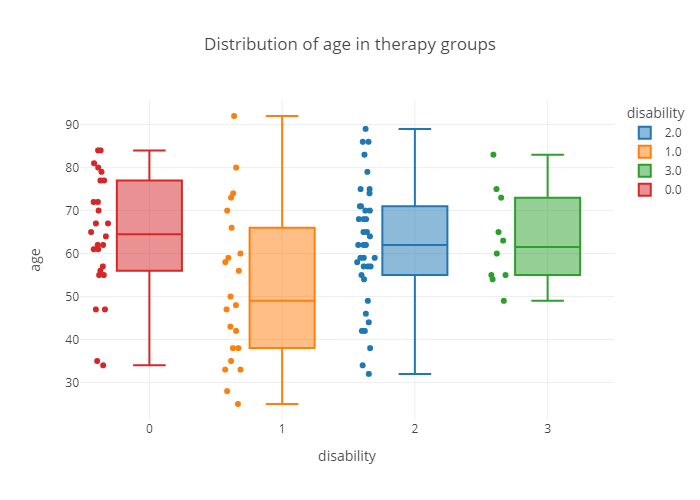

 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
   0.0    1.0 -12.0874 0.0301 -23.3332 -0.8416   True
   0.0    2.0  -2.2955 0.9293 -12.1761   7.585  False
   0.0    3.0  -1.0692 0.9974 -15.5148 13.3763  False
   1.0    2.0   9.7919 0.0726  -0.6083 20.1921  False
   1.0    3.0  11.0182 0.2158  -3.7876  25.824  False
   2.0    3.0   1.2263 0.9955 -12.5711 15.0237  False
-----------------------------------------------------
                 sem       mean  95% CI low  95% CI up
disability                                            
0.0         2.691615  64.269231   58.993665  69.544797
1.0         3.872221  52.181818   44.592265  59.771372
2.0         2.317749  61.973684   57.430897  66.516471
3.0         3.434466  63.200000   56.468447  69.931553


In [28]:
#two-way ANOVA
model = ols('disability ~ C(age)', data=df1).fit()
display(sm.stats.anova_lm(model, typ=2))
    
title = 'Distribution of age in therapy groups'
compar_distrib_in_groups(df1[['age', 'disability']].dropna(), 'age', 'disability', title)

<a id='Correlation_between_age_and_BMI'></a>
##### Correlation between age and BMI
[Table of contents](#content)

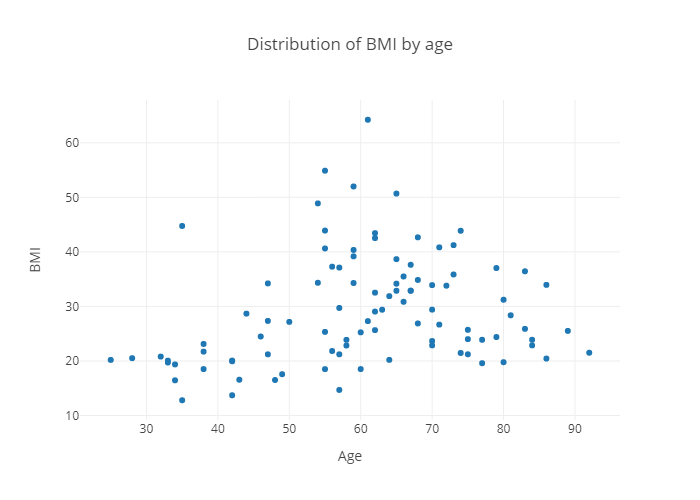

,age,BMI
age,1.000000,0.216913
BMI,0.216913,1.000000


In [29]:
# distribution BMI by age
fig = px.scatter(df1, x="age", y="BMI", template="gridon", 
                 labels = {'age':'Age'},
                 title = 'Distribution of BMI by age')
fig.show('png')

#correlation
df1[['age', 'BMI']].corr()

there is no correlation between age and BMI

<a id='Therapy_groups_and_outcomes'></a>
##### Therapy groups and outcomes
[Table of contents](#content)

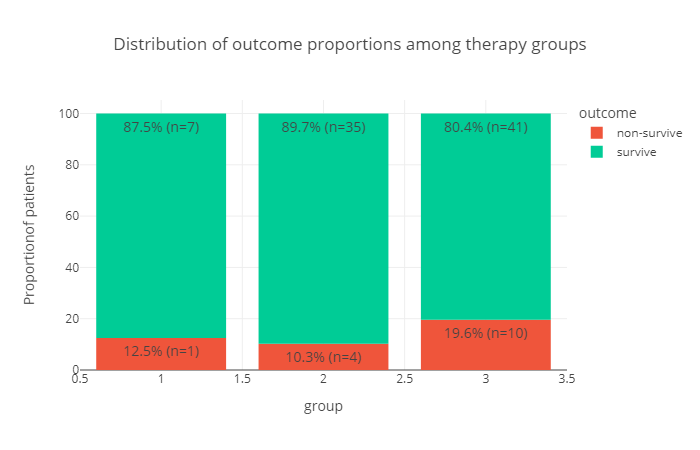

In [30]:
# Bar plot %
def bar_plot_proc(data, group1, group2, labels, title, w = 1000, h=700, colors = None, category_orders = None):
    data_group = data.pivot_table(index=[group1, group2], values='ID', 
                                      aggfunc='count', fill_value = 0).reset_index()
    data_group_total = data.pivot_table(index=[group2], values='ID', 
                                      aggfunc='count', fill_value = 0).reset_index()
    data_groups_total = data_group.merge(data_group_total, how='left', on=group2)
    data_groups_total['proc'] = data_groups_total['ID_x'] / data_groups_total['ID_y'] * 100
    data_groups_total['title'] = (round(data_groups_total['proc'], 1).astype('str') + '% ' 
                                  + '(n='+ data_groups_total['ID_x'].astype('str') +')')
    
    fig = px.bar(data_groups_total, x=group2, y="proc", color=group1, 
              labels=labels,
              title = title,
              color_discrete_map=colors,
              text = 'title', 
              category_orders=category_orders,
                                  template="gridon",
                                  width=w, height=h)
    fig.update_traces(textposition='inside')
    fig.update_layout(uniformtext_minsize=14, uniformtext_mode='hide')
    fig.show('png')

# пациенты по группе терапии и причине окончания участия в исследовании
labels = {'proc':'Proportionof patients'}
title = 'Distribution of outcome proportions among therapy groups'
color={'survive':'#00CC96', 'non-survive':'#EF553B'}
w = 700
h = 450


bar_plot_proc(df1, 'outcome', 'group', labels, title, w, h, color) #, category_orders

<a id='Chi-squared_test_(Sex)'></a>
##### Chi-squared test (Sex)
[Table of contents](#content)

In [31]:
# Sex 
chi2_value, chi2_pvalue = stats.chisquare([df1.query("sex == 1").count()[1], df1.query("sex == 2").count()[1]]) 
print(f'Chi = {chi2_value:.2f}, p-value = {chi2_pvalue:.3f}')

Chi = 4.08, p-value = 0.043


One sex is significantly more prevalent than the other

<a id='Time_of_equipment_using'></a>
### Time of equipment using
[Table of contents](#content)

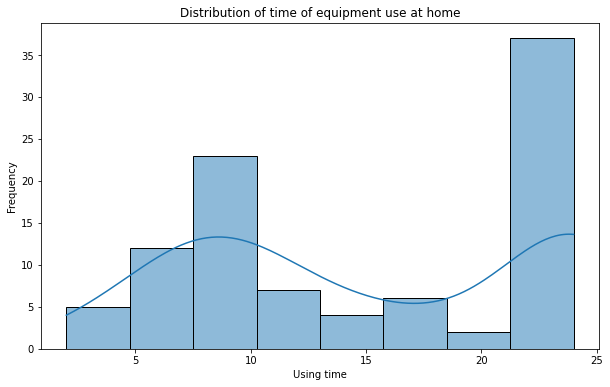

In [32]:
# Using of equipment
plt.figure(figsize=(10,6))
sns.histplot(df1['U_time'], kde=True)
plt.title('Distribution of time of equipment use at home')
plt.ylabel('Frequency')
plt.xlabel('Using time')
plt.show('png')

Patients are divided into two groups: round-the-clock equipment usage and hourly usage

In [33]:
# using 24 hours
df1.query("U_time == 24")['U_time'].value_counts()

24.0    37
Name: U_time, dtype: int64

In [34]:
# using 24 hours in groups
df1.query("U_time == 24").groupby('group', as_index=False)['U_time'].count()

,group,U_time
0,1,7
1,2,5
2,3,25


37 patients use equipment 24 hours per day. 7 in group 1, 5 in group 2 and 25 in group 3

<a id='Comparison_of_time_distribution_of_equipment_use_in_therapy_groups'></a>
##### Comparison of time distribution of equipment use in therapy groups
[Table of contents](#content)

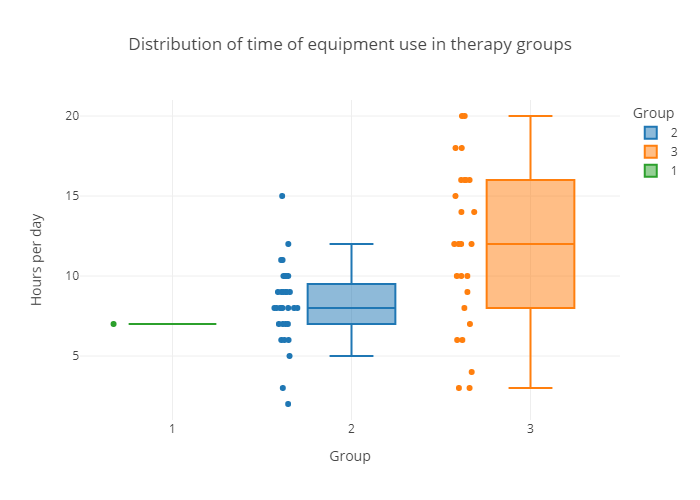

In [35]:
# time of equipment using and therapy groups
fig = px.box(df1.query("U_time != 24"), x="group", y="U_time", color = "group", points="all", 
            template="gridon",
            labels = {"group": 'Group', 'U_time': 'Hours per day'},
            title = 'Distribution of time of equipment use in therapy groups')
fig.show('png')

In [36]:
# t-test
a = df1.query("U_time != 24 and group==2")['U_time']
b = df1.query("U_time != 24 and group==3")['U_time']

stats.ttest_ind(a, b, equal_var=False, nan_policy='omit', alternative='two-sided')

Ttest_indResult(statistic=-3.309965922371997, pvalue=0.0021886474229130533)

In [37]:
for_tuek = df1.query("U_time != 24 and (group==2 or group==3)")[['U_time', 'group']].dropna()

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog=for_tuek['U_time'],
groups=for_tuek['group'],
alpha= 0.05)

#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
     2      3   3.5889 0.0008 1.5533 5.6246   True
--------------------------------------------------


In [38]:
data_u_time_by_group = (df1.query("U_time != 24 and (group==2 or group==3)")[['U_time', 'group']].dropna()
            .groupby('group', as_index=False)['U_time'].agg({'mean', 'sem'}))
data_u_time_by_group['95% CI low'] = data_u_time_by_group['mean'] - data_u_time_by_group['sem'] * 1.96
data_u_time_by_group['95% CI up'] = data_u_time_by_group['mean'] + data_u_time_by_group['sem'] * 1.96
print(data_u_time_by_group)

            sem       mean  95% CI low  95% CI up
group                                            
2      0.437032   8.218750    7.362168   9.075332
3      0.992308  11.807692    9.862769  13.752615


The mean equipment usage time in Group 2 is 4 hours less than the mean equipment usage time in Group 3 (μ = 8 [95% ДИ 7 – 9] vs μ = 12 [95% ДИ 10 – 14], p<0.001) 

<a id='Quantitative_data'></a>
### Quantitative (scales) data
[Table of contents](#content)

In [39]:
def box_plot_group(data, group1, group2, title, y_axis):#, y_lim):
    
    print(group2)
   
    # descriptive statistics
    print(data[[group1, group2]].dropna().groupby(group1, as_index='False')[group2].agg({'describe', 'sem', 'skew'}))
    print('kurt')
    print(data[[group1, group2]].dropna().groupby(group1).apply(pd.DataFrame.kurt))

    
    # hist and qq plot      
    for item in data['number_of_visit'].unique().tolist():
        plt.rcParams['figure.figsize'] = [12, 6]
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.suptitle(str(group2) + ' QQ Plot Visit ' + str(item), fontsize=18)
        
        
        # Q-Q Plot graph
        stats.probplot(data.query('number_of_visit == @item')[group2].dropna(), plot=ax1)
        ax1.set_title("Normal Q-Q Plot")

        # normal distribution histogram + distribution
        sns.histplot(data.query('number_of_visit == @item')[group2].dropna(), kde=True)
        plt.show('png')
    
    # distribution by visits
    fig = px.box(data, x=group1, y=group2, color = group1, points="all", 
            template="gridon",
            labels = {group2: y_axis, 'number_of_visit': 'Number of visit'},
            title = title)
    fig.show('png')

    
    # mean changing
    data_mean = (data.groupby(group1)[group2].agg({'mean', 'median', 'sem'}).reset_index())   
    print(data_mean)
    
    fig = go.Figure(data=go.Scatter(
        x=data_mean['number_of_visit'].astype('str').tolist(),
        y=data_mean['mean'].tolist(),
        error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=(data_mean['sem']*1.96).tolist(),
            visible=True)
    ))

    fig.update_layout(title=title)
    fig.update_layout(template='gridon')
    fig.update_yaxes(title='Mean (95% CI)')
    fig.show('png')
    

    
    print('//////////////////////////////////////////////////////////////////////////////////////')

col1
                describe                                                     \
                   count       mean       std   min   25%   50%   75%   max   
number_of_visit                                                               
1                   97.0  93.783505  3.816703  78.0  92.0  95.0  96.0  99.0   
2                   87.0  93.977011  4.057657  80.0  92.0  95.0  97.0  99.0   
3                   78.0  94.179487  3.638694  81.0  93.0  95.0  97.0  99.0   
4                   73.0  94.520548  3.753182  83.0  93.0  95.0  98.0  99.0   

                      sem      skew  
                     col1      col1  
number_of_visit                      
1                0.387528 -1.111013  
2                0.435027 -1.350051  
3                0.412001 -1.391459  
4                0.439277 -1.345704  
kurt
                 number_of_visit      col1
number_of_visit                           
1                            0.0  2.151714
2                            0.0  2.09414

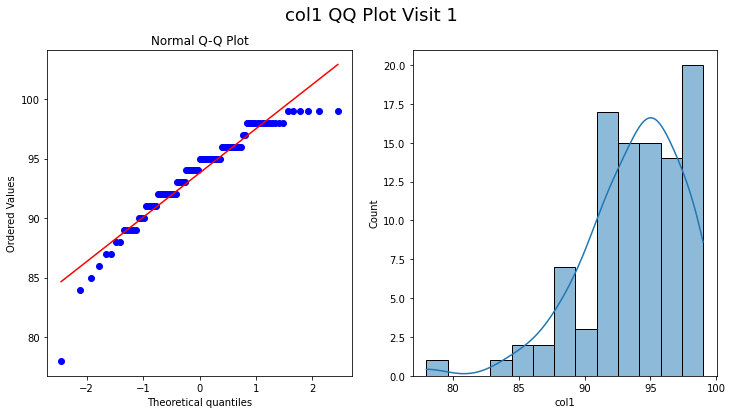

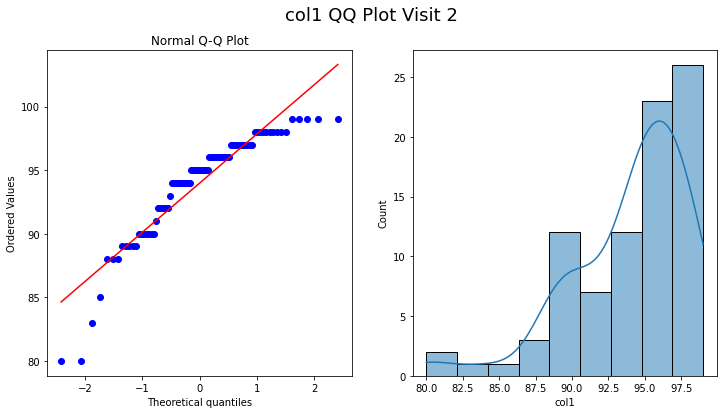

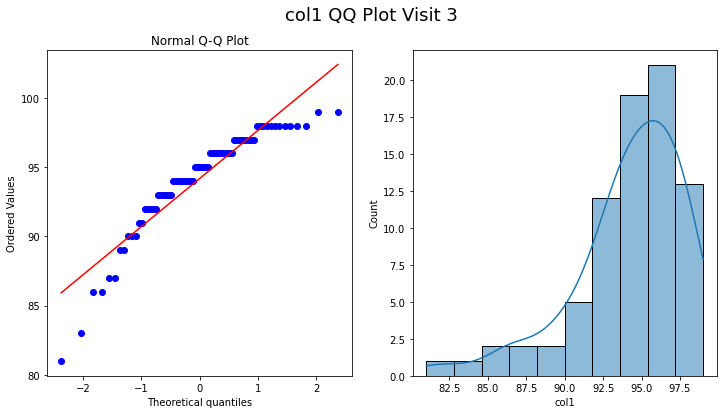

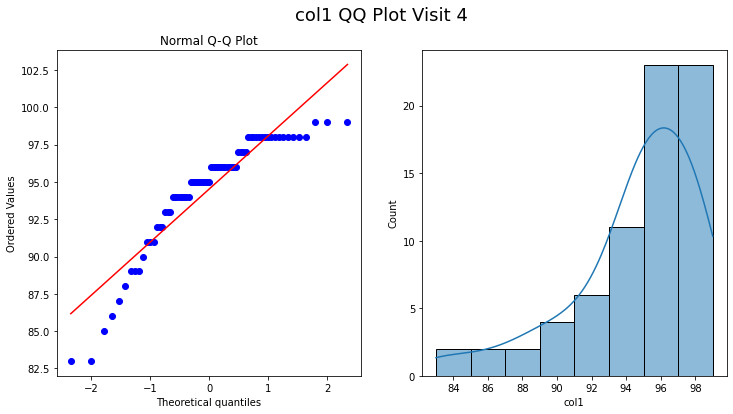

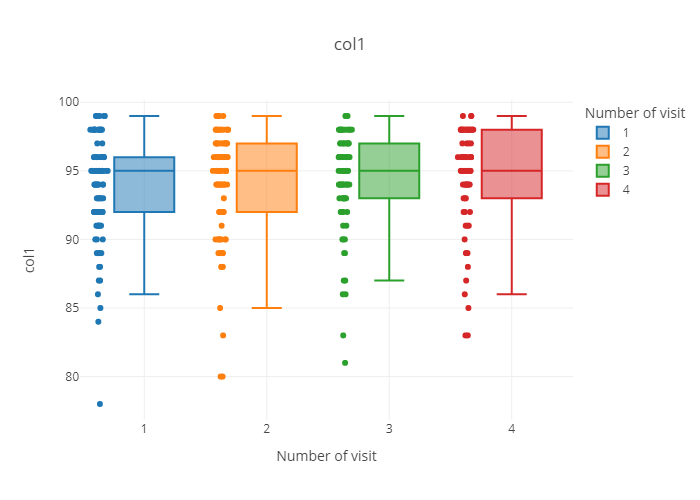

   number_of_visit  median       sem       mean
0                1    95.0  0.387528  93.783505
1                2    95.0  0.435027  93.977011
2                3    95.0  0.412001  94.179487
3                4    95.0  0.439277  94.520548


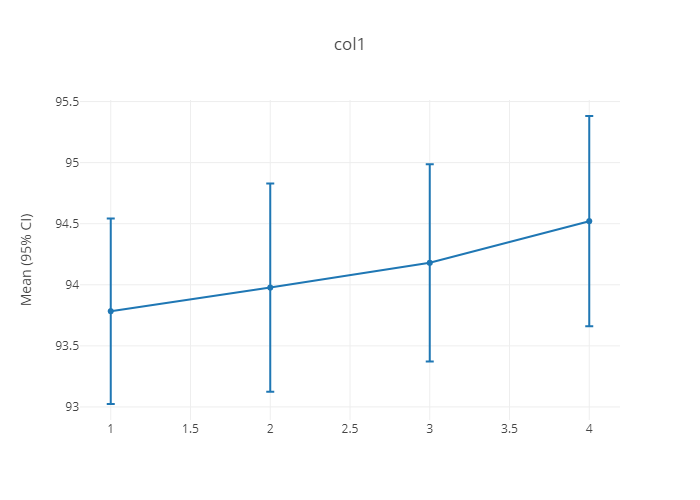

//////////////////////////////////////////////////////////////////////////////////////
col2
                describe                                                 \
                   count       mean        std   min   25%   50%    75%   
number_of_visit                                                           
1                   97.0  85.938144  15.283988  51.0  76.0  86.0  95.00   
2                   86.0  81.011628  13.719453  56.0  71.0  80.0  88.00   
3                   78.0  82.371795  14.626172  50.0  72.5  80.0  89.75   
4                   73.0  83.876712  13.098924  52.0  78.0  80.0  90.00   

                             sem      skew  
                   max      col2      col2  
number_of_visit                             
1                124.0  1.551854  0.100694  
2                122.0  1.479407  0.824584  
3                120.0  1.656088  0.501935  
4                130.0  1.533113  0.891601  
kurt
                 number_of_visit      col2
number_of_visit    

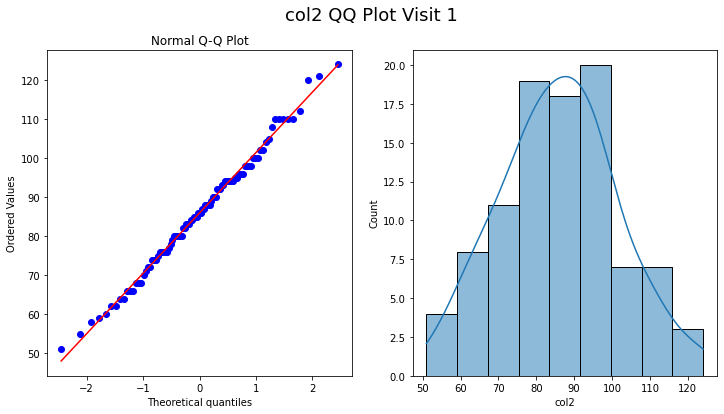

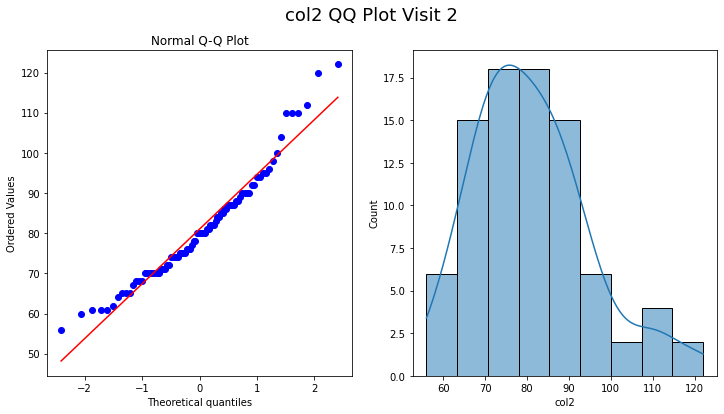

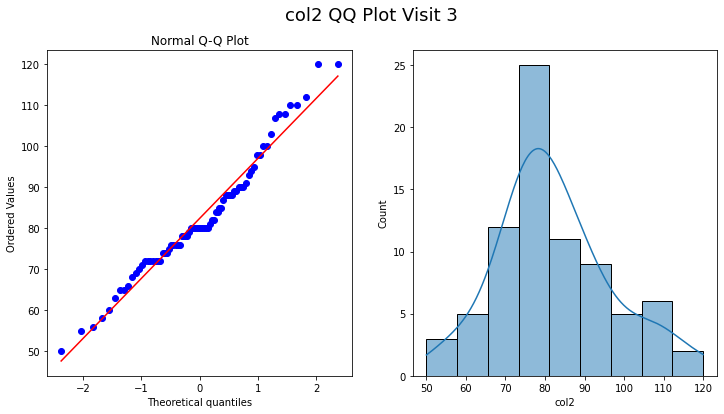

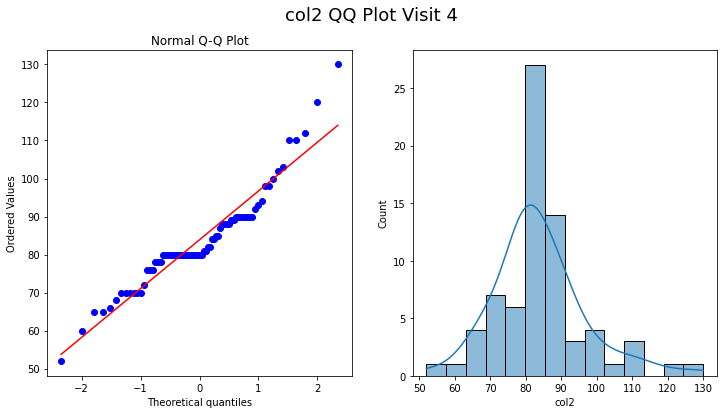

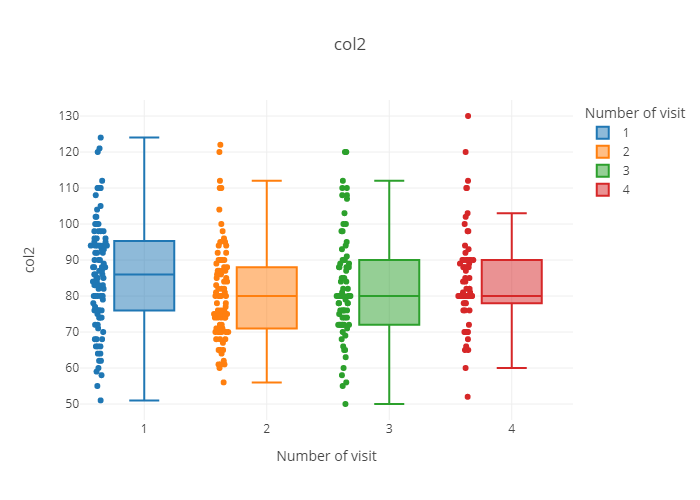

   number_of_visit  median       sem       mean
0                1    86.0  1.551854  85.938144
1                2    80.0  1.479407  81.011628
2                3    80.0  1.656088  82.371795
3                4    80.0  1.533113  83.876712


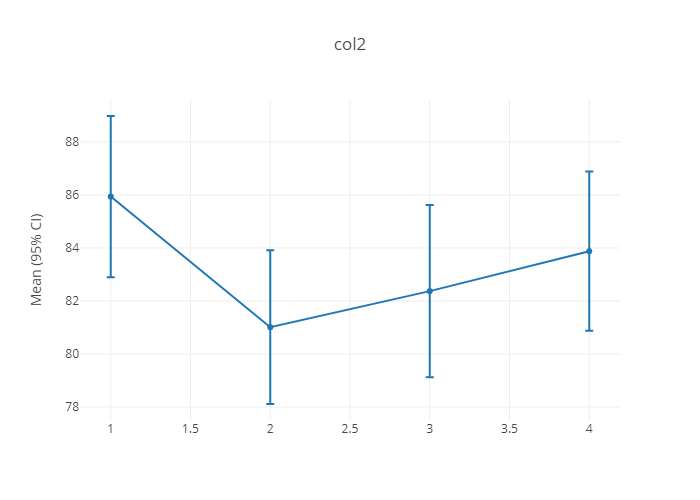

//////////////////////////////////////////////////////////////////////////////////////
col3
                describe                                                     \
                   count       mean       std   min   25%   50%   75%   max   
number_of_visit                                                               
1                   96.0  22.114583  3.612463  14.0  20.0  22.0  24.0  34.0   
2                   86.0  20.813953  3.306007  14.0  18.0  20.0  24.0  34.0   
3                   78.0  20.294872  3.231778  12.0  18.0  20.0  22.0  30.0   
4                   73.0  20.671233  3.050750  16.0  18.0  20.0  22.0  28.0   

                      sem      skew  
                     col3      col3  
number_of_visit                      
1                0.368695  0.341761  
2                0.356496  0.611707  
3                0.365927  0.248608  
4                0.357063  0.523819  
kurt
                 number_of_visit      col3
number_of_visit                         

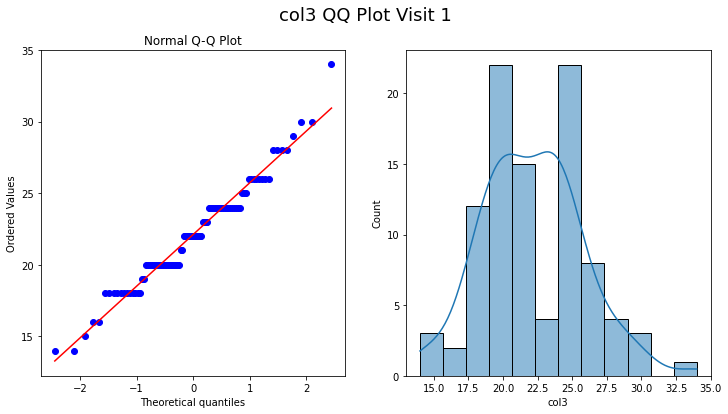

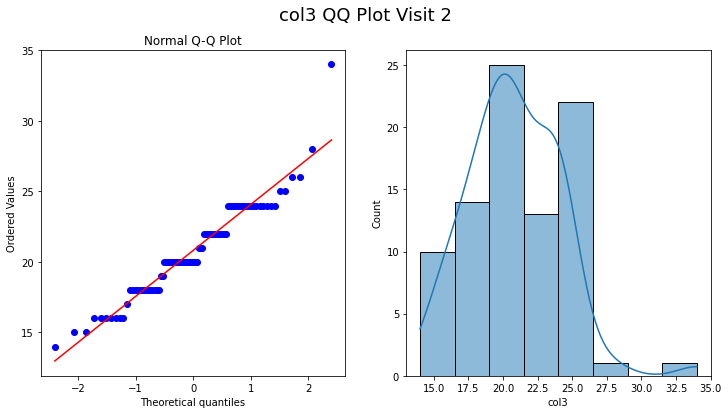

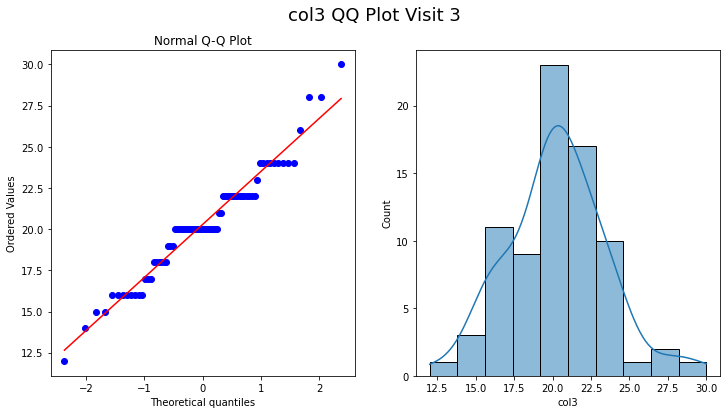

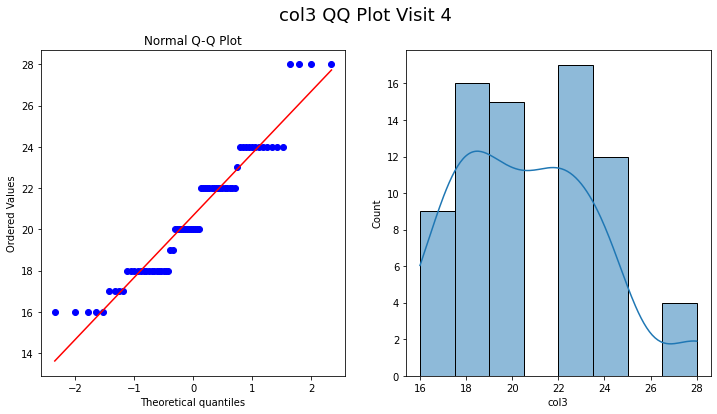

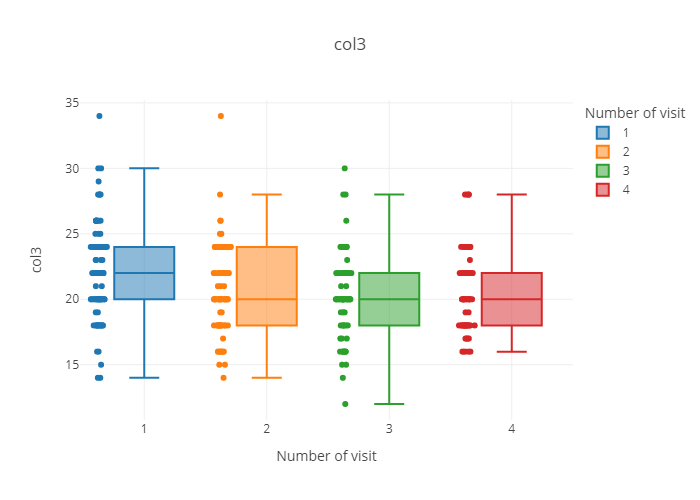

   number_of_visit  median       sem       mean
0                1    22.0  0.368695  22.114583
1                2    20.0  0.356496  20.813953
2                3    20.0  0.365927  20.294872
3                4    20.0  0.357063  20.671233


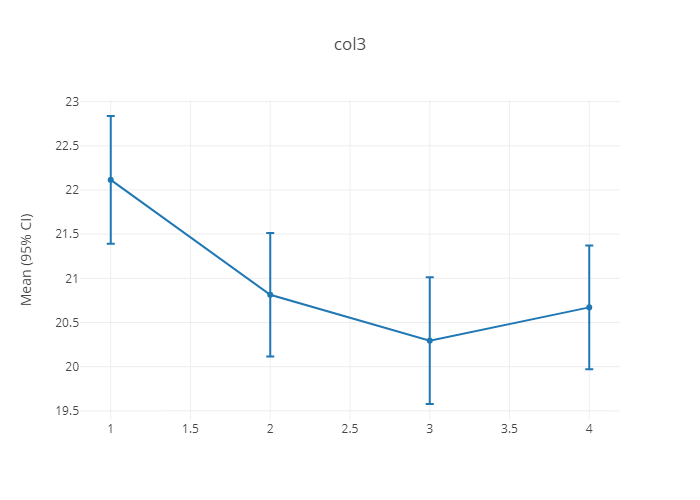

//////////////////////////////////////////////////////////////////////////////////////
col4
                describe                                                      \
                   count        mean        std    min    25%    50%     75%   
number_of_visit                                                                
1                   97.0  128.680412  18.764187   85.0  118.0  130.0  140.00   
2                   86.0  127.430233  17.055302  100.0  115.0  129.0  138.75   
3                   78.0  127.743590  16.676787  100.0  115.0  130.0  140.00   
4                   73.0  126.465753  13.951386  100.0  115.0  130.0  136.00   

                             sem      skew  
                   max      col4      col4  
number_of_visit                             
1                184.0  1.905215  0.370047  
2                195.0  1.839120  1.091197  
3                185.0  1.888274  0.884210  
4                165.0  1.632886  0.118159  
kurt
                 number_of_

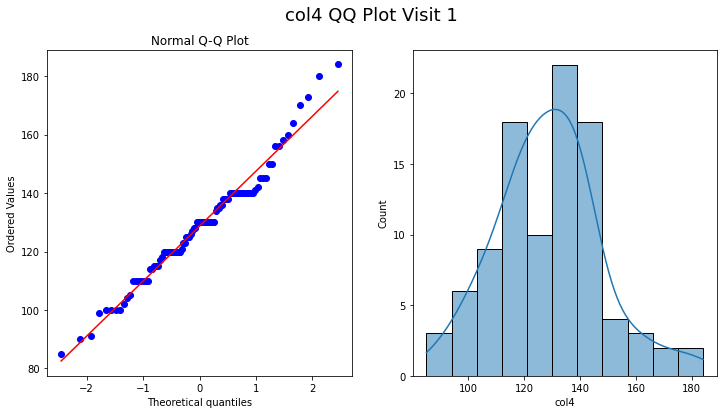

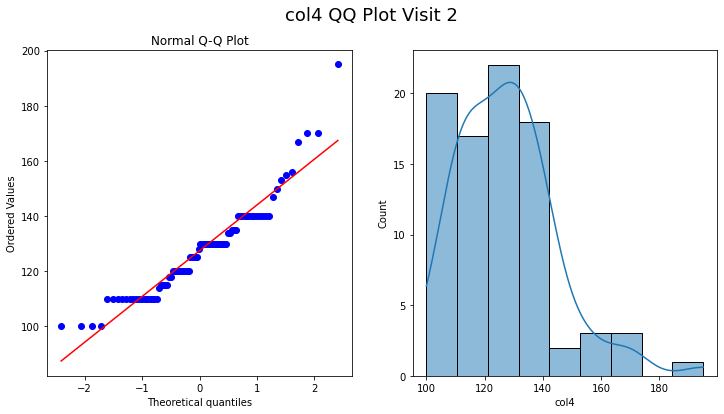

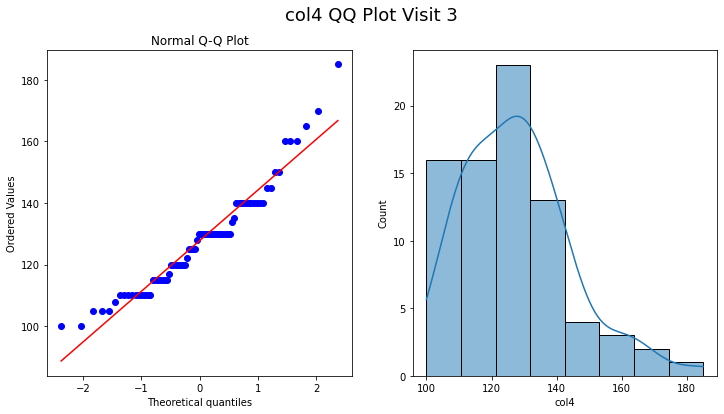

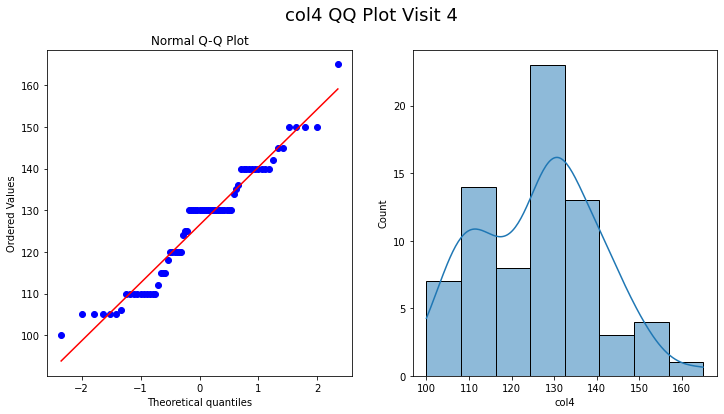

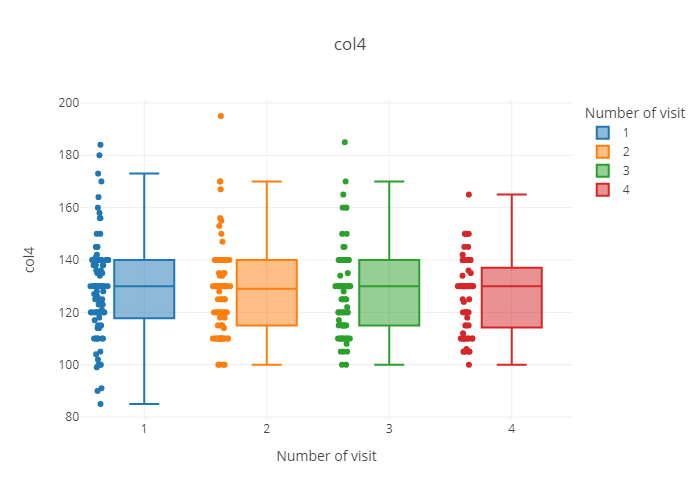

   number_of_visit  median       sem        mean
0                1   130.0  1.905215  128.680412
1                2   129.0  1.839120  127.430233
2                3   130.0  1.888274  127.743590
3                4   130.0  1.632886  126.465753


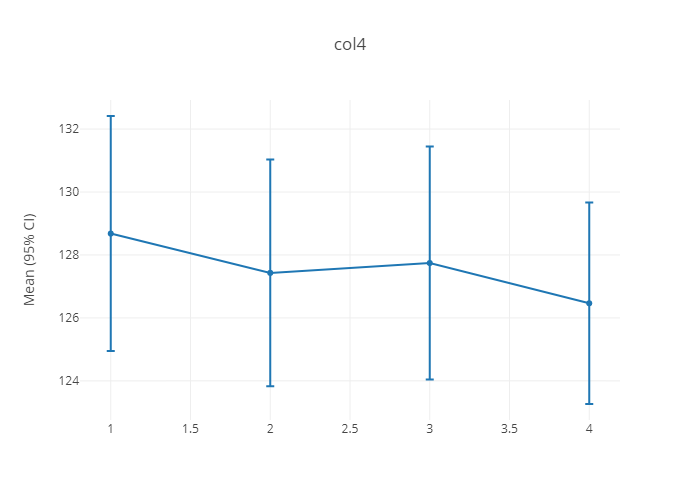

//////////////////////////////////////////////////////////////////////////////////////
col5
                describe                                                       \
                   count       mean        std   min   25%   50%   75%    max   
number_of_visit                                                                 
1                   97.0  77.041237  10.485027  45.0  70.0  80.0  80.0  100.0   
2                   86.0  77.174419  11.043435  60.0  70.0  80.0  80.0  120.0   
3                   78.0  77.500000  12.110691  50.0  70.0  80.0  80.0  110.0   
4                   73.0  77.205479  10.058107  50.0  70.0  80.0  80.0  100.0   

                      sem      skew  
                     col5      col5  
number_of_visit                      
1                1.064593 -0.552685  
2                1.190844  0.488796  
3                1.371266  0.365880  
4                1.177212 -0.160826  
kurt
                 number_of_visit      col5
number_of_visit           

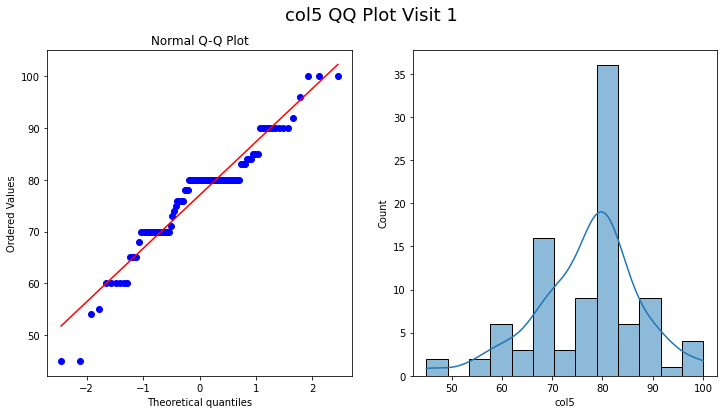

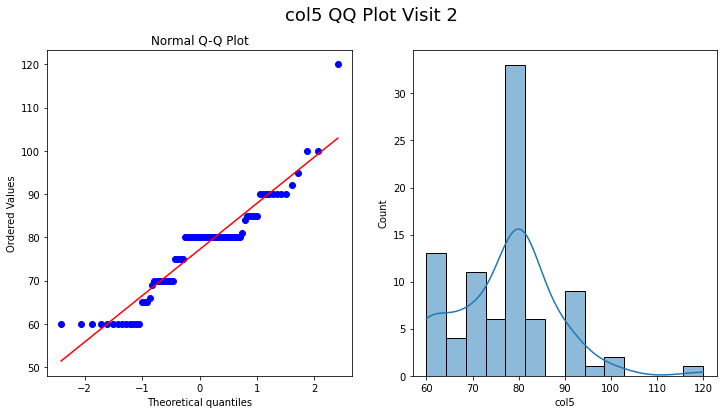

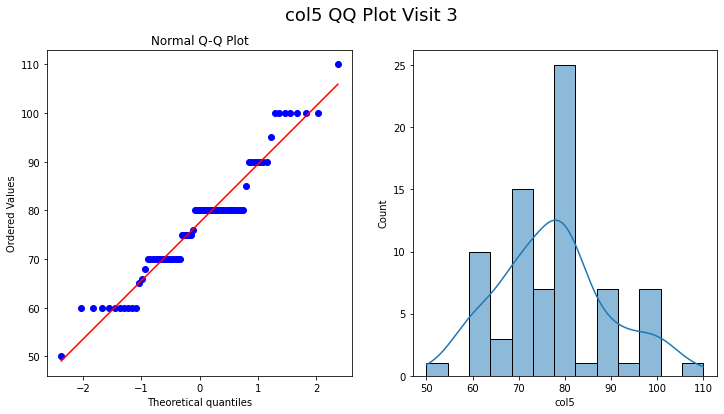

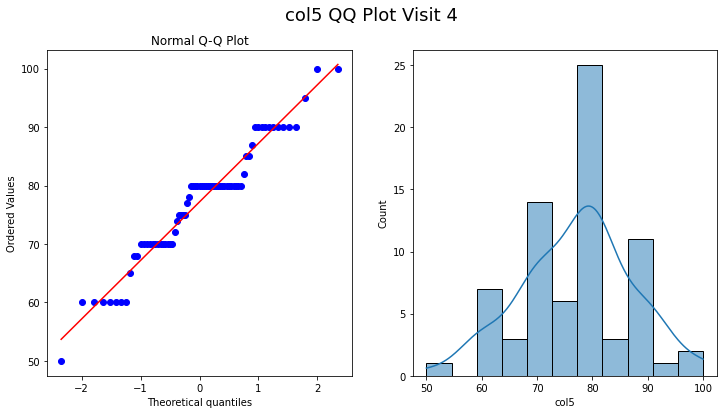

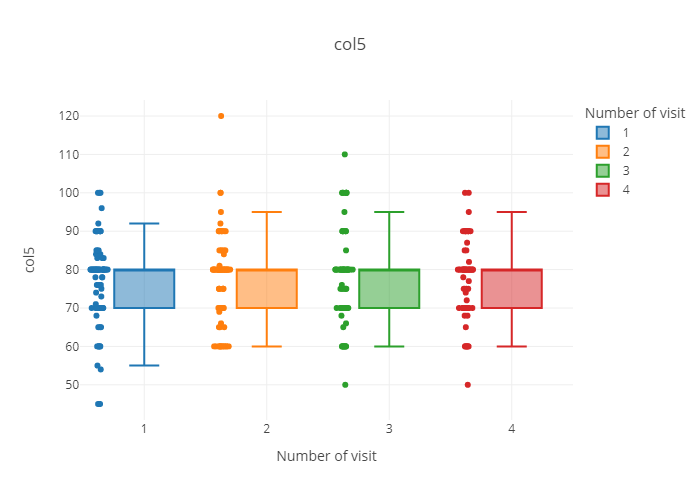

   number_of_visit  median       sem       mean
0                1    80.0  1.064593  77.041237
1                2    80.0  1.190844  77.174419
2                3    80.0  1.371266  77.500000
3                4    80.0  1.177212  77.205479


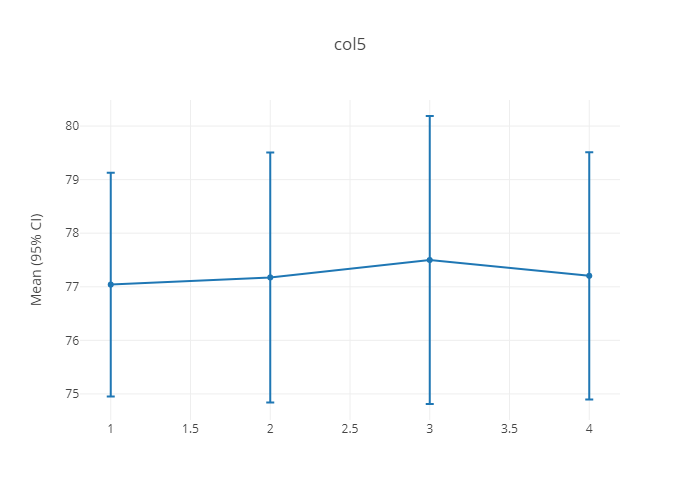

//////////////////////////////////////////////////////////////////////////////////////
col6
                describe                                                       \
                   count       mean        std   min   25%   50%   75%    max   
number_of_visit                                                                 
1                   56.0  42.000000  17.648075  20.0  30.0  35.0  50.0   80.0   
2                   63.0  46.317460  17.670666  20.0  31.5  40.0  57.5   90.0   
3                   55.0  57.763636  20.204477  10.0  42.5  60.0  75.0  100.0   
4                   37.0  59.297297  19.774935  15.0  50.0  60.0  70.0  100.0   

                      sem      skew  
                     col6      col6  
number_of_visit                      
1                2.358323  0.730769  
2                2.226295  0.569791  
3                2.724371 -0.179960  
4                3.250979 -0.480431  
kurt
                 number_of_visit      col6
number_of_visit           

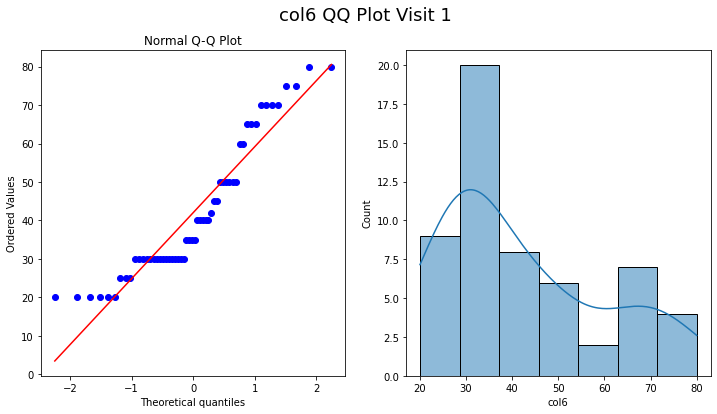

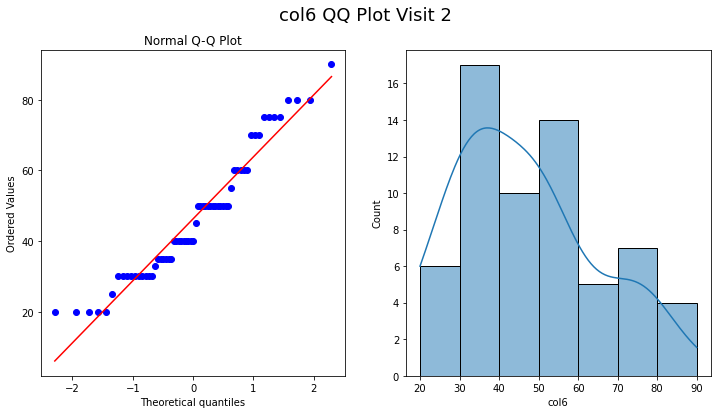

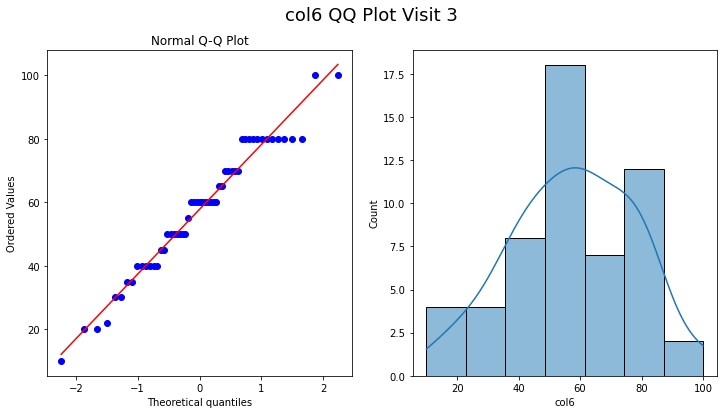

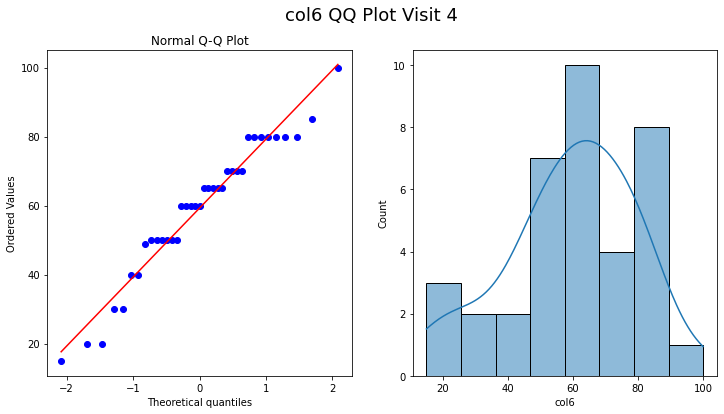

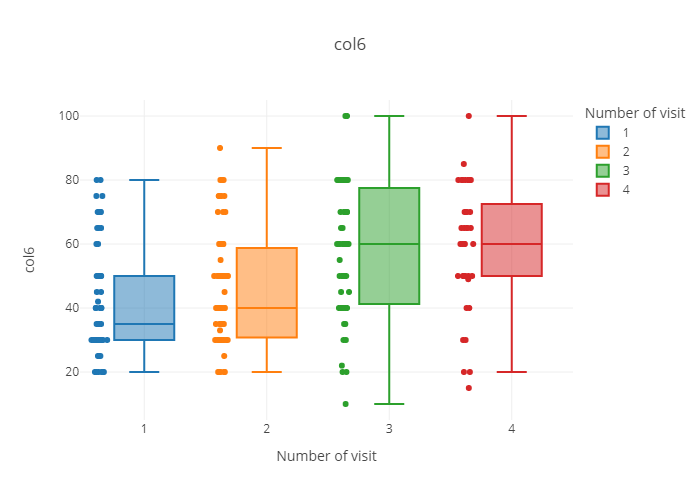

   number_of_visit  median       sem       mean
0                1    35.0  2.358323  42.000000
1                2    40.0  2.226295  46.317460
2                3    60.0  2.724371  57.763636
3                4    60.0  3.250979  59.297297


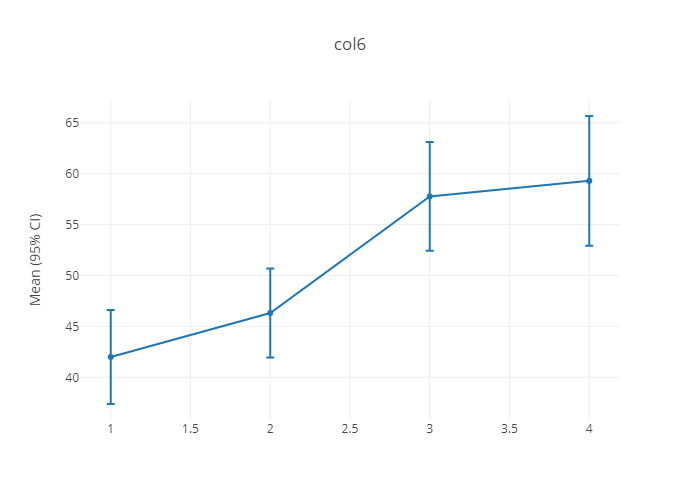

//////////////////////////////////////////////////////////////////////////////////////
col7
                describe                                                 \
                   count       mean        std   min   25%   50%    75%   
number_of_visit                                                           
1                   83.0  77.867470  16.899106  40.0  75.0  75.0   85.0   
2                   74.0  87.324324  17.510942  50.0  75.0  85.0  100.0   
3                   55.0  92.945455  18.326684  50.0  80.0  95.0  112.5   
4                   37.0  93.648649  15.619105  50.0  85.0  95.0  100.0   

                             sem      skew  
                   max      col7      col7  
number_of_visit                             
1                115.0  1.854918  0.286483  
2                120.0  2.035606  0.055940  
3                120.0  2.471170 -0.230818  
4                120.0  2.567765 -0.387675  
kurt
                 number_of_visit      col7
number_of_visit    

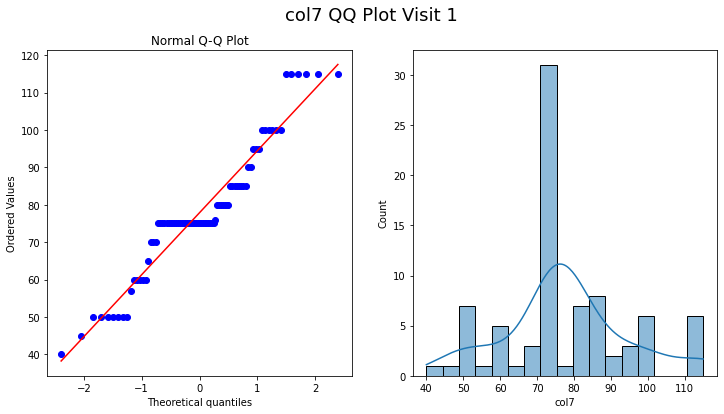

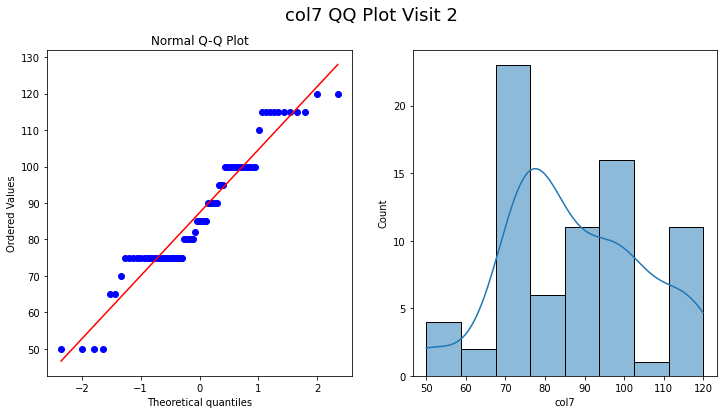

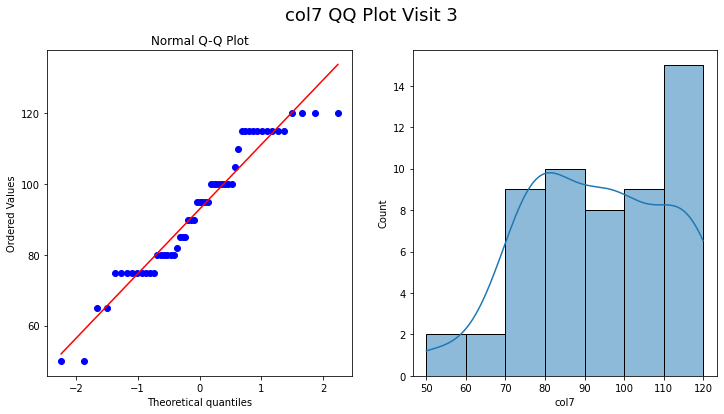

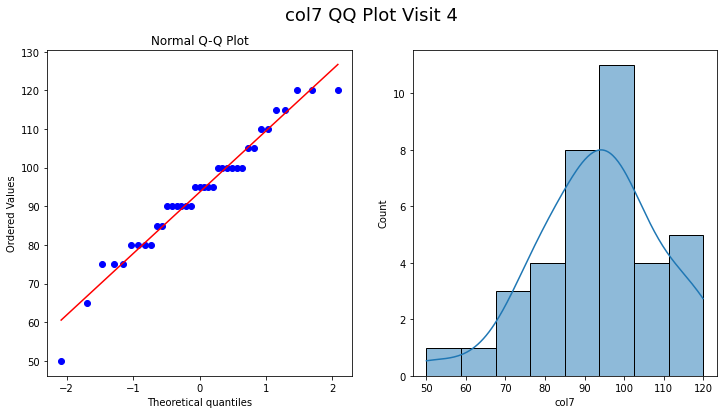

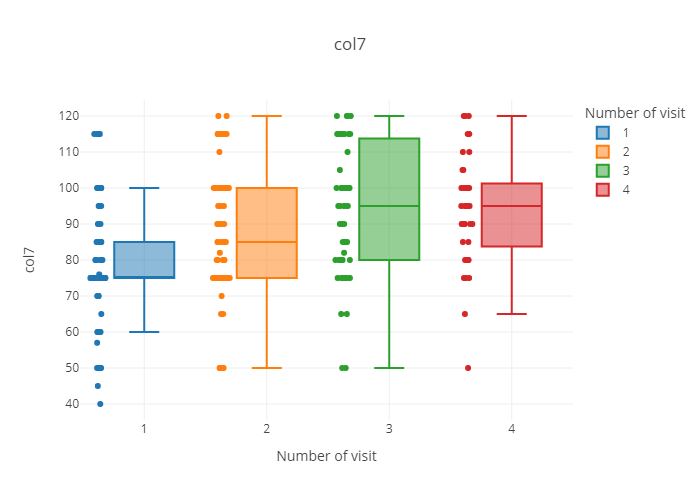

   number_of_visit  median       sem       mean
0                1    75.0  1.854918  77.867470
1                2    85.0  2.035606  87.324324
2                3    95.0  2.471170  92.945455
3                4    95.0  2.567765  93.648649


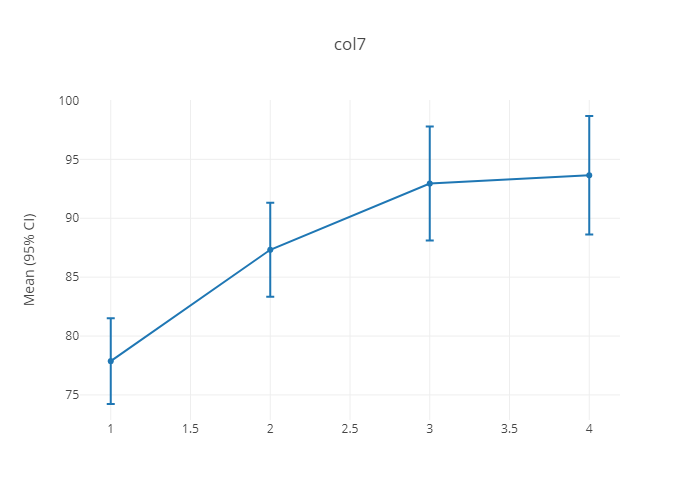

//////////////////////////////////////////////////////////////////////////////////////
col8
                describe                                                  \
                   count      mean       std  min  25%  50%    75%   max   
number_of_visit                                                            
1                   91.0  9.010989  4.578924  0.0  6.0  8.0  12.00  18.0   
2                   75.0  9.013333  4.777462  0.0  6.0  7.0  12.00  20.0   
3                   72.0  9.041667  4.470364  0.0  6.0  8.0  11.25  19.0   
4                   70.0  9.257143  4.312724  0.0  6.0  8.0  12.00  20.0   

                      sem      skew  
                     col8      col8  
number_of_visit                      
1                0.480002  0.499710  
2                0.551654  0.672207  
3                0.526837  0.739397  
4                0.515469  0.720663  
kurt
                 number_of_visit      col8
number_of_visit                           
1                 

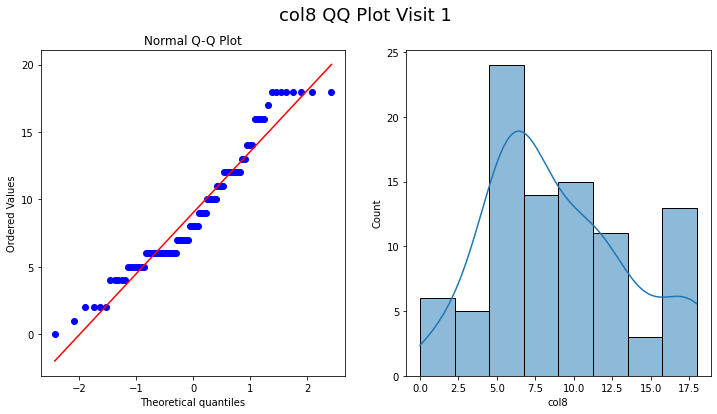

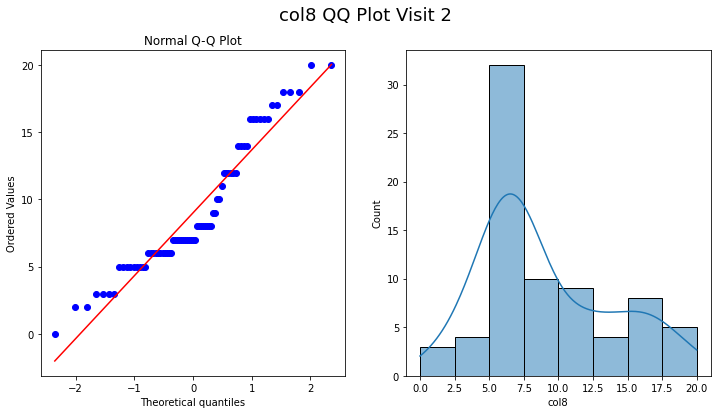

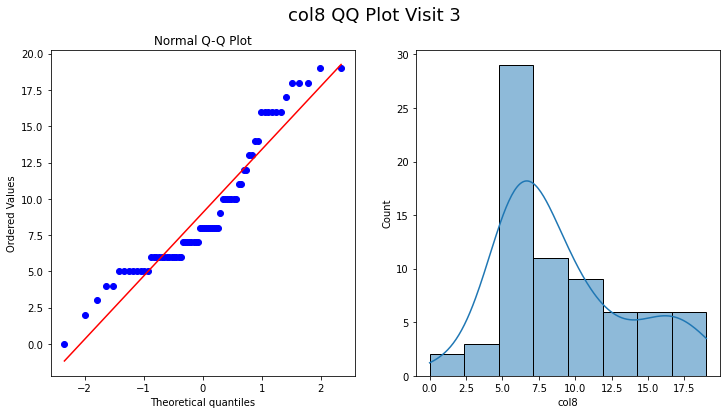

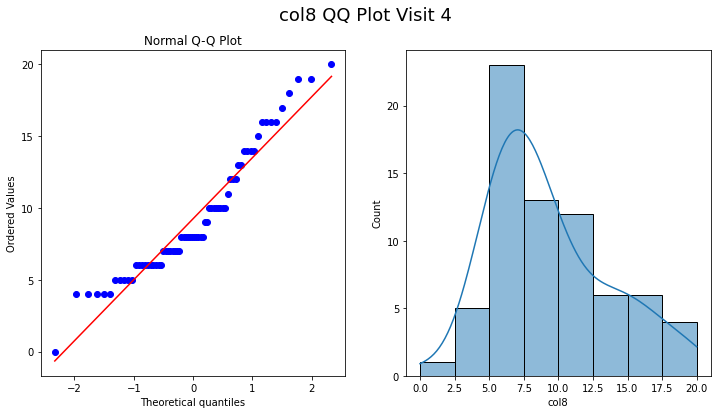

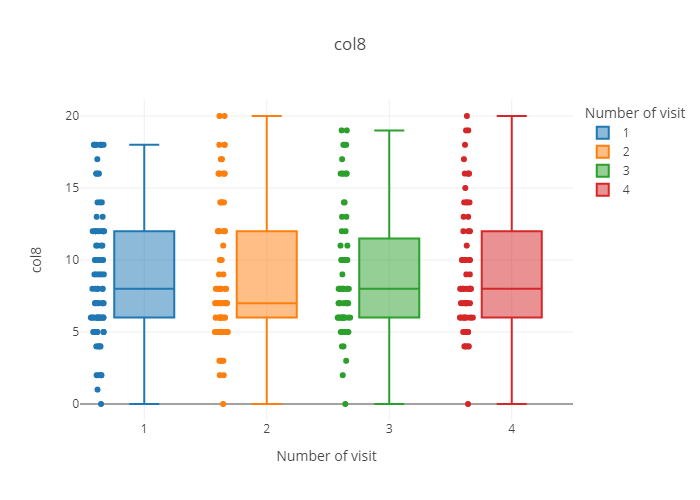

   number_of_visit  median       sem      mean
0                1     8.0  0.480002  9.010989
1                2     7.0  0.551654  9.013333
2                3     8.0  0.526837  9.041667
3                4     8.0  0.515469  9.257143


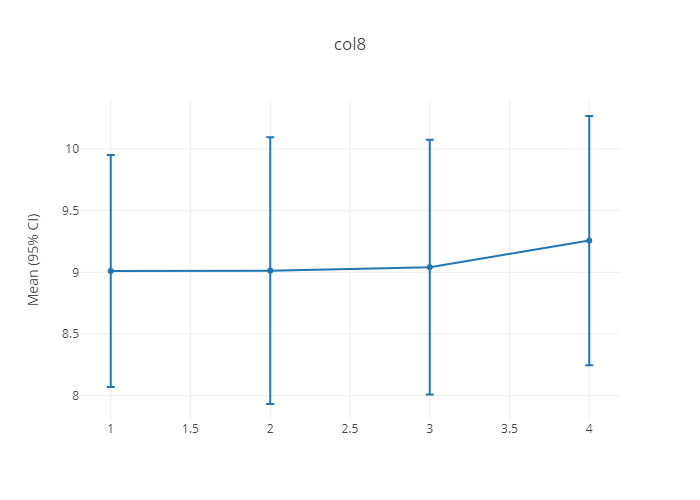

//////////////////////////////////////////////////////////////////////////////////////
col9
                describe                                                       \
                   count       mean        std  min    25%   50%    75%   max   
number_of_visit                                                                 
1                   74.0  39.662162  14.697197  6.0  28.25  39.0  50.00  75.0   
2                   59.0  33.050847  17.350766  0.0  21.50  34.0  42.50  80.0   
3                   70.0  29.685714  19.448589  1.0  14.00  27.5  45.75  76.0   
4                   69.0  27.000000  16.773579  1.0  15.00  26.0  32.00  80.0   

                      sem      skew  
                     col9      col9  
number_of_visit                      
1                1.708514 -0.020943  
2                2.258877  0.349222  
3                2.324551  0.561137  
4                2.019302  0.945431  
kurt
                 number_of_visit      col9
number_of_visit           

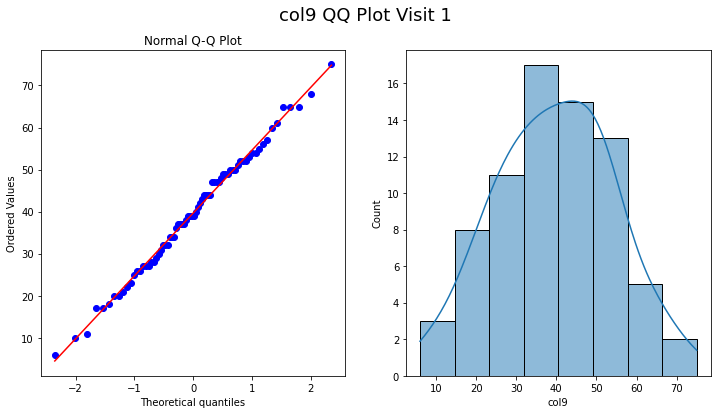

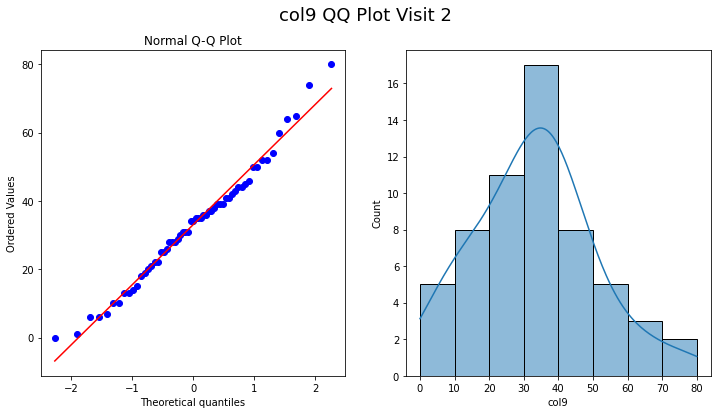

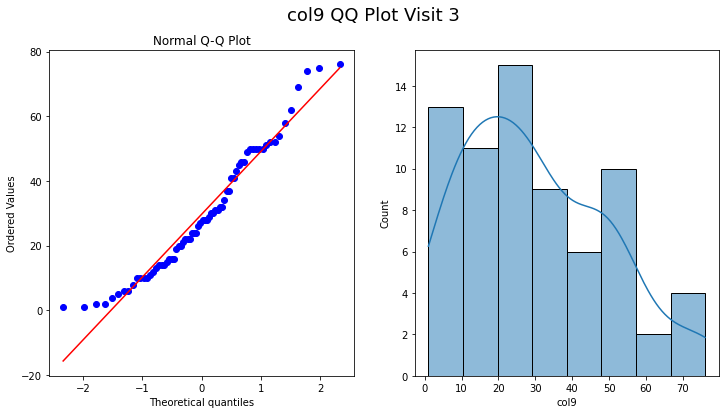

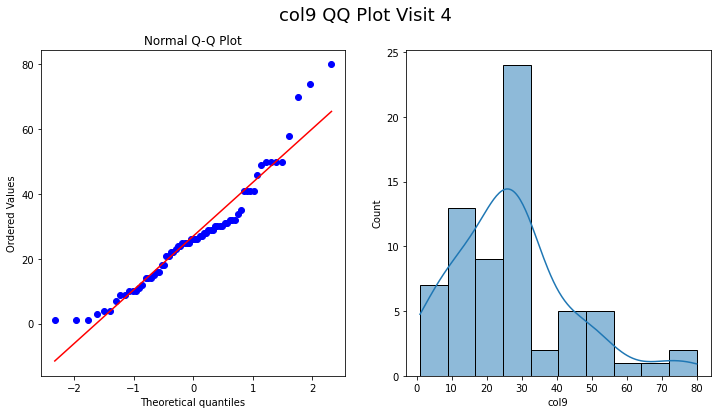

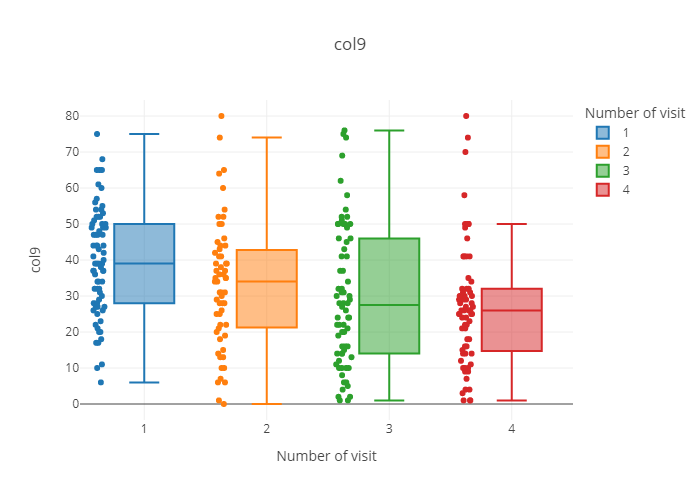

   number_of_visit  median       sem       mean
0                1    39.0  1.708514  39.662162
1                2    34.0  2.258877  33.050847
2                3    27.5  2.324551  29.685714
3                4    26.0  2.019302  27.000000


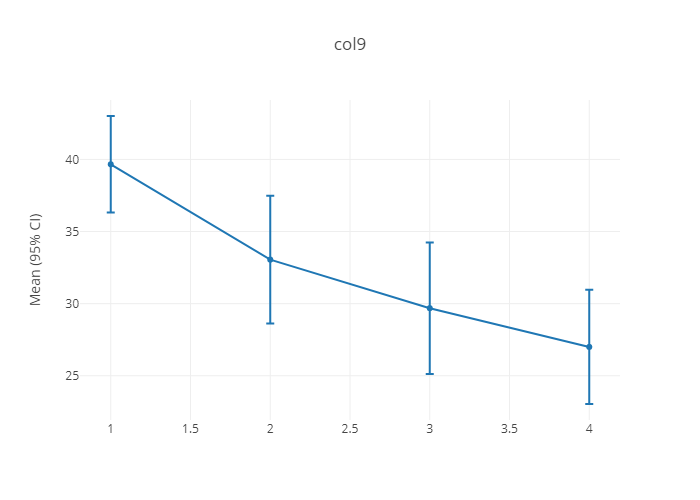

//////////////////////////////////////////////////////////////////////////////////////
col10
                describe                                                       \
                   count       mean        std   min   25%   50%   75%    max   
number_of_visit                                                                 
1                   94.0  54.680851  15.218984  30.0  40.0  50.0  70.0   90.0   
2                   82.0  61.463415  14.412096  30.0  50.0  60.0  70.0   90.0   
3                   74.0  67.027027  16.612401  30.0  60.0  70.0  80.0  100.0   
4                   73.0  62.739726  15.479402  30.0  50.0  60.0  70.0   90.0   

                      sem      skew  
                    col10     col10  
number_of_visit                      
1                1.569718  0.566862  
2                1.591550 -0.110416  
3                1.931152 -0.117851  
4                1.811727  0.149002  
kurt
                 number_of_visit     col10
number_of_visit          

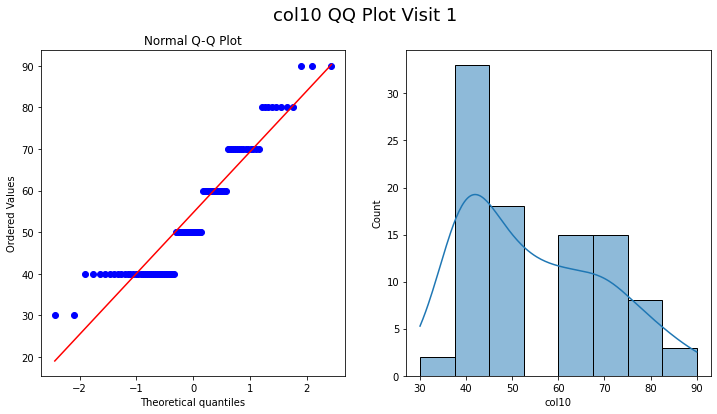

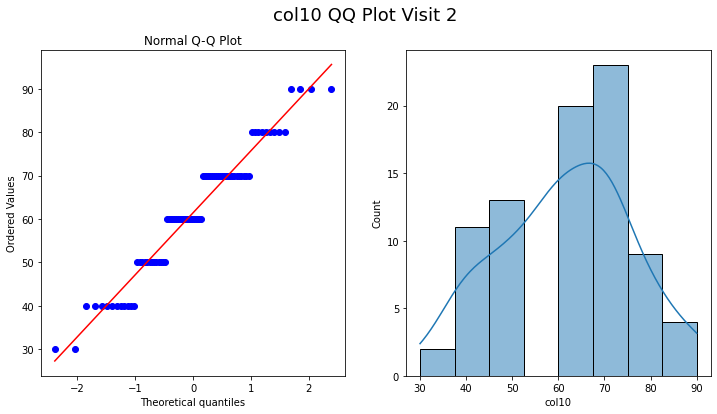

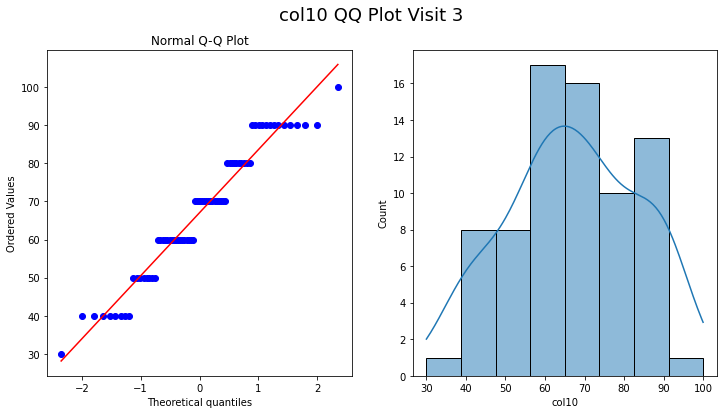

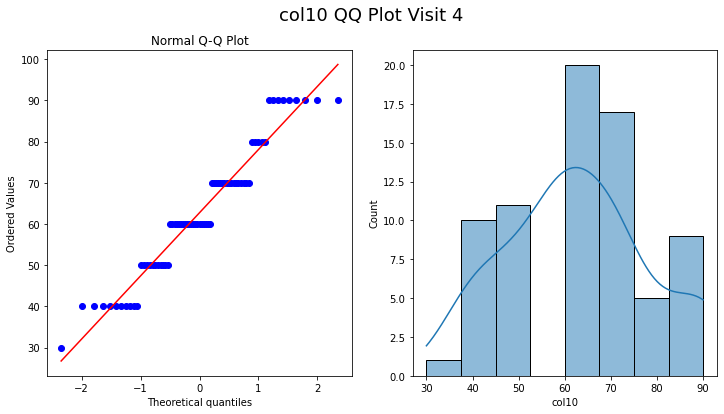

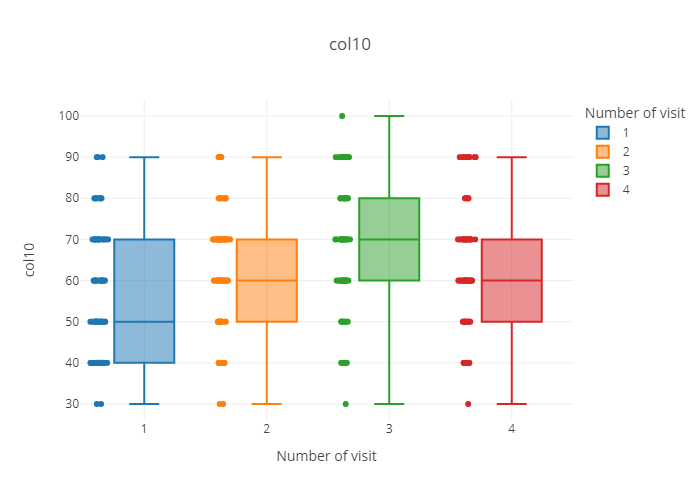

   number_of_visit  median       sem       mean
0                1    50.0  1.569718  54.680851
1                2    60.0  1.591550  61.463415
2                3    70.0  1.931152  67.027027
3                4    60.0  1.811727  62.739726


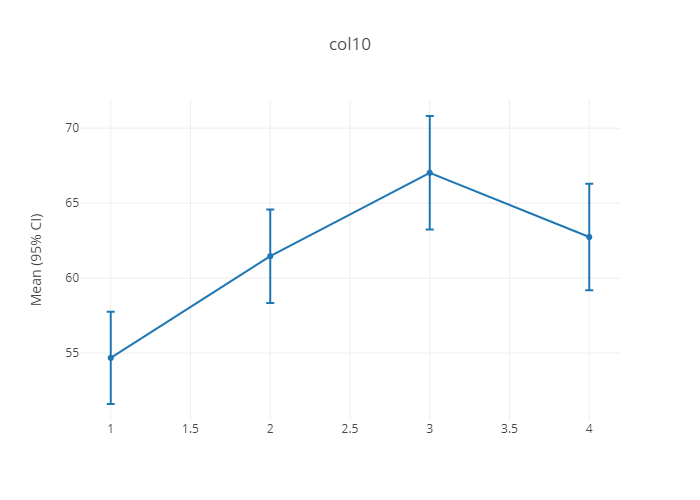

//////////////////////////////////////////////////////////////////////////////////////
col11
                describe                                                     \
                   count       mean       std  min   25%   50%    75%   max   
number_of_visit                                                               
1                   86.0  23.046512  9.298839  0.0  17.0  24.0  29.75  40.0   
2                   76.0  19.039474  9.097166  0.0  12.0  19.5  25.25  36.0   
3                   70.0  17.714286  9.196948  3.0  10.0  17.0  25.00  40.0   
4                   67.0  18.044776  8.929747  0.0  12.0  18.0  25.00  39.0   

                      sem      skew  
                    col11     col11  
number_of_visit                      
1                1.002720 -0.532296  
2                1.043516 -0.104440  
3                1.099246  0.213764  
4                1.090942 -0.004649  
kurt
                 number_of_visit     col11
number_of_visit                        

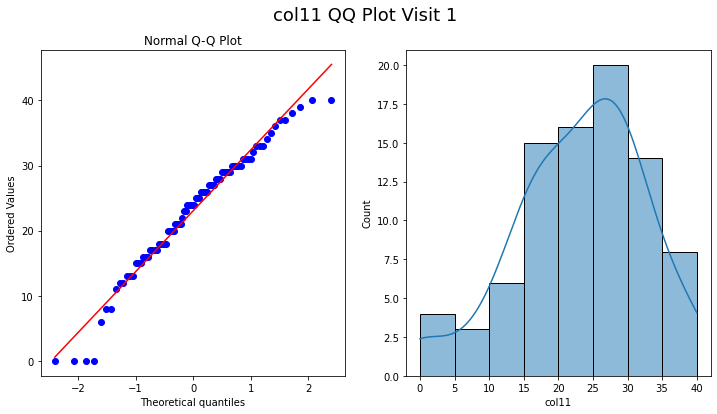

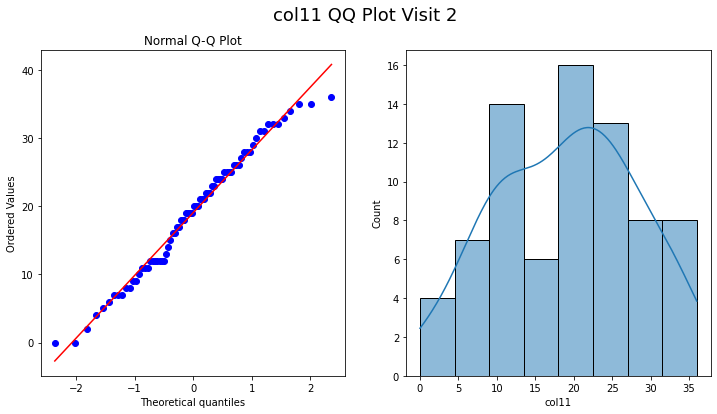

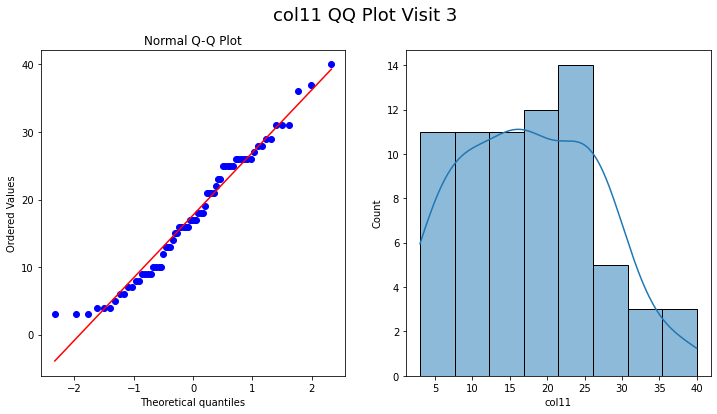

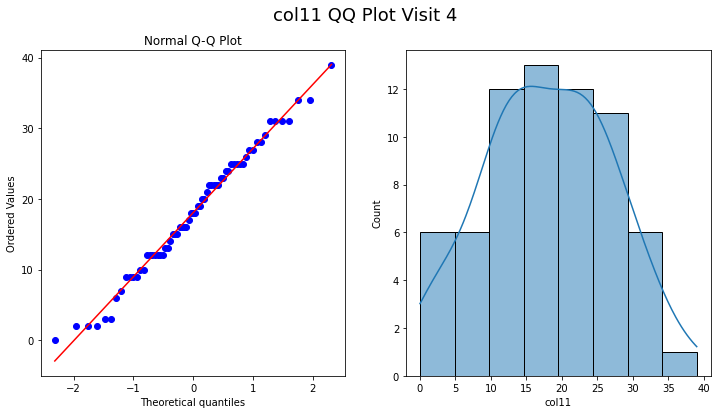

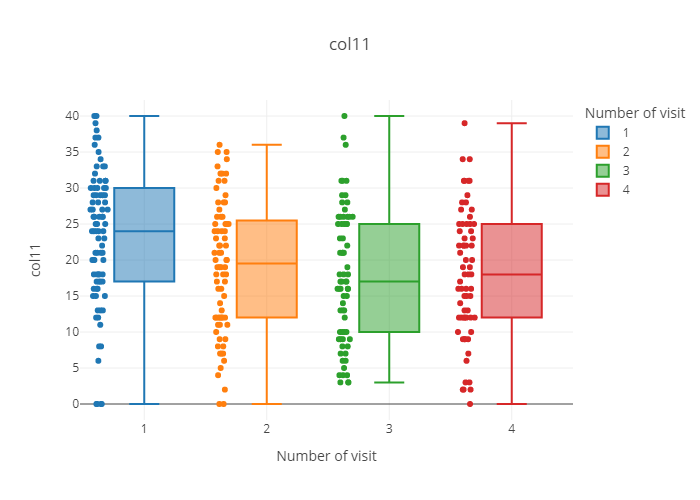

   number_of_visit  median       sem       mean
0                1    24.0  1.002720  23.046512
1                2    19.5  1.043516  19.039474
2                3    17.0  1.099246  17.714286
3                4    18.0  1.090942  18.044776


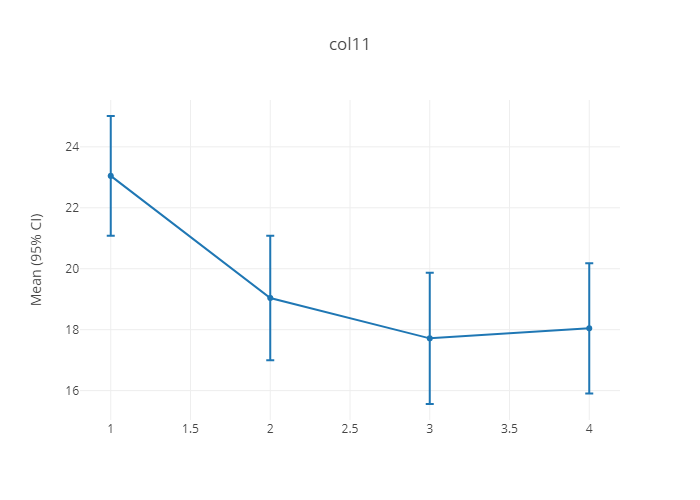

//////////////////////////////////////////////////////////////////////////////////////
col12
                describe                                                \
                   count      mean       std  min  25%  50%  75%   max   
number_of_visit                                                          
1                   90.0  5.233333  2.760272  0.0  4.0  5.0  7.0  12.0   
2                   77.0  4.714286  2.615023  0.0  3.0  5.0  6.0  12.0   
3                   68.0  4.441176  2.994434  0.0  2.0  4.0  6.0  12.0   
4                   66.0  4.621212  2.473025  0.0  3.0  4.0  6.0  12.0   

                      sem      skew  
                    col12     col12  
number_of_visit                      
1                0.290958  0.302264  
2                0.298010  0.488958  
3                0.363129  0.647769  
4                0.304408  0.615042  
kurt
                 number_of_visit     col12
number_of_visit                           
1                            0.

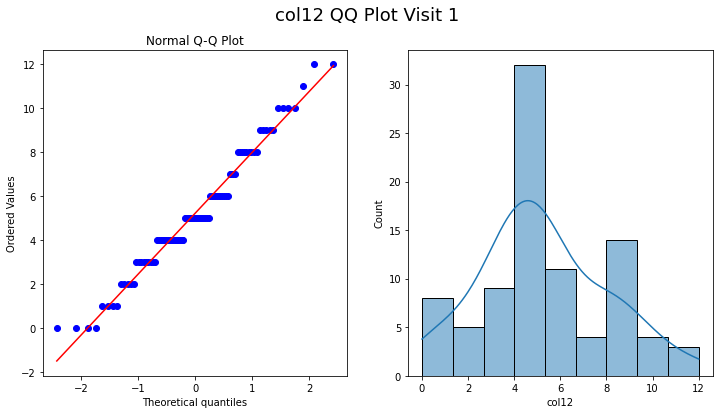

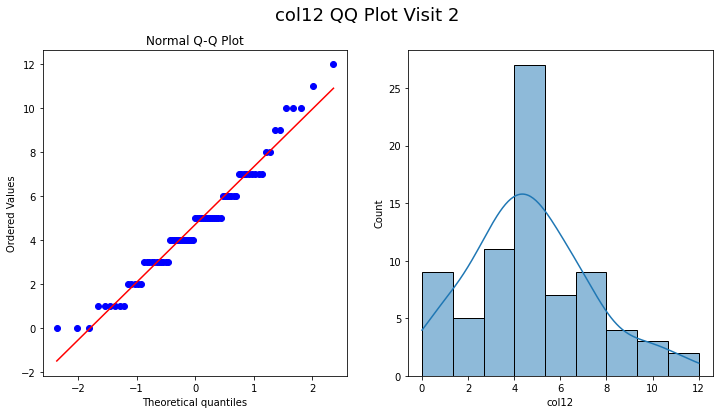

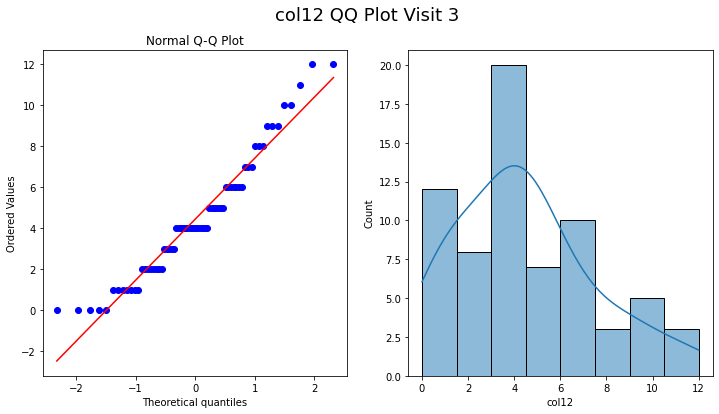

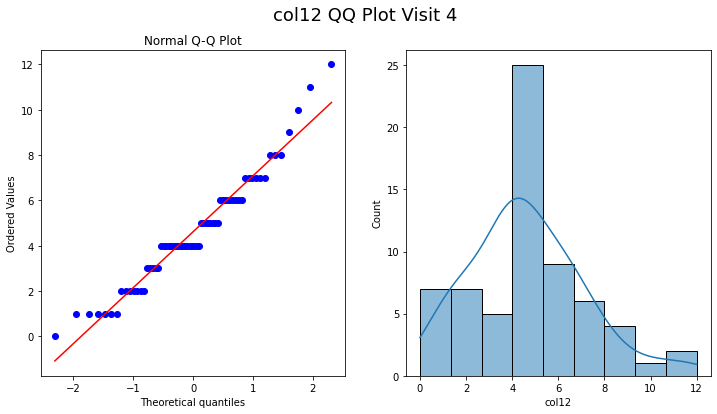

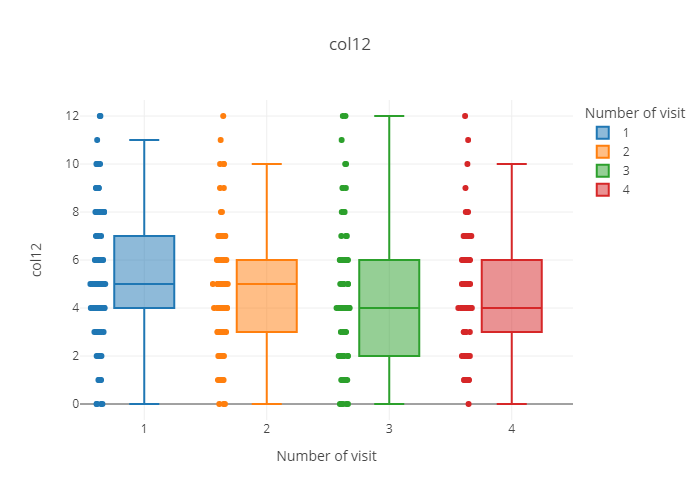

   number_of_visit  median       sem      mean
0                1     5.0  0.290958  5.233333
1                2     5.0  0.298010  4.714286
2                3     4.0  0.363129  4.441176
3                4     4.0  0.304408  4.621212


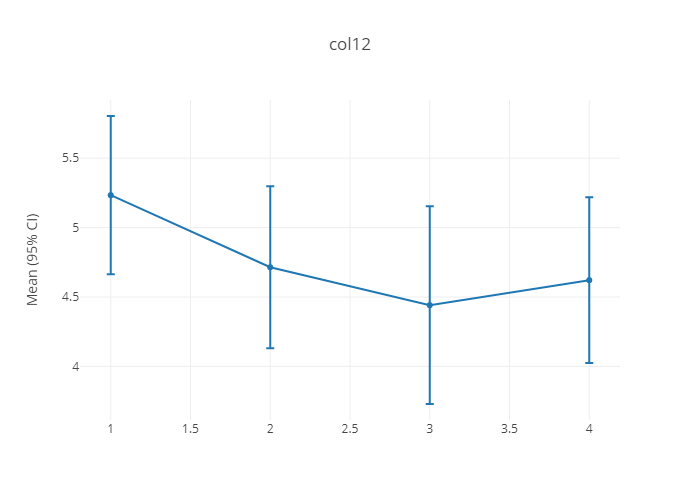

//////////////////////////////////////////////////////////////////////////////////////
col13
                describe                                               \
                   count      mean       std  min  25%  50%  75%  max   
number_of_visit                                                         
1                   92.0  3.065217  1.174868  0.0  2.0  3.5  4.0  4.0   
2                   75.0  2.866667  1.166345  0.0  2.0  3.0  4.0  4.0   
3                   69.0  2.492754  1.378652  0.0  1.0  3.0  4.0  4.0   
4                   68.0  2.720588  1.207509  0.0  2.0  3.0  4.0  4.0   

                      sem      skew  
                    col13     col13  
number_of_visit                      
1                0.122488 -1.167877  
2                0.134678 -0.993652  
3                0.165970 -0.608685  
4                0.146432 -0.957509  
kurt
                 number_of_visit     col13
number_of_visit                           
1                            0.0  0.51

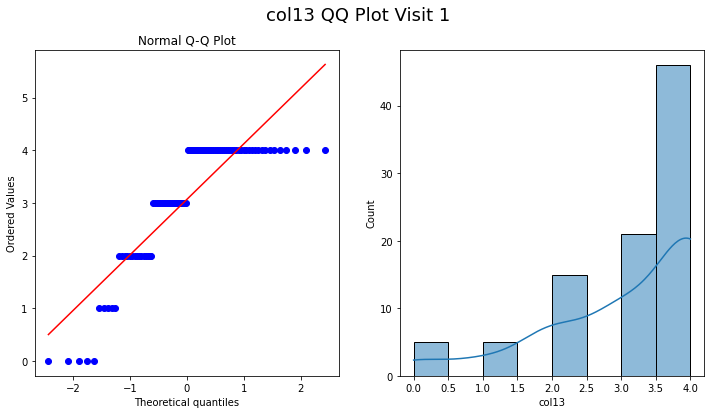

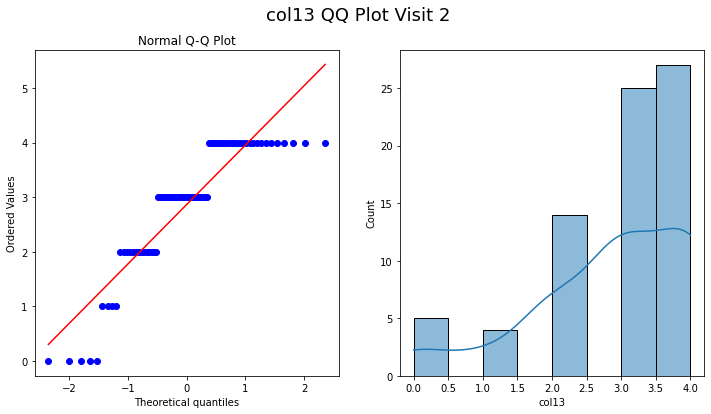

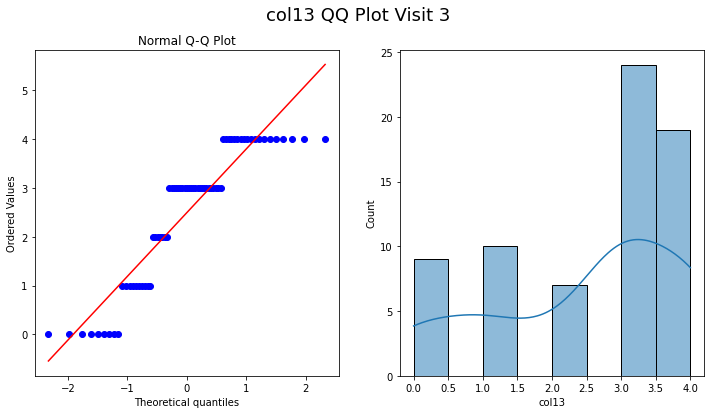

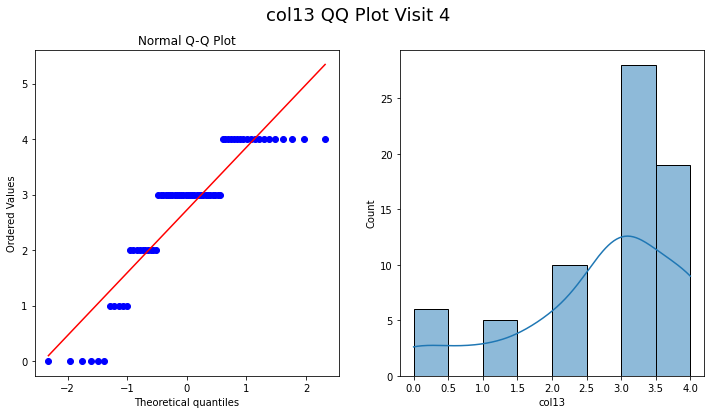

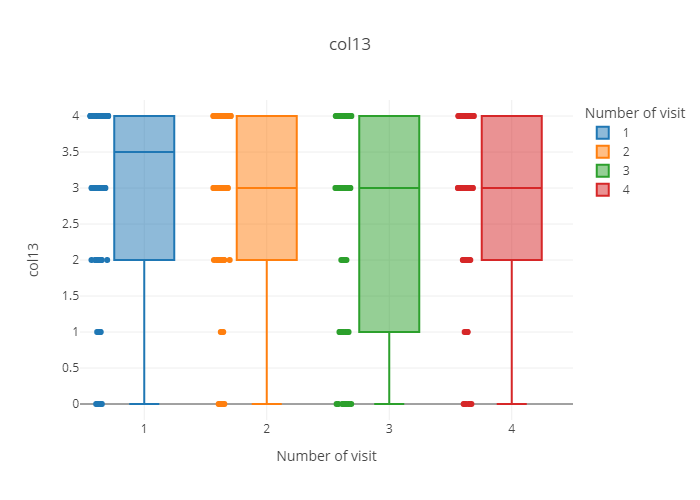

   number_of_visit  median       sem      mean
0                1     3.5  0.122488  3.065217
1                2     3.0  0.134678  2.866667
2                3     3.0  0.165970  2.492754
3                4     3.0  0.146432  2.720588


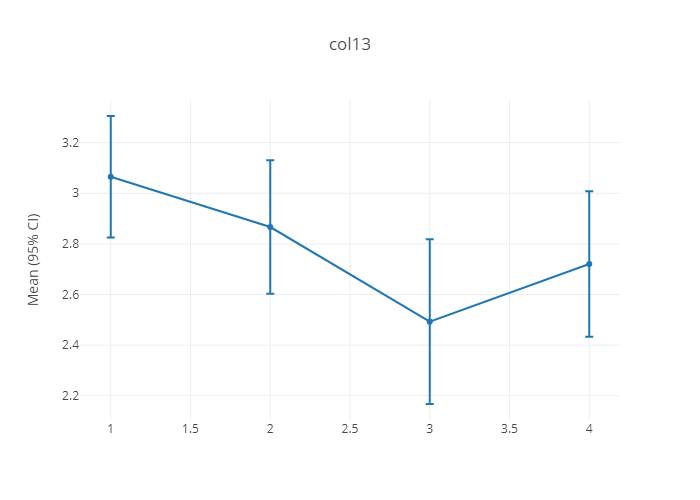

//////////////////////////////////////////////////////////////////////////////////////
col14
                describe                                                      \
                   count      mean       std   min     25%   50%   75%   max   
number_of_visit                                                                
1                   50.0  7.431000  0.055485  7.30  7.4000  7.43  7.48  7.53   
2                   62.0  7.414468  0.044745  7.30  7.3925  7.42  7.44  7.60   
3                   60.0  7.402667  0.058999  7.10  7.3975  7.40  7.43  7.54   
4                   60.0  7.404700  0.028638  7.32  7.3975  7.40  7.42  7.47   

                      sem      skew  
                    col14     col14  
number_of_visit                      
1                0.007847 -0.391731  
2                0.005683  0.562380  
3                0.007617 -2.237190  
4                0.003697 -0.136962  
kurt
                 number_of_visit      col14
number_of_visit                

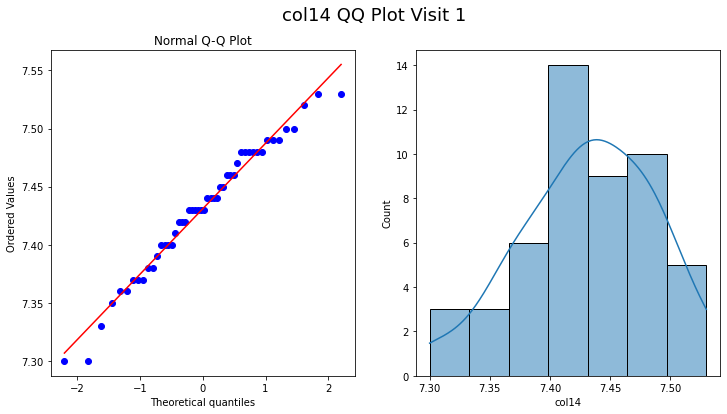

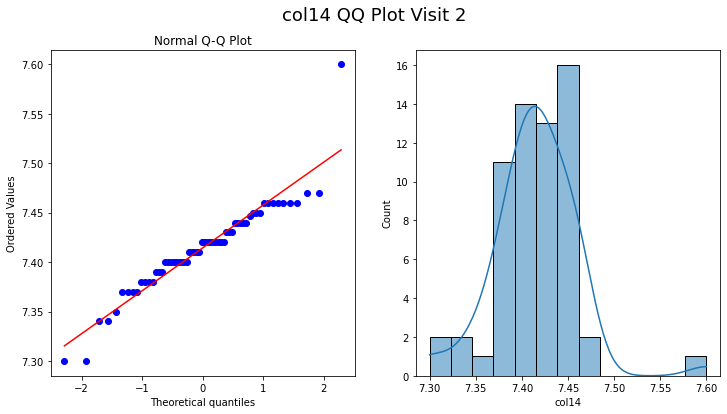

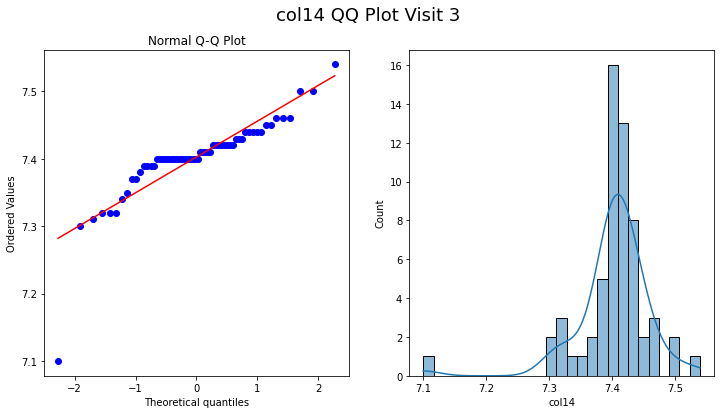

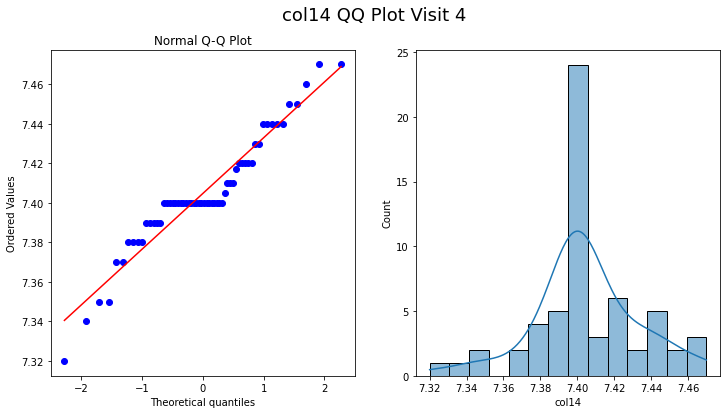

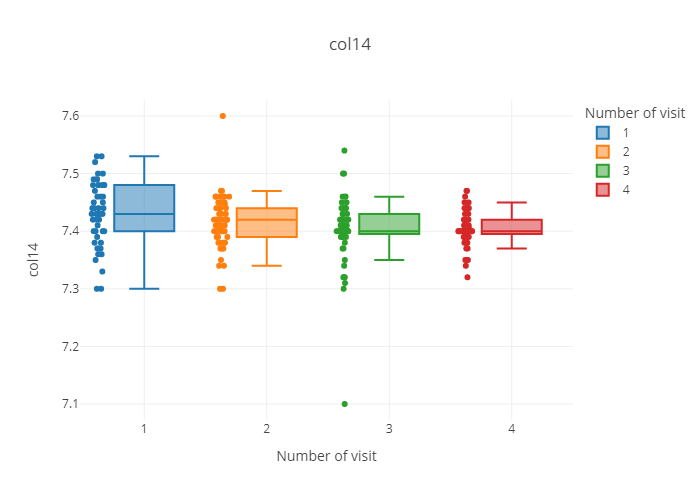

   number_of_visit  median       sem      mean
0                1    7.43  0.007847  7.431000
1                2    7.42  0.005683  7.414468
2                3    7.40  0.007617  7.402667
3                4    7.40  0.003697  7.404700


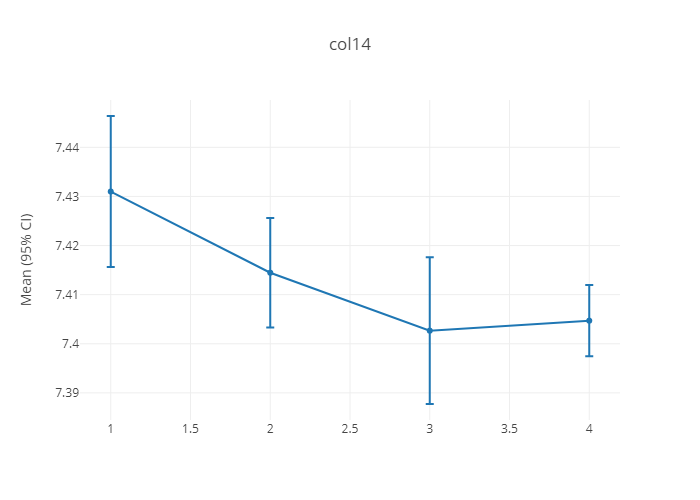

//////////////////////////////////////////////////////////////////////////////////////
col15
                describe                                                   \
                   count       mean        std   min     25%    50%   75%   
number_of_visit                                                             
1                   49.0  43.681633  10.267844  24.8  36.500  41.80  47.2   
2                   62.0  45.216129   7.452433  30.0  40.300  44.40  50.7   
3                   59.0  45.376271  10.244685  29.0  39.000  42.20  49.3   
4                   60.0  44.121667   7.563003  26.0  40.175  43.05  48.1   

                            sem      skew  
                  max     col15     col15  
number_of_visit                            
1                73.6  1.466835  0.814992  
2                63.8  0.946460  0.152210  
3                80.0  1.333744  1.299233  
4                65.0  0.976379  0.570791  
kurt
                 number_of_visit     col15
number_of_v

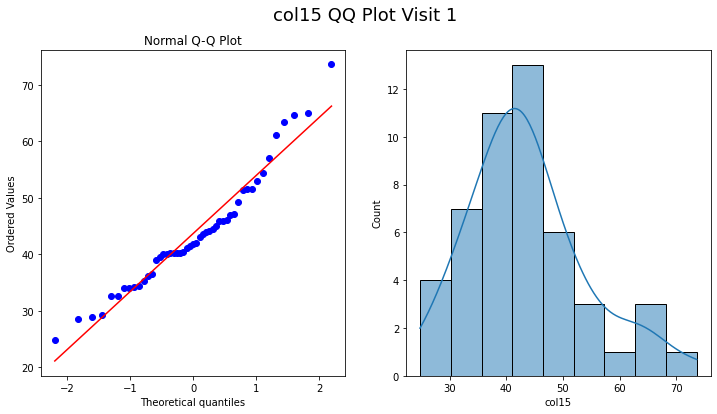

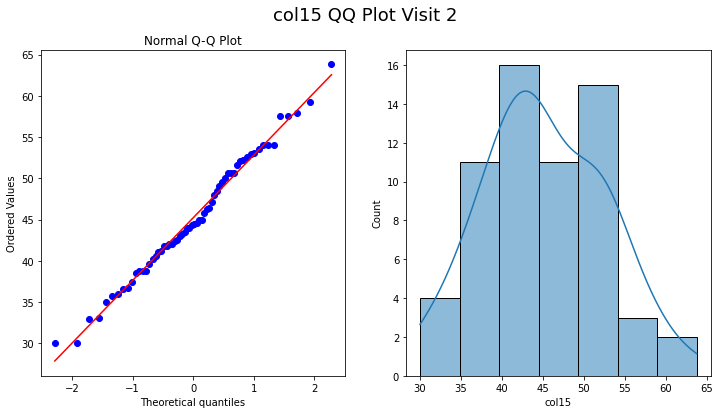

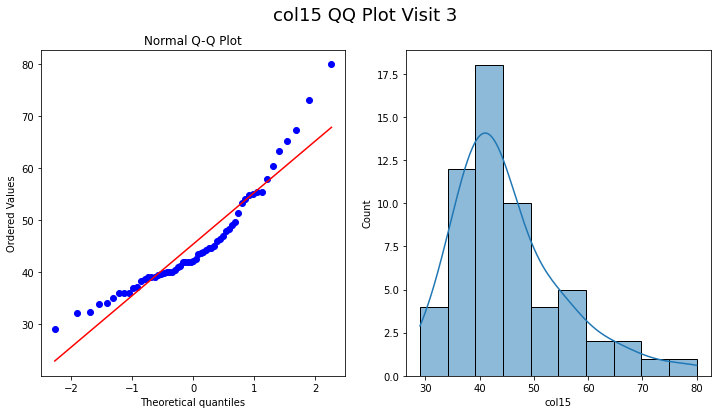

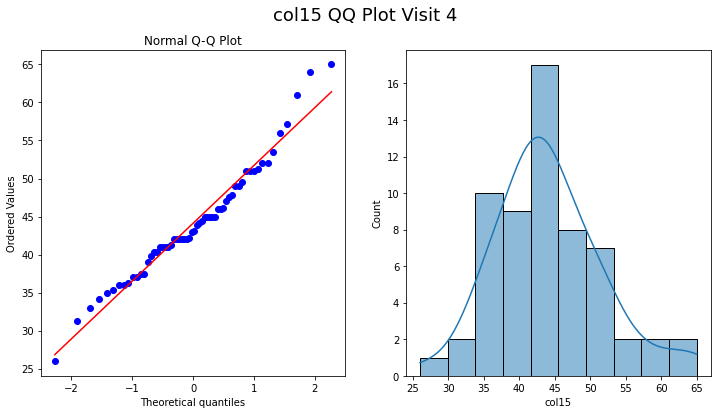

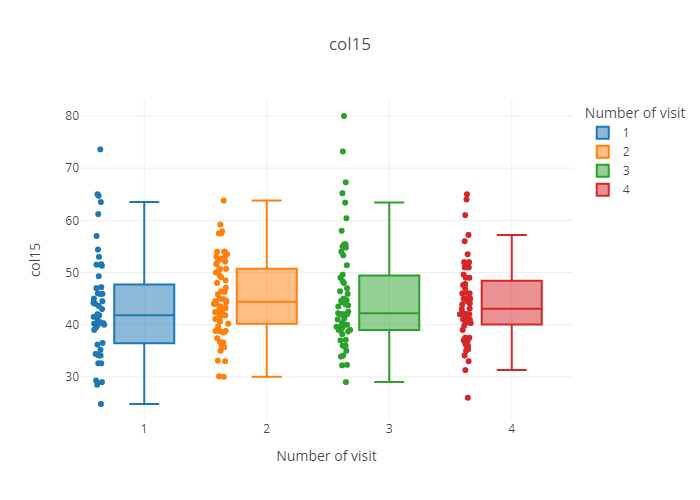

   number_of_visit  median       sem       mean
0                1   41.80  1.466835  43.681633
1                2   44.40  0.946460  45.216129
2                3   42.20  1.333744  45.376271
3                4   43.05  0.976379  44.121667


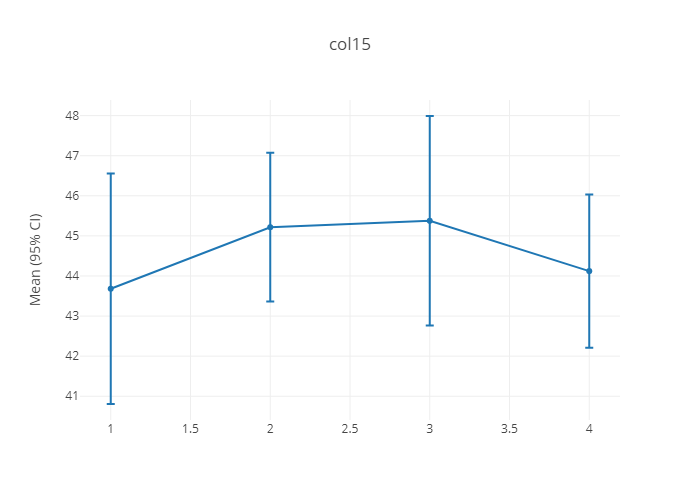

//////////////////////////////////////////////////////////////////////////////////////
col16
                describe                                                  \
                   count       mean        std   min    25%   50%    75%   
number_of_visit                                                            
1                   41.0  57.560976  20.728059  18.0  47.00  62.0  66.00   
2                   57.0  65.912281  19.547817  27.0  52.00  74.0  80.00   
3                   56.0  64.896429  20.371923  18.0  55.25  67.5  80.25   
4                   57.0  66.473684  18.448873  20.0  58.00  69.0  81.00   

                             sem      skew  
                   max     col16     col16  
number_of_visit                             
1                100.0  3.237179 -0.223968  
2                 96.0  2.589172 -0.608703  
3                 97.0  2.722313 -0.465582  
4                 94.0  2.443613 -0.783353  
kurt
                 number_of_visit     col16
number_of_v

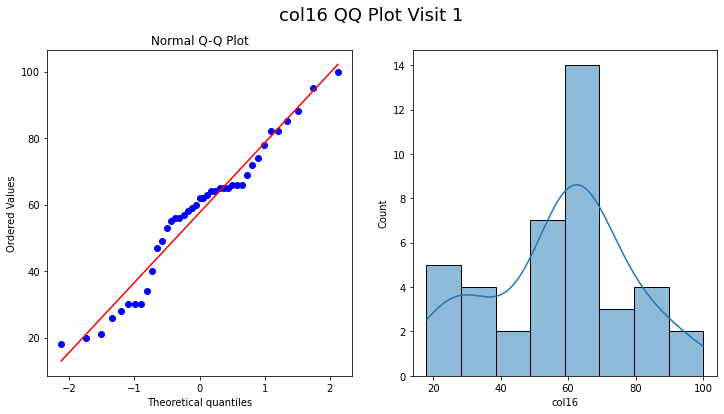

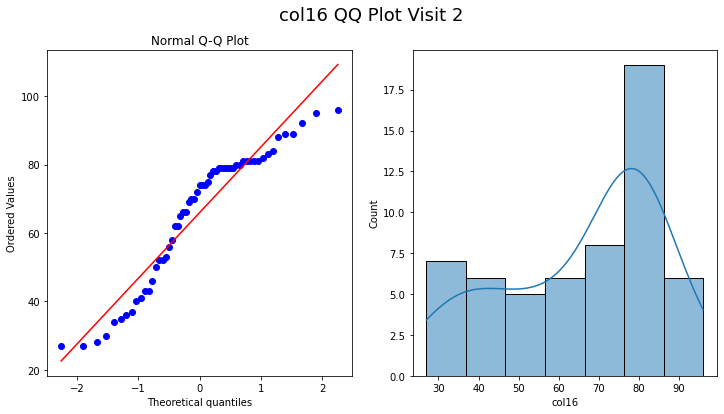

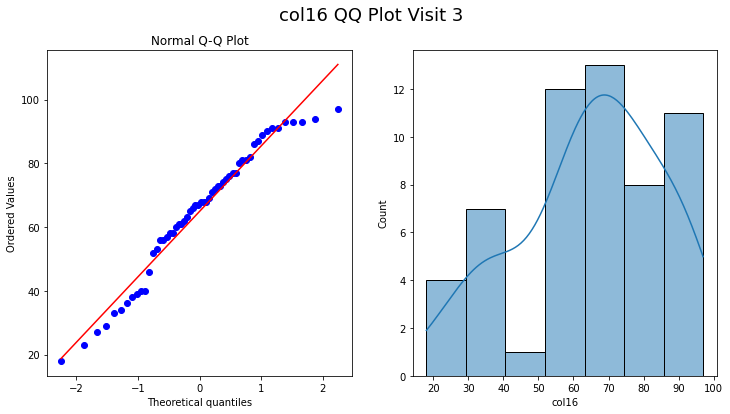

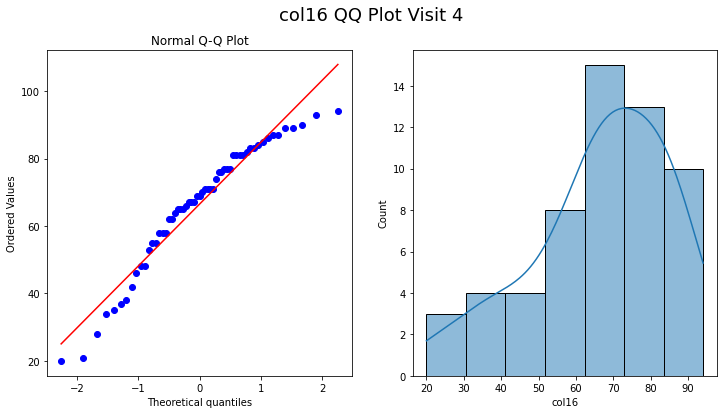

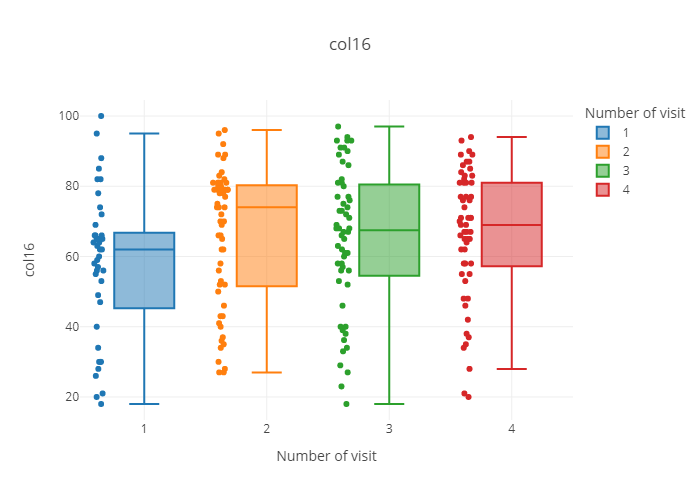

   number_of_visit  median       sem       mean
0                1    62.0  3.237179  57.560976
1                2    74.0  2.589172  65.912281
2                3    67.5  2.722313  64.896429
3                4    69.0  2.443613  66.473684


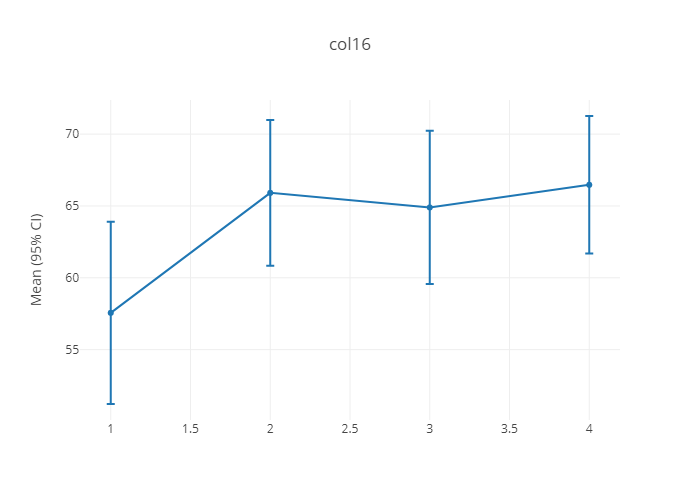

//////////////////////////////////////////////////////////////////////////////////////
col17
                describe                                                \
                   count      mean       std  min  25%  50%  75%   max   
number_of_visit                                                          
1                   49.0  3.795918  4.425210 -6.0  2.0  3.0  6.0  24.0   
2                   59.0  4.322034  3.334463 -2.0  2.0  4.0  6.5  16.0   
3                   58.0  3.206897  2.660686 -2.0  2.0  2.5  5.0  12.0   
4                   58.0  2.724138  2.483582 -3.0  1.0  2.0  4.0  11.0   

                      sem      skew  
                    col17     col17  
number_of_visit                      
1                0.632173  1.585542  
2                0.434110  0.557421  
3                0.349365  0.846053  
4                0.326110  0.690543  
kurt
                 number_of_visit     col17
number_of_visit                           
1                            0.

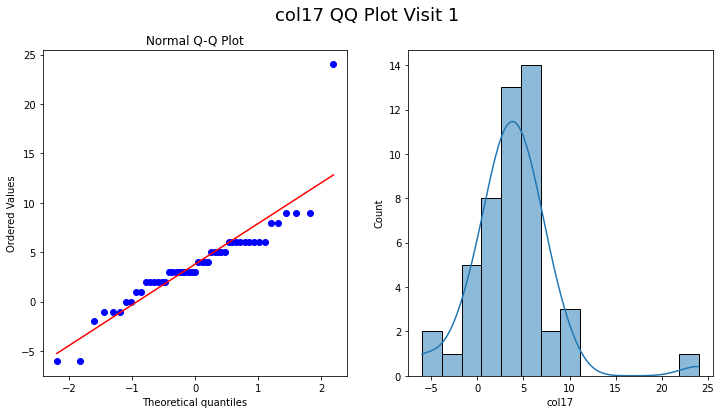

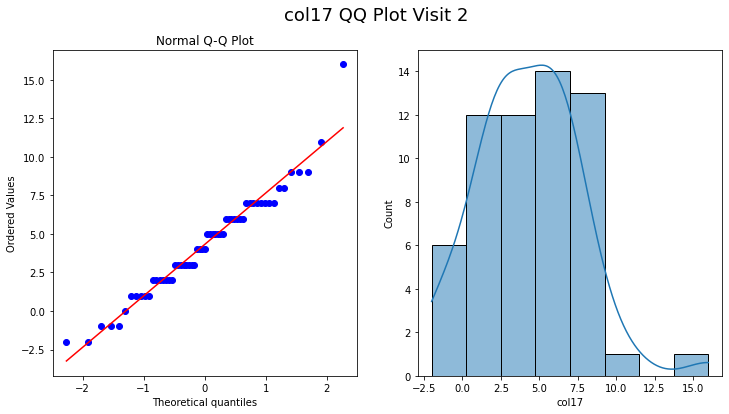

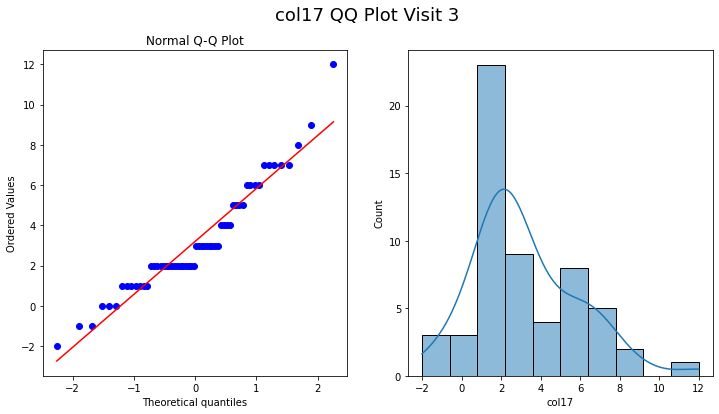

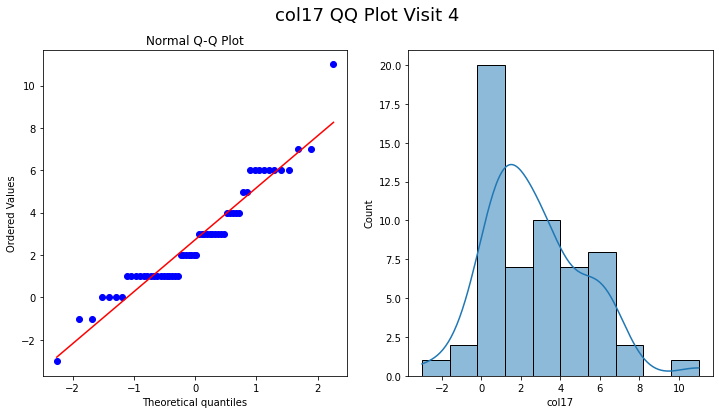

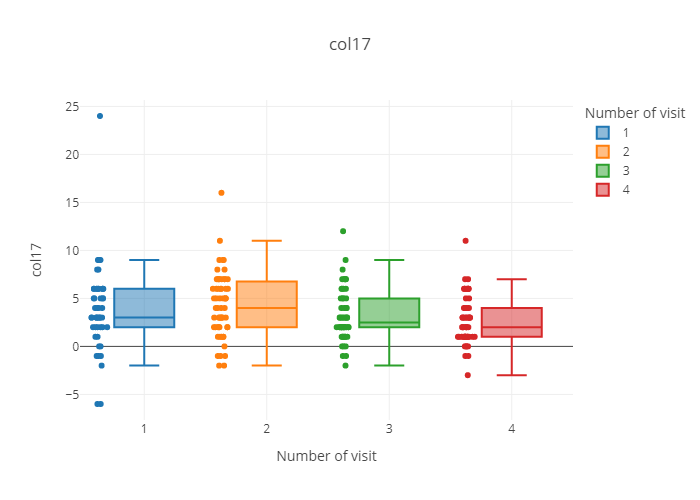

   number_of_visit  median       sem      mean
0                1     3.0  0.632173  3.795918
1                2     4.0  0.434110  4.322034
2                3     2.5  0.349365  3.206897
3                4     2.0  0.326110  2.724138


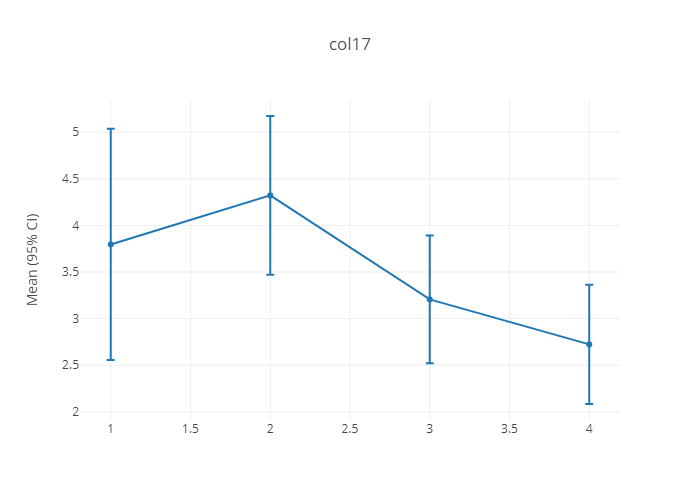

//////////////////////////////////////////////////////////////////////////////////////
col18
                describe                                                       \
                   count       mean       std   min     25%   50%   75%   max   
number_of_visit                                                                 
1                   49.0  29.140816  5.871645  16.3  26.100  28.6  30.7  50.3   
2                   62.0  29.343548  4.013650  22.0  26.275  29.4  32.0  42.2   
3                   59.0  28.106780  3.763796  22.0  25.800  27.5  30.0  40.8   
4                   59.0  27.549153  3.690920  19.0  25.450  27.4  30.0  39.7   

                      sem      skew  
                    col18     col18  
number_of_visit                      
1                0.838806  1.169935  
2                0.509734  0.369747  
3                0.490004  0.938885  
4                0.480517  0.555032  
kurt
                 number_of_visit     col18
number_of_visit          

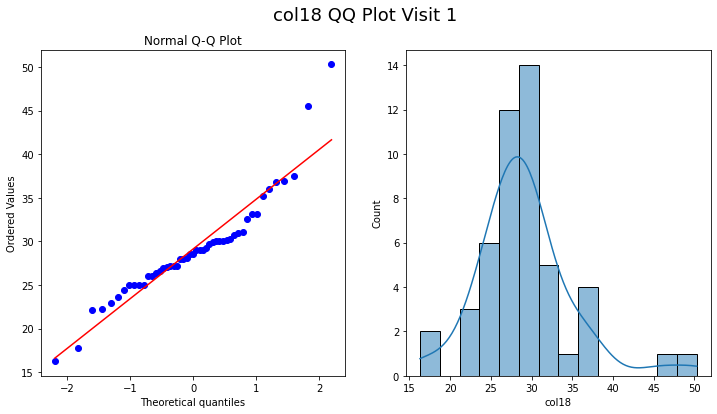

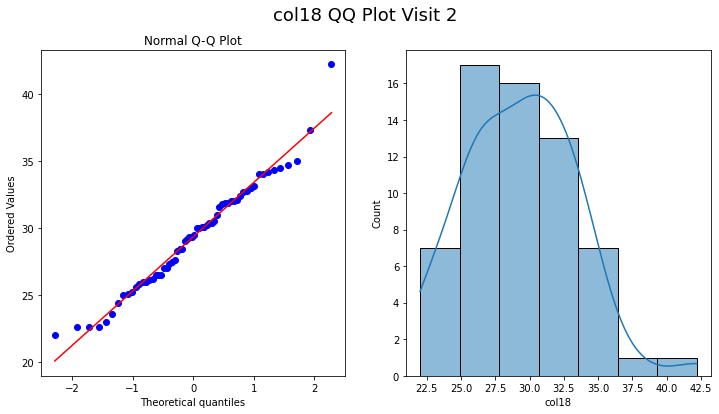

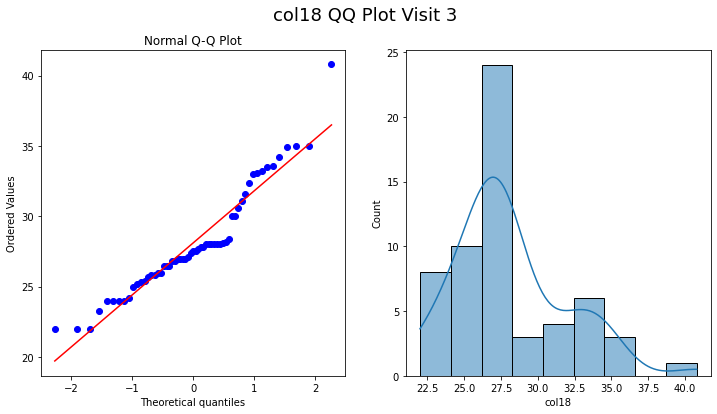

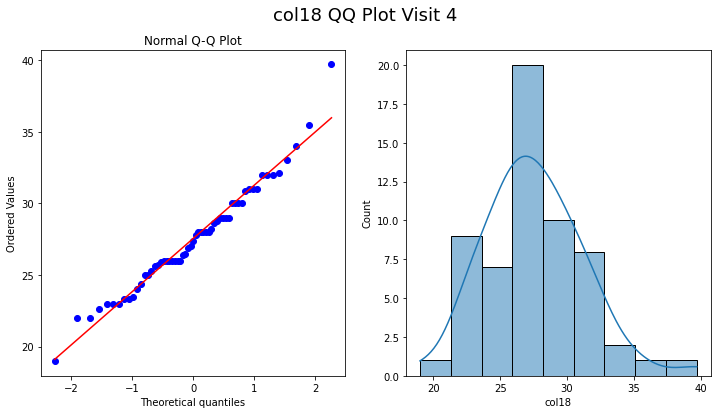

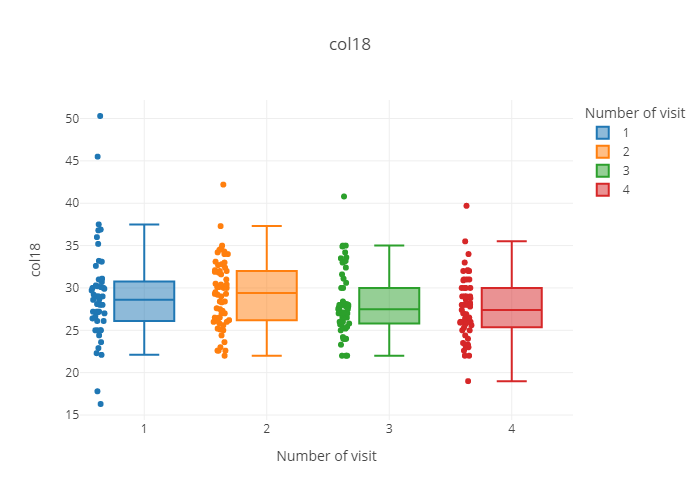

   number_of_visit  median       sem       mean
0                1    28.6  0.838806  29.140816
1                2    29.4  0.509734  29.343548
2                3    27.5  0.490004  28.106780
3                4    27.4  0.480517  27.549153


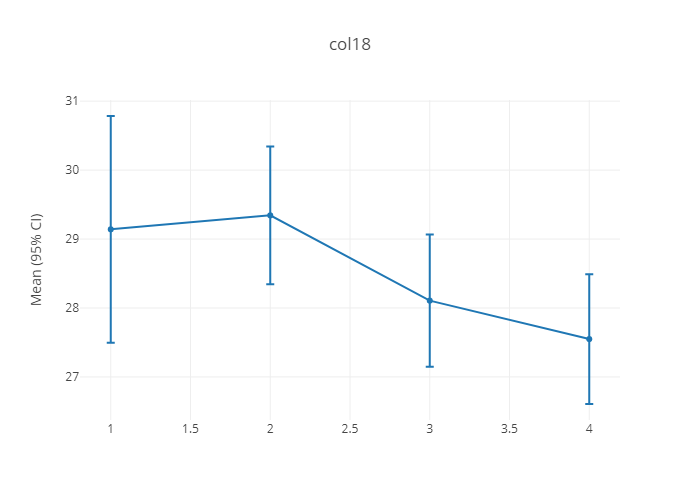

//////////////////////////////////////////////////////////////////////////////////////
col19
                describe                                                      \
                   count       mean       std   min   25%   50%    75%   max   
number_of_visit                                                                
1                   47.0  30.510638  5.985026  17.0  27.5  30.0  32.00  50.0   
2                   62.0  30.774194  4.154474  23.0  28.0  31.0  33.75  44.0   
3                   59.0  29.376271  3.619123  23.0  27.0  29.0  31.50  37.0   
4                   59.0  29.033898  4.012765  20.0  26.5  29.0  31.00  42.0   

                      sem      skew  
                    col19     col19  
number_of_visit                      
1                0.873006  0.914574  
2                0.527619  0.365218  
3                0.471170  0.410707  
4                0.522417  0.599076  
kurt
                 number_of_visit     col19
number_of_visit                 

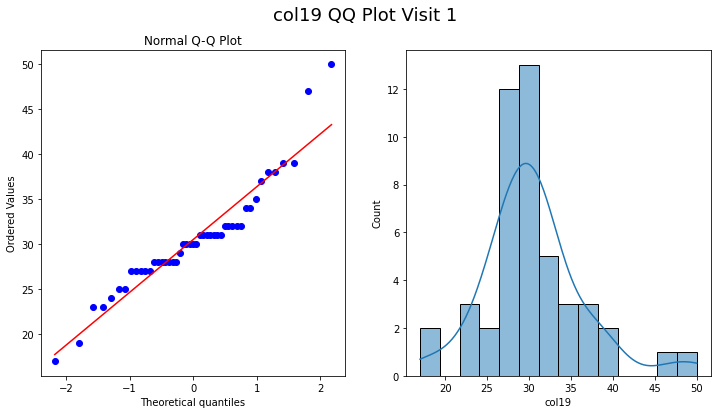

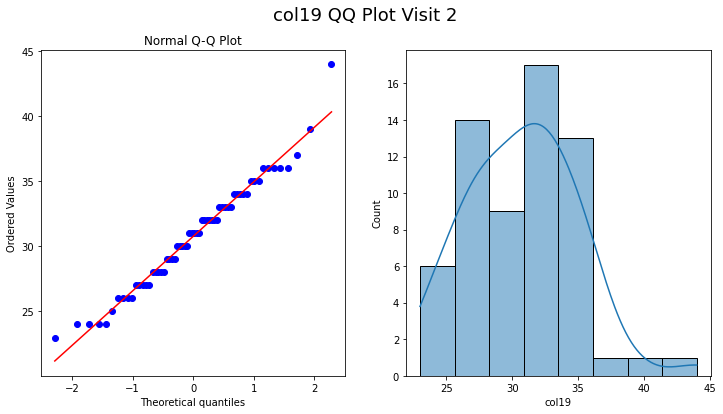

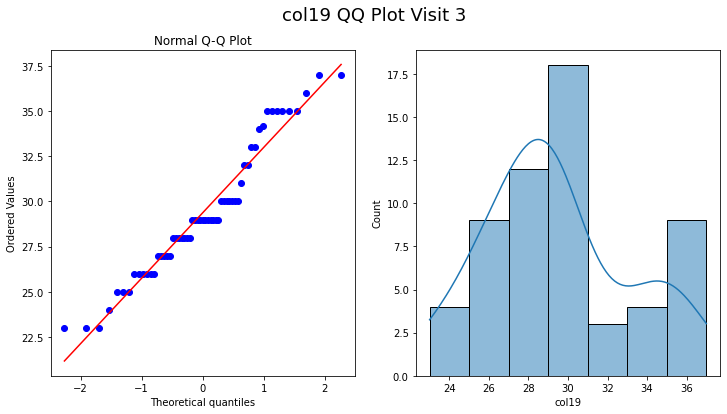

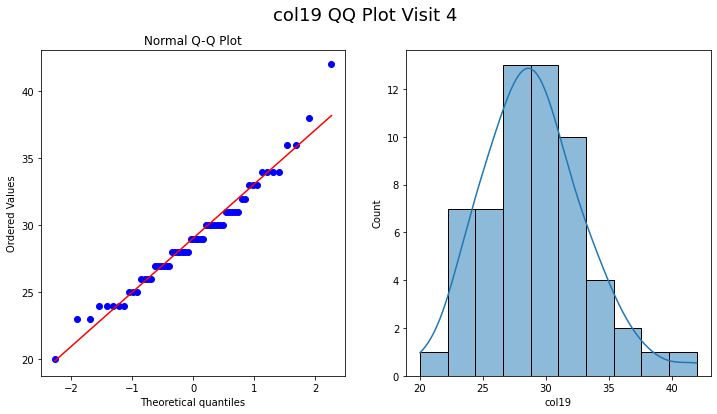

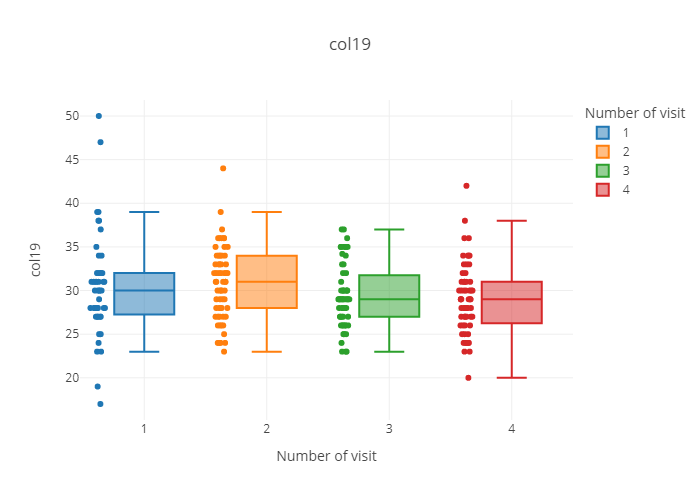

   number_of_visit  median       sem       mean
0                1    30.0  0.873006  30.510638
1                2    31.0  0.527619  30.774194
2                3    29.0  0.471170  29.376271
3                4    29.0  0.522417  29.033898


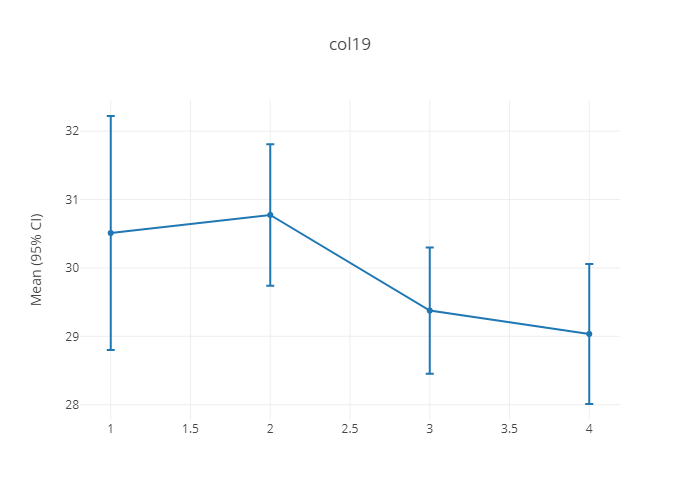

//////////////////////////////////////////////////////////////////////////////////////
col20
                describe                                                      \
                   count       mean       std   min   25%   50%   75%    max   
number_of_visit                                                                
1                   47.0  93.404255  4.599903  82.0  91.0  93.0  98.0   99.0   
2                   49.0  94.653061  3.332610  86.0  94.0  95.0  97.0   99.0   
3                   49.0  93.755102  3.591254  85.0  91.0  94.0  97.0  100.0   
4                   50.0  93.840000  3.513008  84.0  92.0  94.5  96.0   99.0   

                      sem      skew  
                    col20     col20  
number_of_visit                      
1                0.670965 -0.713963  
2                0.476087 -1.394333  
3                0.513036 -0.633286  
4                0.496814 -1.044189  
kurt
                 number_of_visit     col20
number_of_visit                 

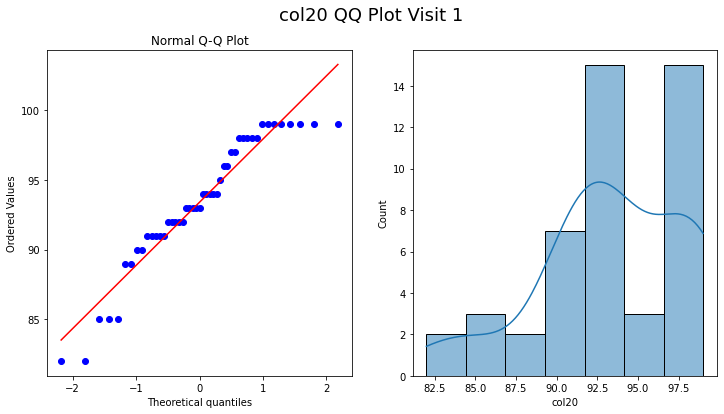

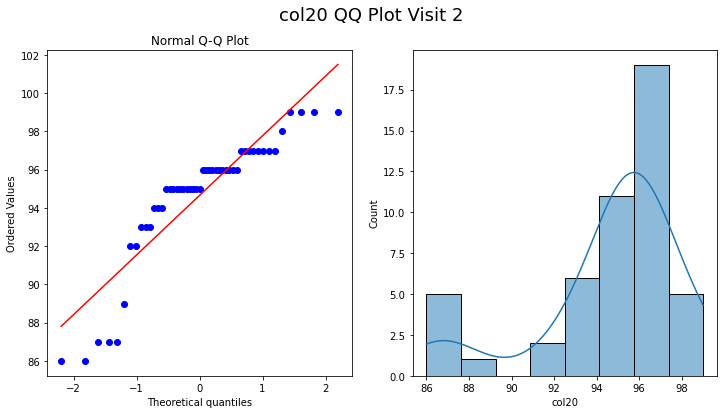

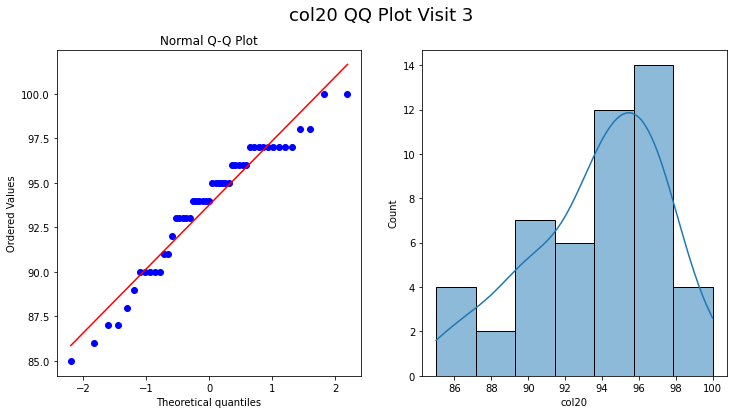

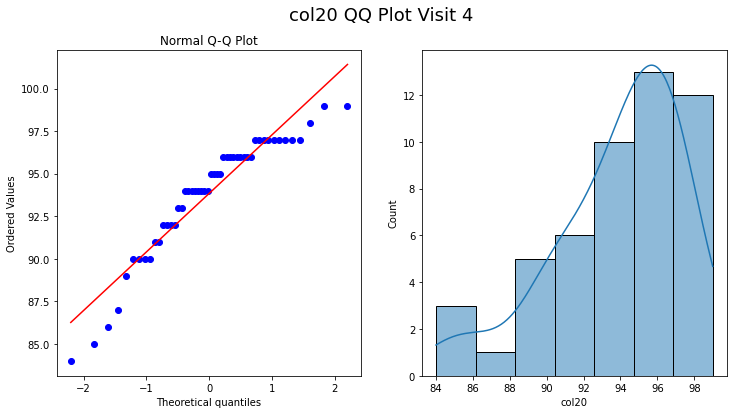

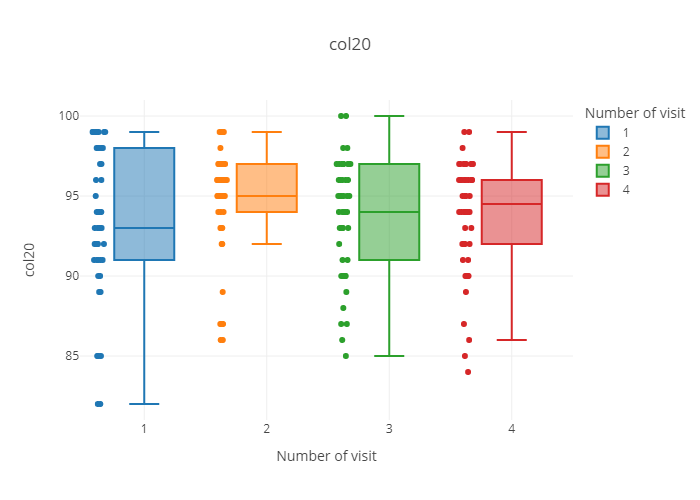

   number_of_visit  median       sem       mean
0                1    93.0  0.670965  93.404255
1                2    95.0  0.476087  94.653061
2                3    94.0  0.513036  93.755102
3                4    94.5  0.496814  93.840000


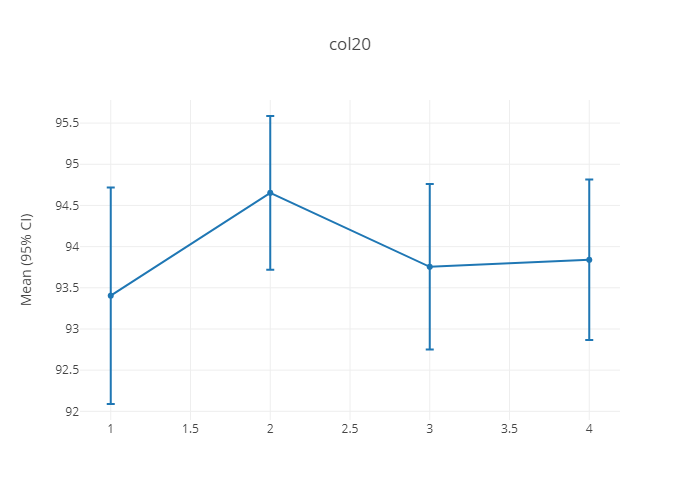

//////////////////////////////////////////////////////////////////////////////////////
col21
                describe                                                    \
                   count        mean       std    min    25%    50%    75%   
number_of_visit                                                              
1                   50.0  139.060000  2.645057  133.0  138.0  140.0  141.0   
2                   62.0  140.209677  2.382567  133.0  139.0  141.0  142.0   
3                   60.0  139.883333  2.725222  133.0  138.0  140.0  142.0   
4                   59.0  139.457627  3.036116  133.0  138.0  140.0  141.5   

                             sem      skew  
                   max     col21     col21  
number_of_visit                             
1                143.0  0.374068 -0.839417  
2                144.0  0.302586 -0.978684  
3                145.0  0.351825 -0.398097  
4                145.0  0.395269 -0.377918  
kurt
                 number_of_visit     col

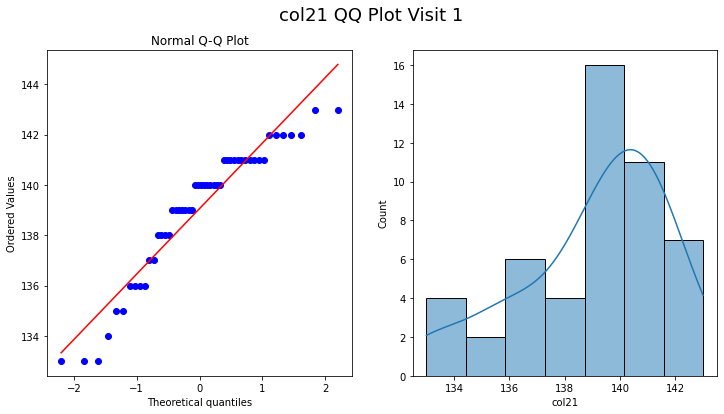

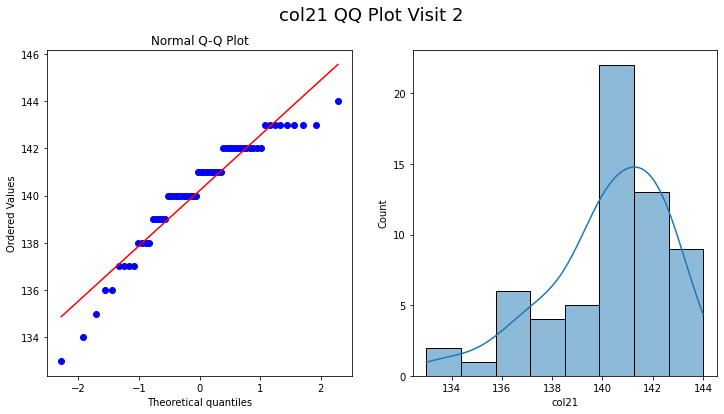

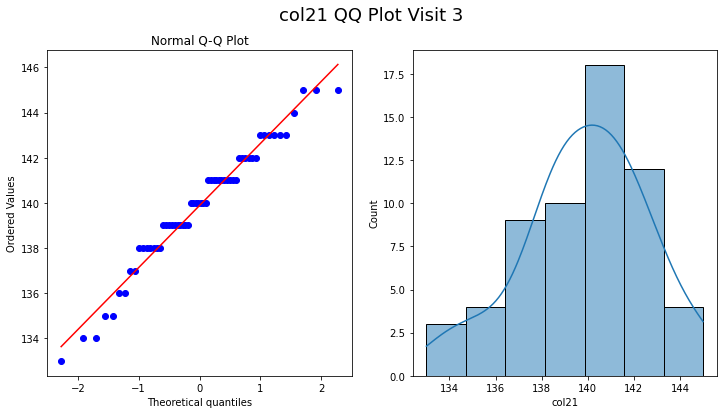

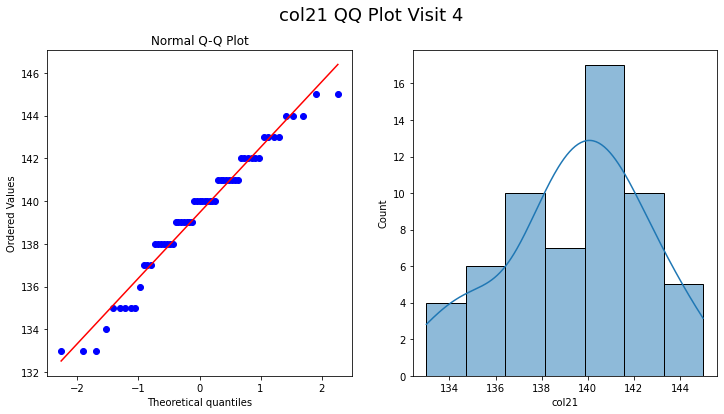

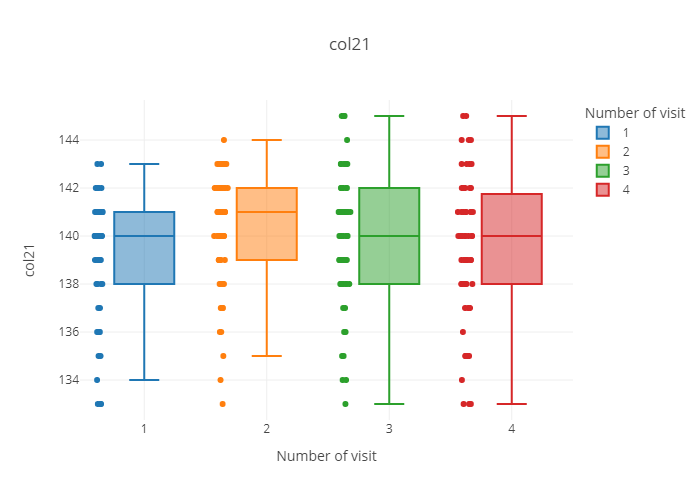

   number_of_visit  median       sem        mean
0                1   140.0  0.374068  139.060000
1                2   141.0  0.302586  140.209677
2                3   140.0  0.351825  139.883333
3                4   140.0  0.395269  139.457627


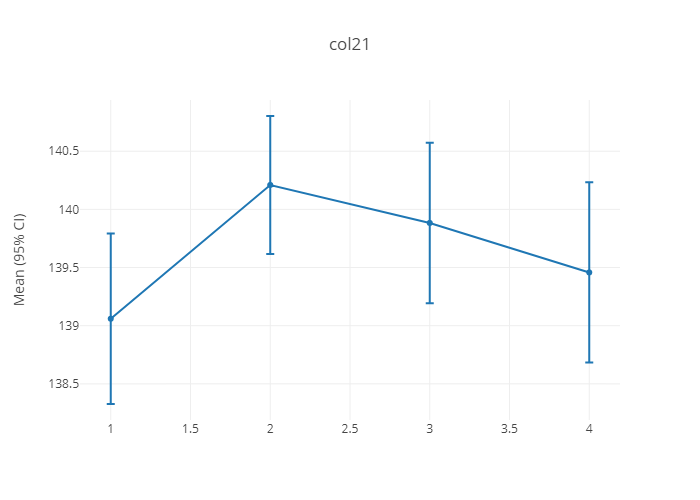

//////////////////////////////////////////////////////////////////////////////////////
col22
                describe                                                   \
                   count      mean       std  min    25%   50%   75%  max   
number_of_visit                                                             
1                   50.0  4.312000  0.959515  2.7  3.900  4.15  4.45  8.2   
2                   62.0  4.129032  0.664902  3.3  3.800  4.00  4.20  7.7   
3                   60.0  4.096667  0.453598  3.1  3.875  4.10  4.30  5.5   
4                   59.0  4.054237  0.371076  3.2  3.900  4.00  4.20  5.3   

                      sem      skew  
                    col22     col22  
number_of_visit                      
1                0.135696  2.804186  
2                0.084443  3.107549  
3                0.058559  0.764141  
4                0.048310  1.454744  
kurt
                 number_of_visit      col22
number_of_visit                            
1       

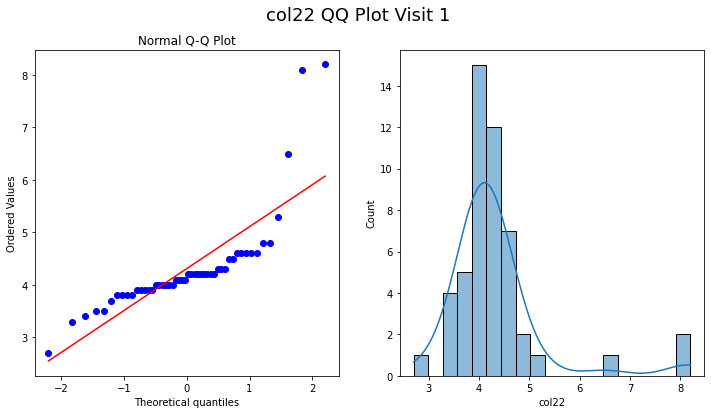

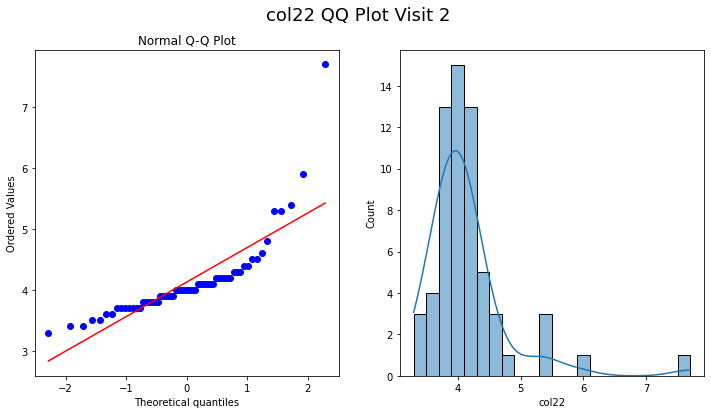

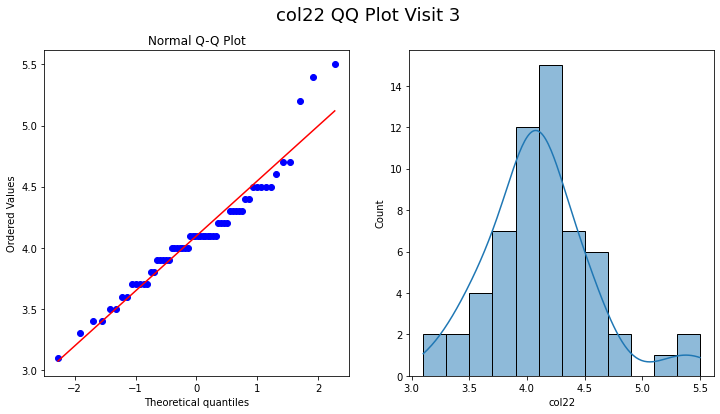

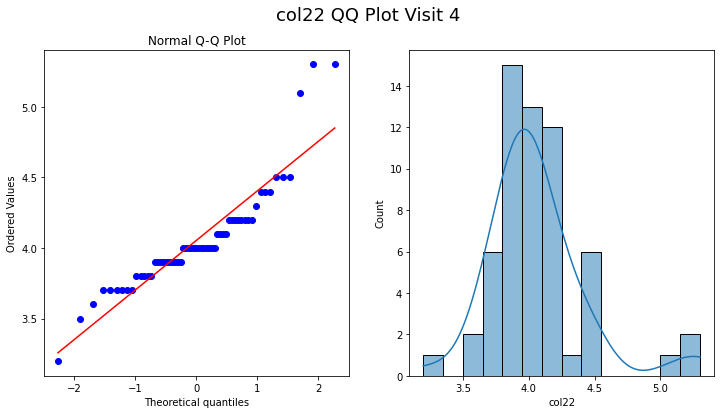

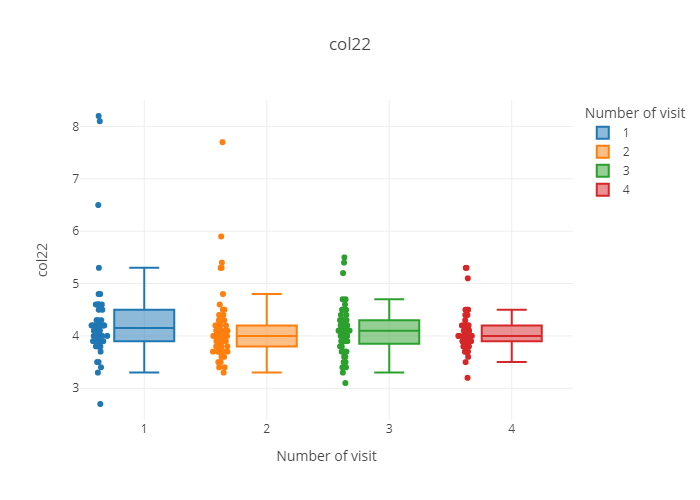

   number_of_visit  median       sem      mean
0                1    4.15  0.135696  4.312000
1                2    4.00  0.084443  4.129032
2                3    4.10  0.058559  4.096667
3                4    4.00  0.048310  4.054237


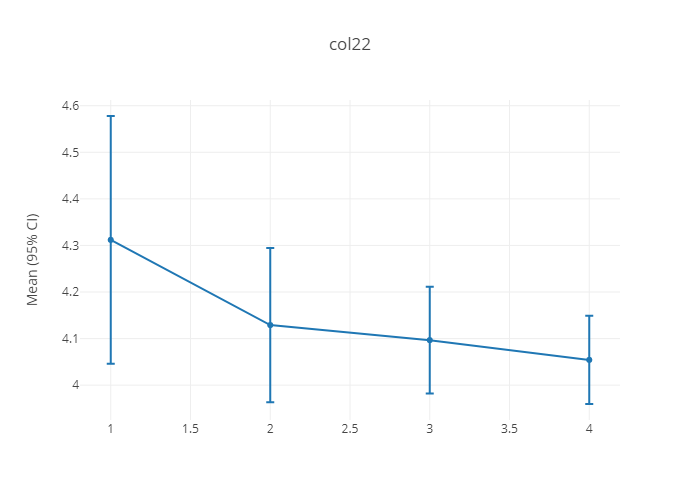

//////////////////////////////////////////////////////////////////////////////////////
col23
                describe                                                      \
                   count       mean       std   min    25%   50%   75%   max   
number_of_visit                                                                
1                   50.0  40.140000  7.748627  23.0  36.25  40.5  44.0  57.0   
2                   61.0  42.163934  5.879854  29.0  39.00  42.0  46.0  56.0   
3                   60.0  41.503333  6.576923  26.0  38.00  41.0  45.0  61.0   
4                   59.0  41.101695  4.773110  29.0  38.00  41.0  44.0  58.0   

                      sem      skew  
                    col23     col23  
number_of_visit                      
1                1.095821 -0.025168  
2                0.752838  0.091850  
3                0.849077  0.352598  
4                0.621406  0.854507  
kurt
                 number_of_visit     col23
number_of_visit                 

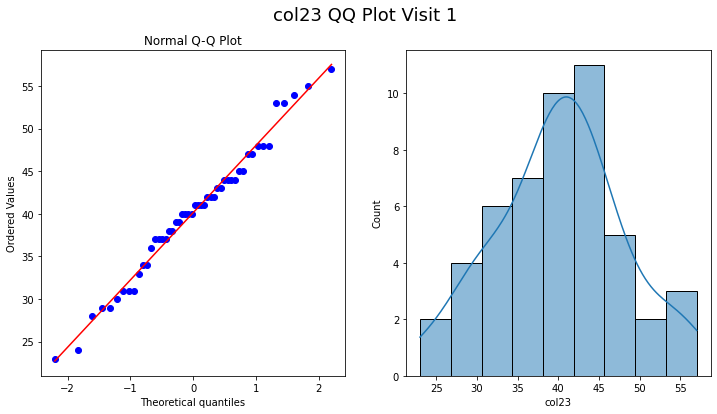

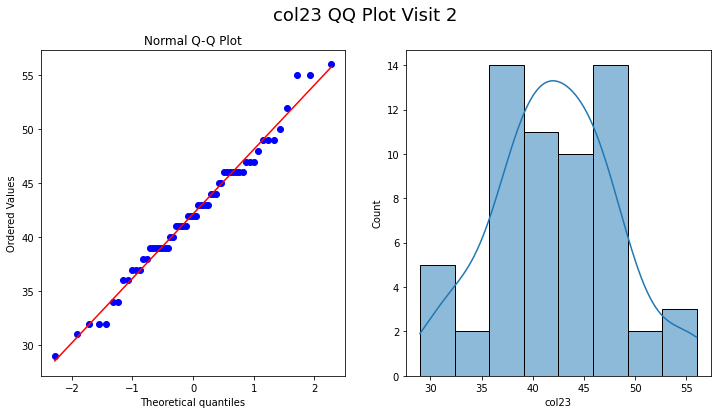

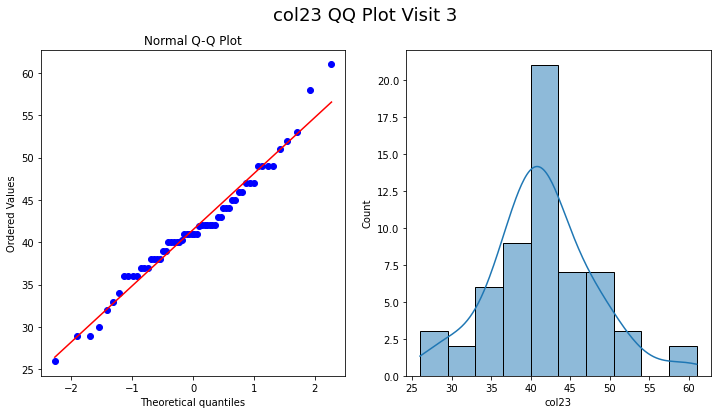

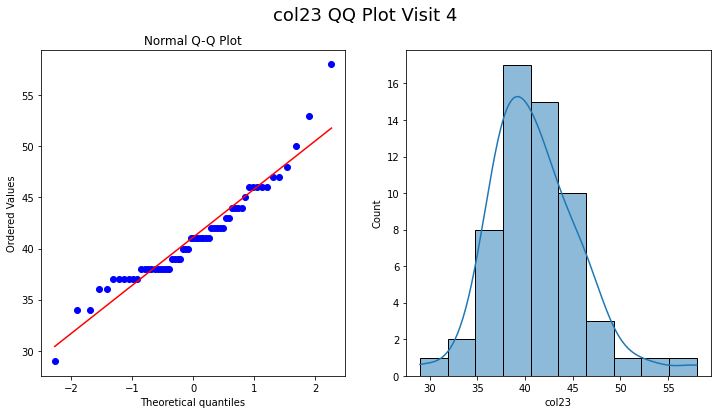

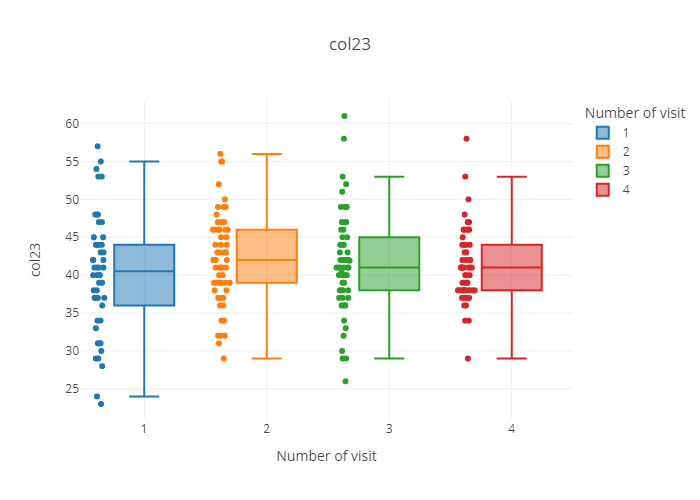

   number_of_visit  median       sem       mean
0                1    40.5  1.095821  40.140000
1                2    42.0  0.752838  42.163934
2                3    41.0  0.849077  41.503333
3                4    41.0  0.621406  41.101695


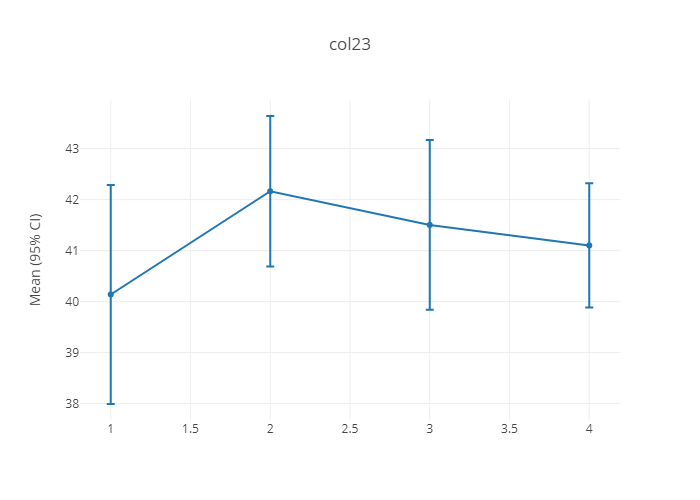

//////////////////////////////////////////////////////////////////////////////////////
col24
                describe                                                    \
                   count        mean        std   min    25%    50%    75%   
number_of_visit                                                              
1                   49.0  135.877551  26.012523  78.0  122.0  136.0  150.0   
2                   61.0  143.377049  19.938375  99.0  133.0  143.0  156.0   
3                   60.0  140.766667  20.766961  99.0  129.0  139.0  150.0   
4                   59.0  139.423729  16.193020  99.0  129.0  139.0  149.5   

                             sem      skew  
                   max     col24     col24  
number_of_visit                             
1                194.0  3.716075 -0.078648  
2                190.0  2.552847  0.097523  
3                207.0  2.681003  0.549840  
4                197.0  2.108152  0.884289  
kurt
                 number_of_visit     col

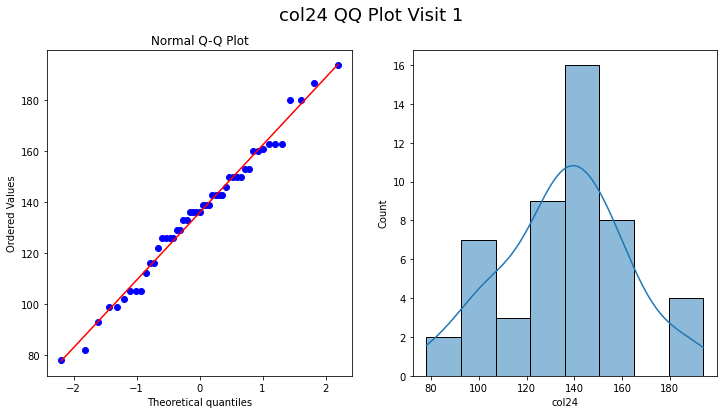

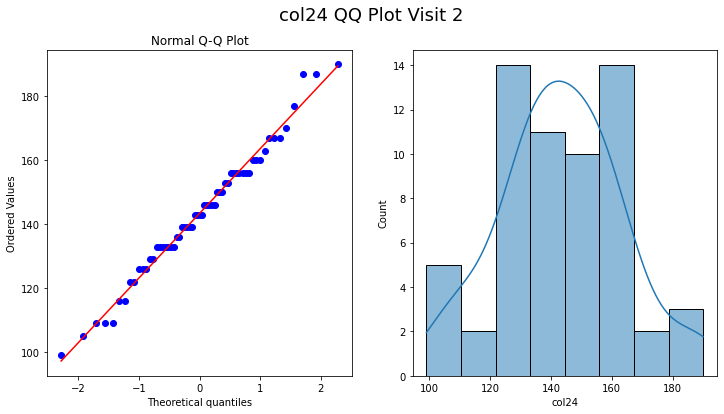

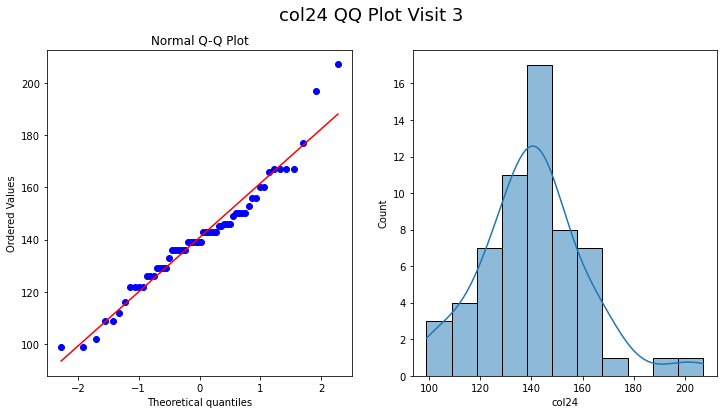

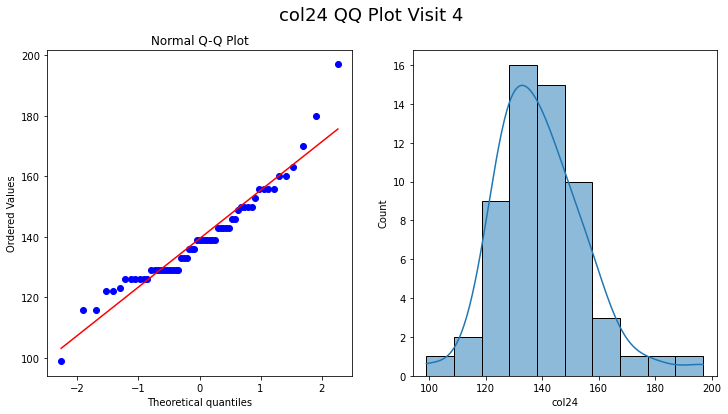

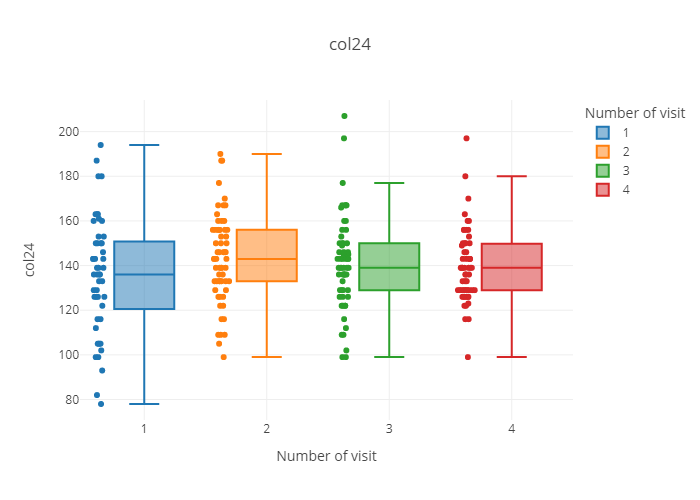

   number_of_visit  median       sem        mean
0                1   136.0  3.716075  135.877551
1                2   143.0  2.552847  143.377049
2                3   139.0  2.681003  140.766667
3                4   139.0  2.108152  139.423729


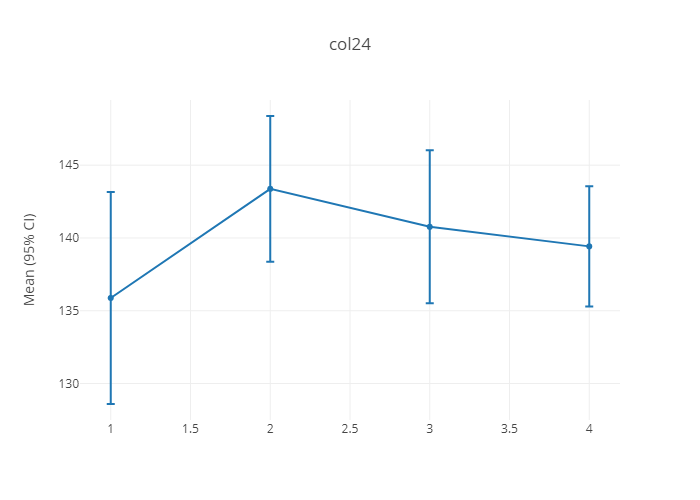

//////////////////////////////////////////////////////////////////////////////////////
col25
                describe                                              \
                   count       mean        std        min        25%   
number_of_visit                                                        
1                   46.0  56.662729  23.496860  21.804511  39.728313   
2                   64.0  58.144164  21.019919  21.086957  40.865306   
3                   57.0  57.096303  21.651999  24.347826  40.453686   
4                   48.0  59.744944  23.208728  19.675926  40.228227   

                                                        sem      skew  
                       50%        75%         max     col25     col25  
number_of_visit                                                        
1                52.032542  71.110684  109.854015  3.464423  0.542904  
2                56.588520  73.976603  105.764411  2.627490  0.321588  
3                52.631579  72.030651  108

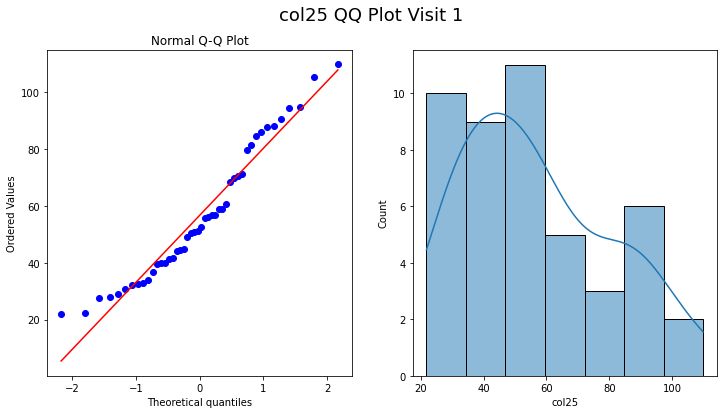

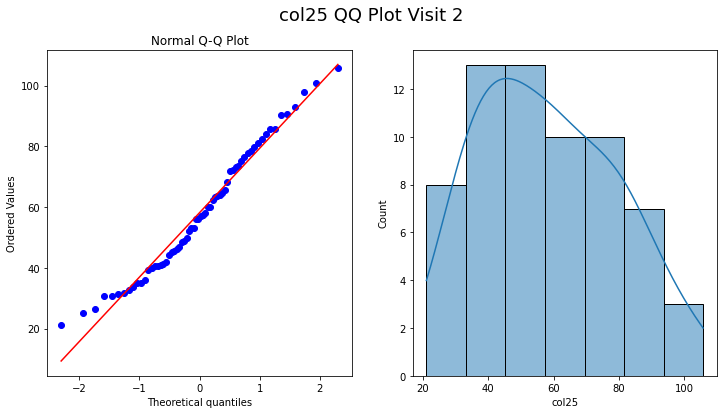

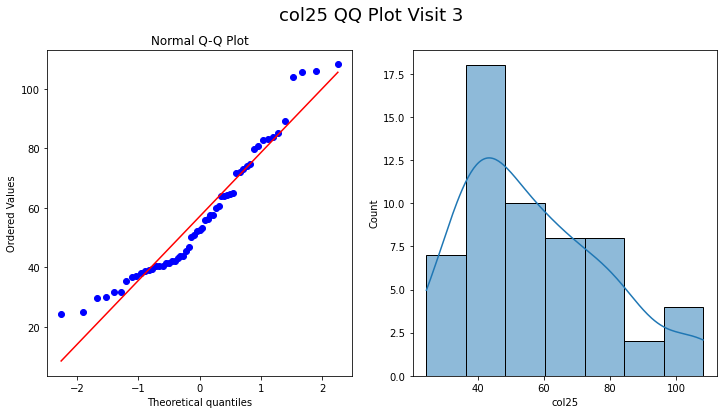

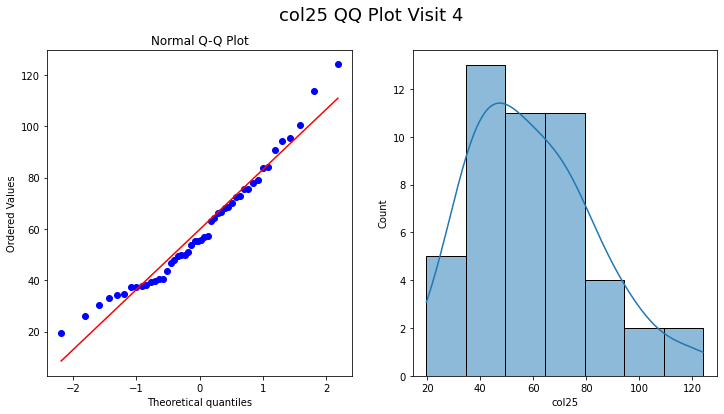

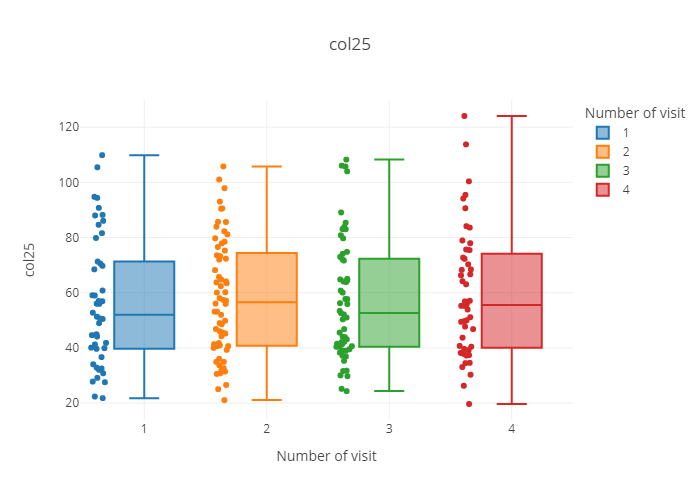

   number_of_visit     median       sem       mean
0                1  52.032542  3.464423  56.662729
1                2  56.588520  2.627490  58.144164
2                3  52.631579  2.867877  57.096303
3                4  55.528226  3.349891  59.744944


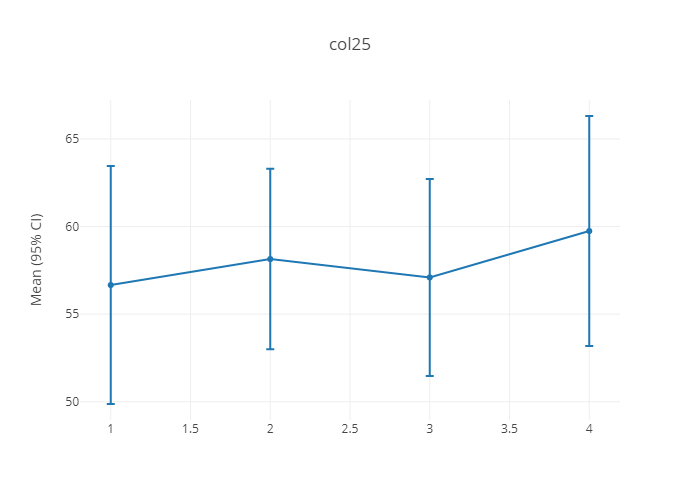

//////////////////////////////////////////////////////////////////////////////////////
col26
                describe                                              \
                   count       mean        std        min        25%   
number_of_visit                                                        
1                   46.0  51.032519  27.763694  11.720698  29.329145   
2                   64.0  51.803512  24.849785  13.753582  35.248472   
3                   57.0  52.333012  25.745664  12.874251  32.211538   
4                   48.0  55.439571  25.268932  12.628866  33.816429   

                                                        sem      skew  
                       50%        75%         max     col26     col26  
number_of_visit                                                        
1                44.396960  68.677847  111.980440  4.093533  0.623747  
2                45.802612  66.525751  114.425428  3.106223  0.516199  
3                46.448087  65.013055  111

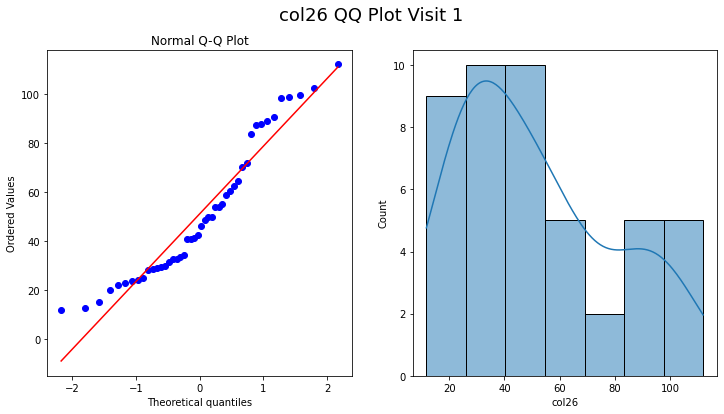

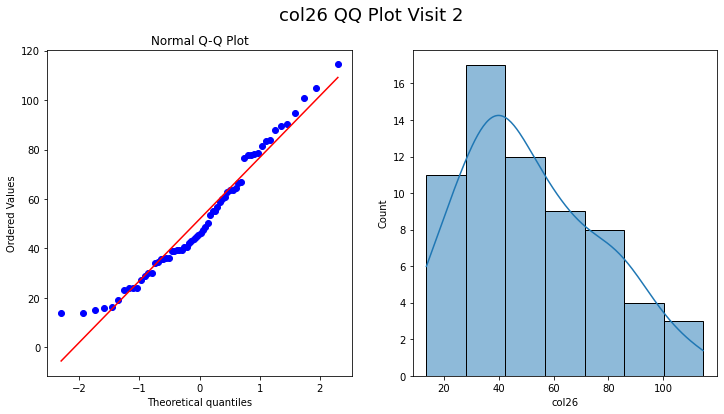

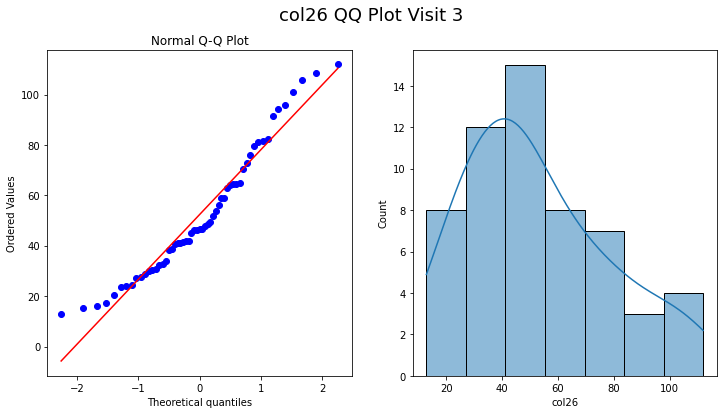

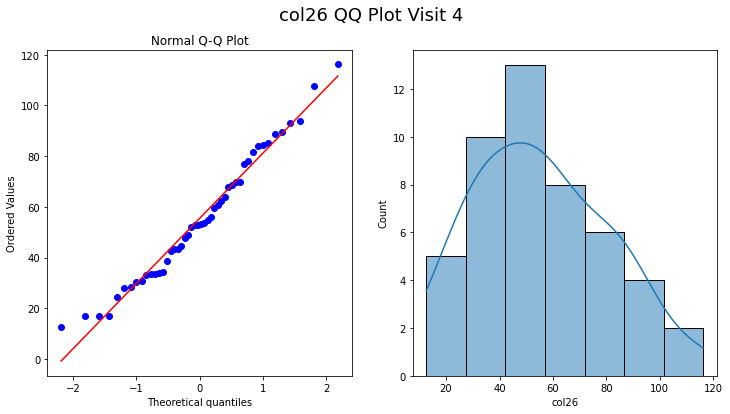

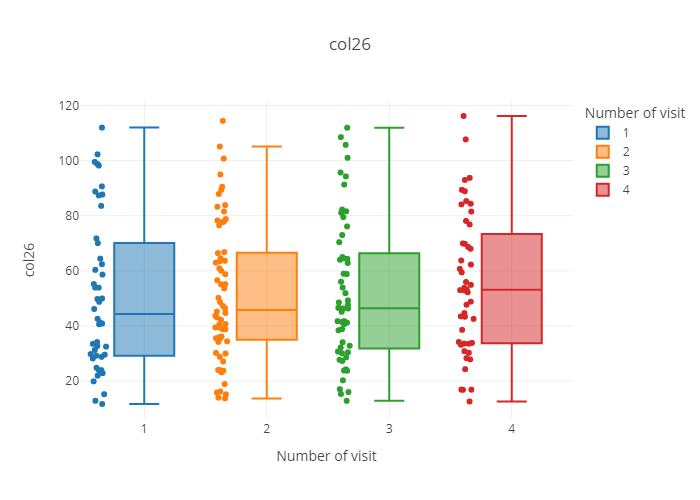

   number_of_visit     median       sem       mean
0                1  44.396960  4.093533  51.032519
1                2  45.802612  3.106223  51.803512
2                3  46.448087  3.410096  52.333012
3                4  53.172212  3.647256  55.439571


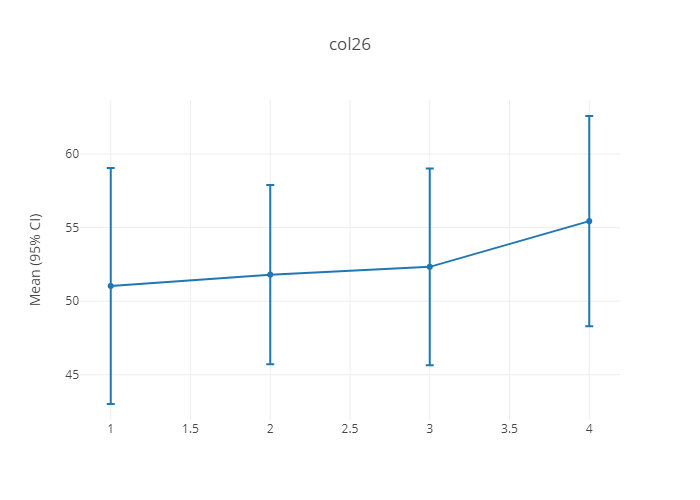

//////////////////////////////////////////////////////////////////////////////////////
col27
                describe                                             \
                   count       mean        std       min        25%   
number_of_visit                                                       
1                   46.0  47.219033  30.889081  8.774373  24.682347   
2                   64.0  48.940777  29.400228  9.615385  28.001888   
3                   57.0  52.360511  29.930185  9.242762  33.081761   
4                   48.0  57.412345  33.519751  7.873090  29.935502   

                                                        sem      skew  
                       50%        75%         max     col27     col27  
number_of_visit                                                        
1                41.077778  58.130318  141.927409  4.554347  1.355562  
2                41.216775  61.593276  132.506527  3.675029  0.986010  
3                49.125168  66.161027  152.666667

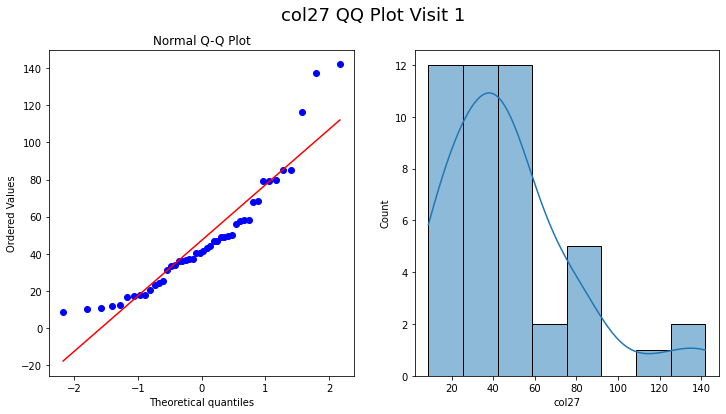

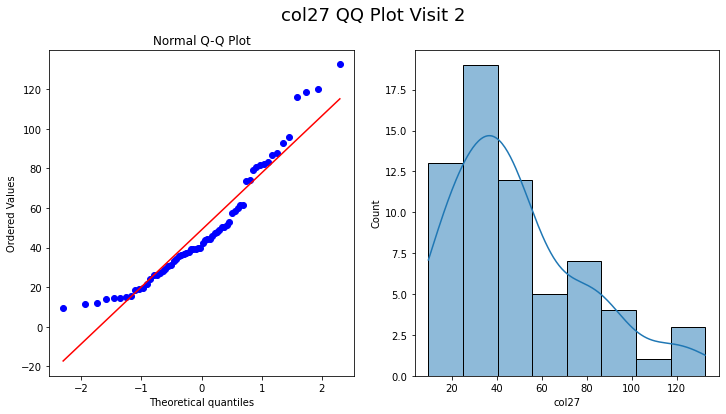

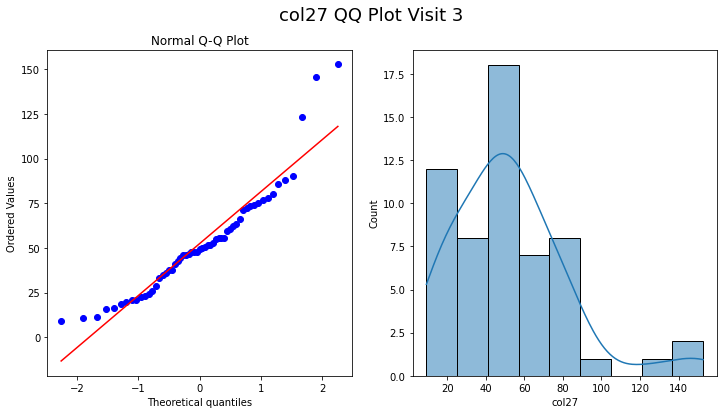

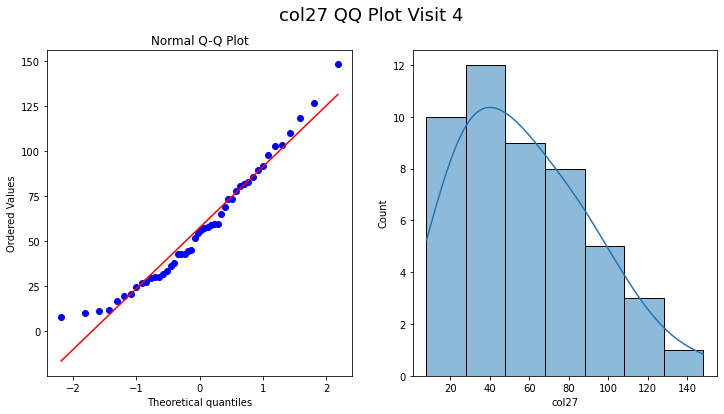

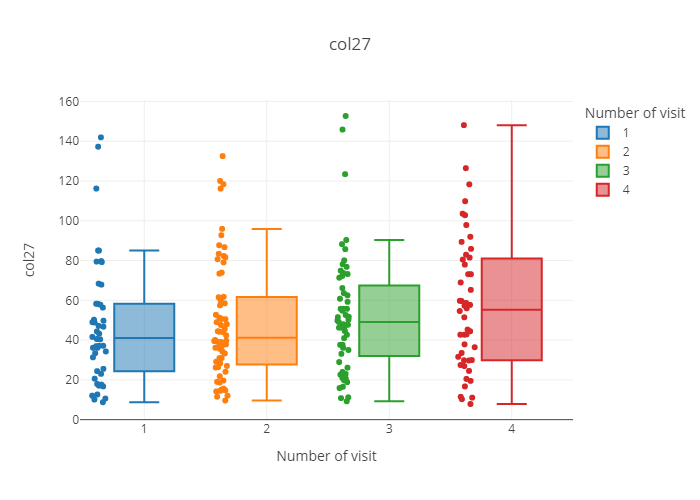

   number_of_visit     median       sem       mean
0                1  41.077778  4.554347  47.219033
1                2  41.216775  3.675029  48.940777
2                3  49.125168  3.964350  52.360511
3                4  55.302764  4.838159  57.412345


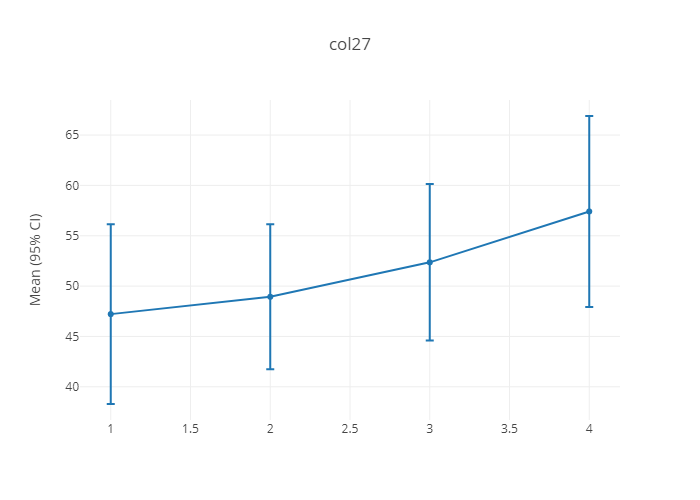

//////////////////////////////////////////////////////////////////////////////////////
col28
                describe                                              \
                   count       mean        std        min        25%   
number_of_visit                                                        
1                   46.0  90.552485  24.404384  33.006892  75.086810   
2                   64.0  90.851219  23.457760  34.731402  74.941957   
3                   57.0  92.042125  19.857986  35.996790  80.254271   
4                   48.0  94.585768  21.562263  37.963970  84.715788   

                                                          sem      skew  
                        50%         75%         max     col28     col28  
number_of_visit                                                          
1                 99.329792  107.236050  130.259216  3.598230 -0.763821  
2                 97.557187  108.694831  131.434684  2.932220 -0.804830  
3                 98.723297  105

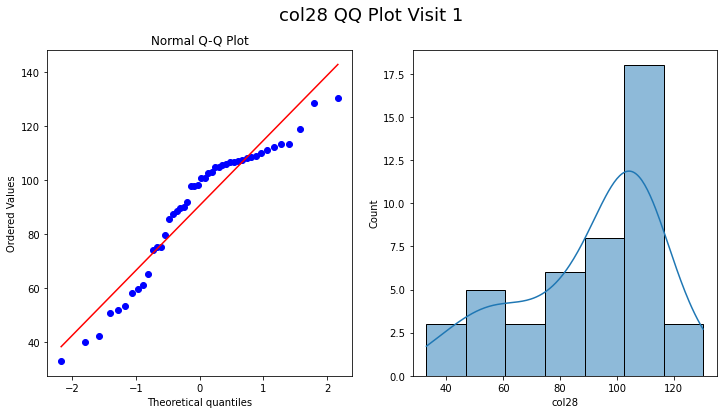

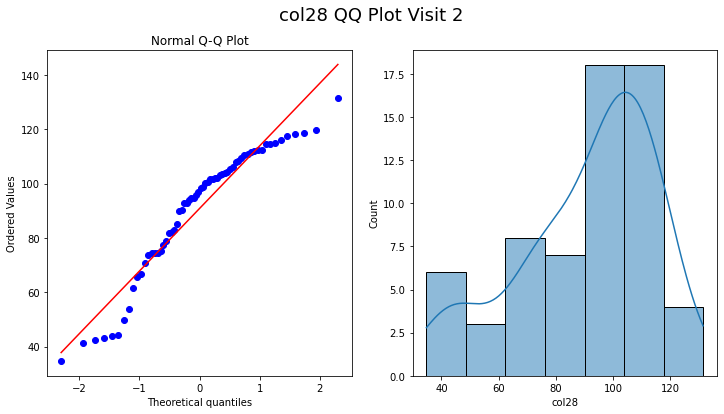

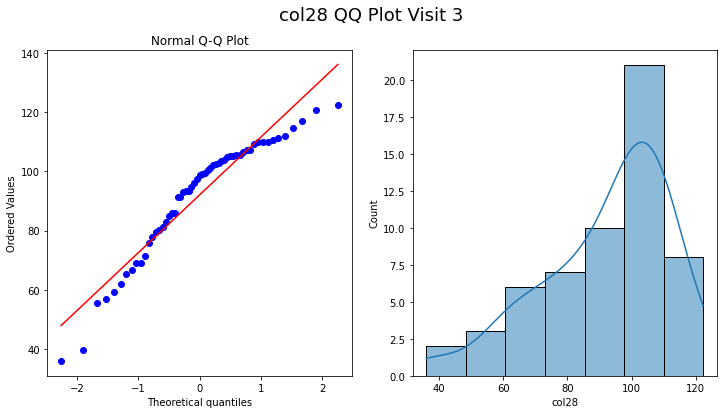

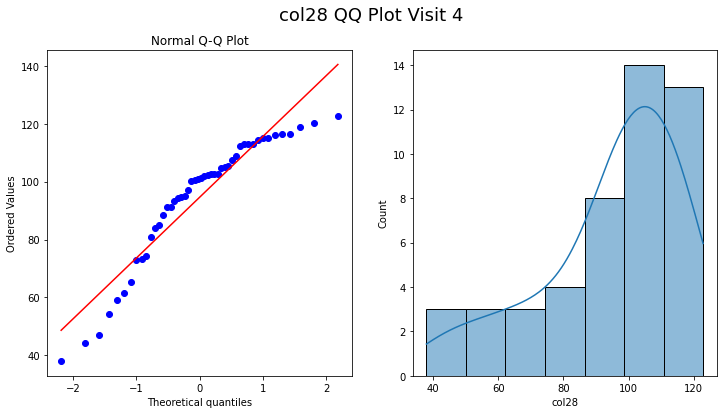

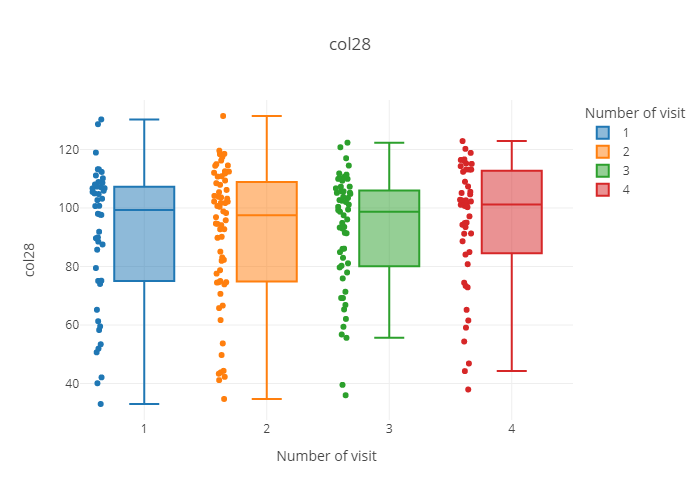

   number_of_visit      median       sem       mean
0                1   99.329792  3.598230  90.552485
1                2   97.557187  2.932220  90.851219
2                3   98.723297  2.630254  92.042125
3                4  101.211549  3.112245  94.585768


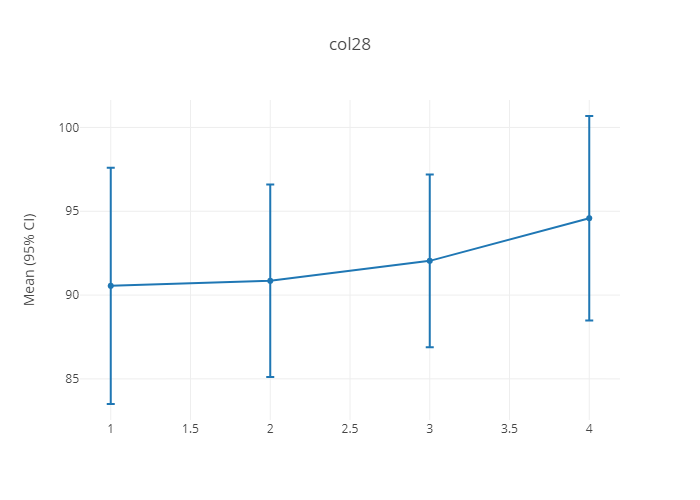

//////////////////////////////////////////////////////////////////////////////////////
col29
                describe                                             \
                   count       mean        std       min        25%   
number_of_visit                                                       
1                   46.0  43.107058  33.354538  4.303279  14.439451   
2                   64.0  45.534611  34.927857  3.809524  21.082549   
3                   57.0  45.242755  33.053866  6.149733  19.195046   
4                   48.0  51.910278  36.081816  5.383023  23.136364   

                                                        sem      skew  
                       50%        75%         max     col29     col29  
number_of_visit                                                        
1                33.952686  58.356354  117.763158  4.917858  0.958472  
2                35.313756  57.104396  167.382812  4.365982  1.336575  
3                33.498759  63.551402  131.054688

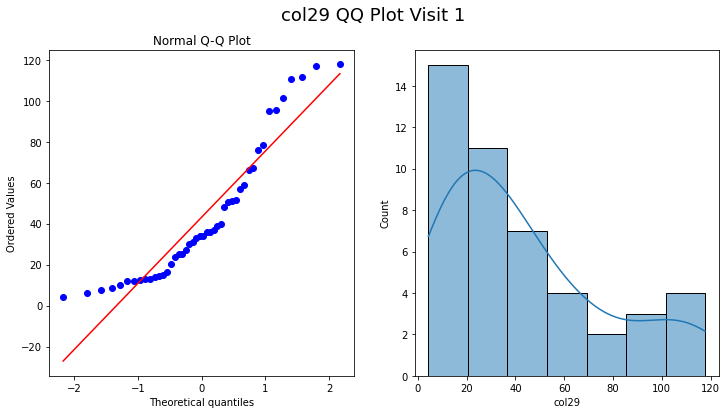

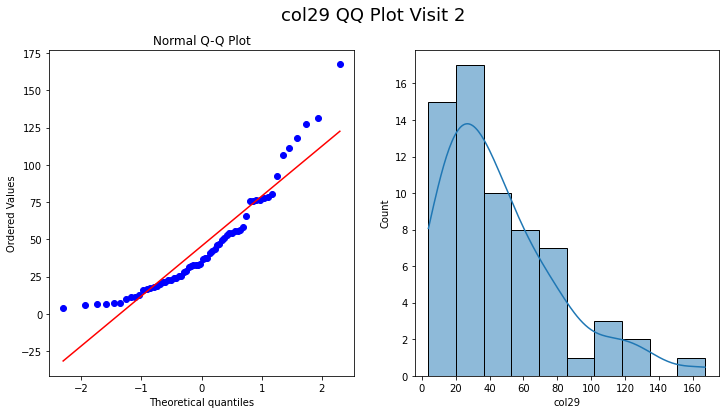

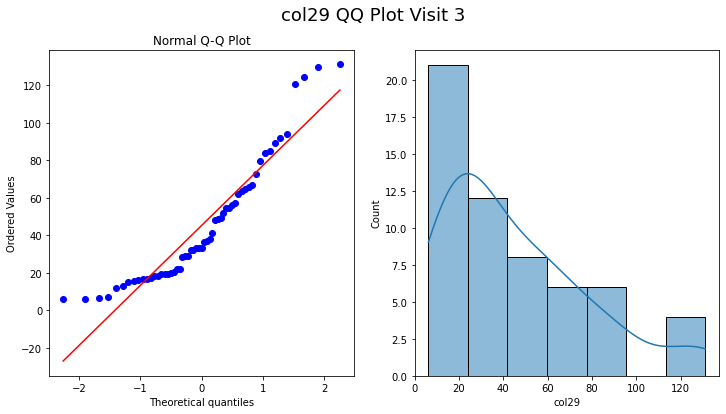

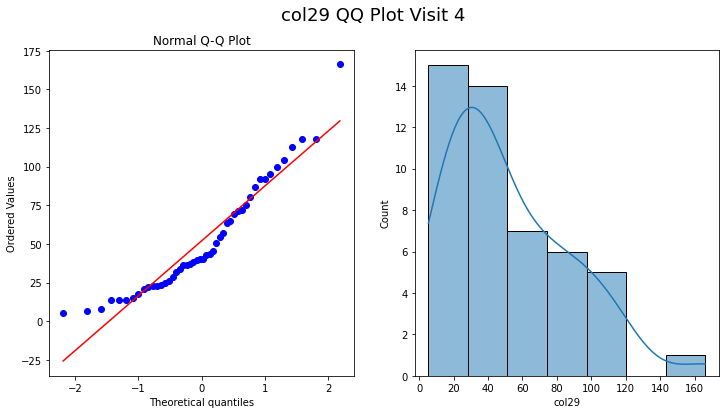

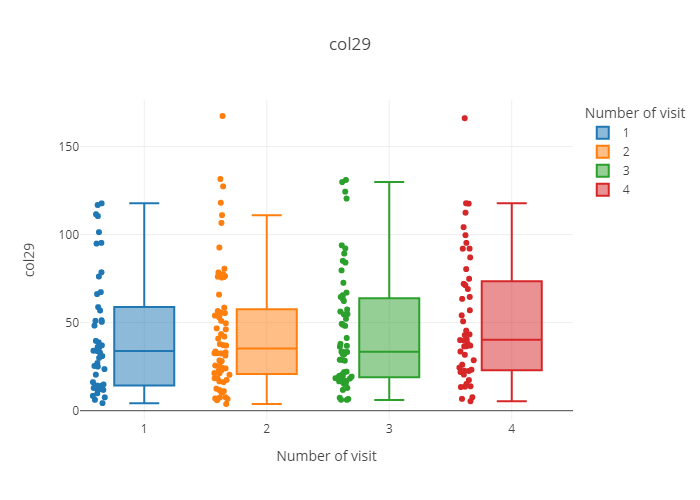

   number_of_visit     median       sem       mean
0                1  33.952686  4.917858  43.107058
1                2  35.313756  4.365982  45.534611
2                3  33.498759  4.378092  45.242755
3                4  40.275514  5.207962  51.910278


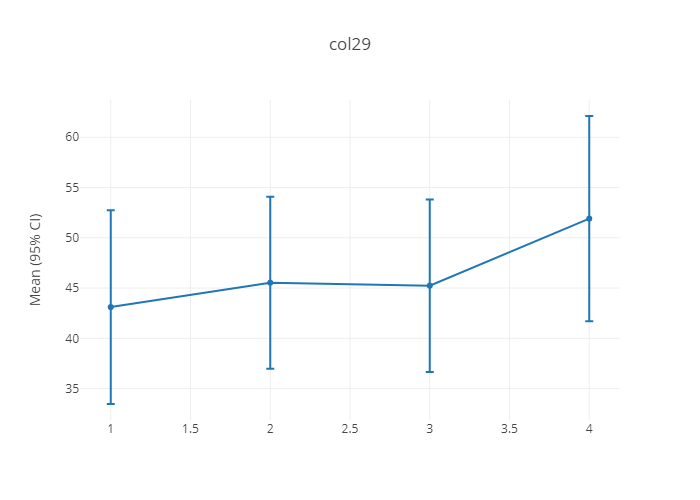

//////////////////////////////////////////////////////////////////////////////////////
col30
                describe                                              \
                   count       mean        std        min        25%   
number_of_visit                                                        
1                   46.0  48.767097  26.371032  11.584507  29.194374   
2                   64.0  50.069096  24.154724  12.077465  33.889225   
3                   57.0  51.285963  25.307348  10.936705  30.973451   
4                   48.0  50.887518  22.893484  12.462757  33.386641   

                                                        sem      skew  
                       50%        75%         max     col30     col30  
number_of_visit                                                        
1                40.751460  64.509613  118.600178  3.888197  0.775792  
2                43.771594  61.028676  121.189701  3.019341  0.701162  
3                46.057901  67.329094  111

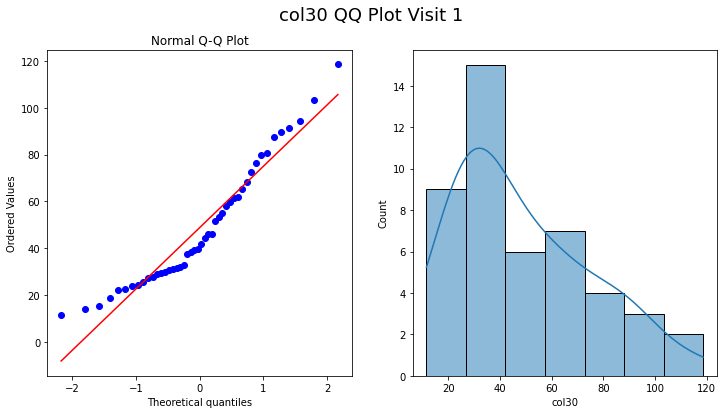

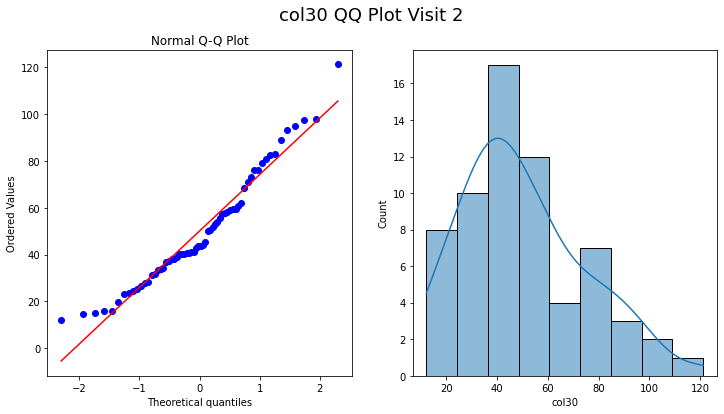

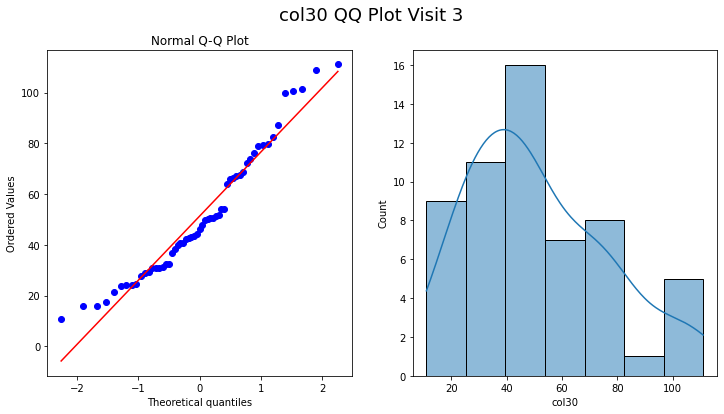

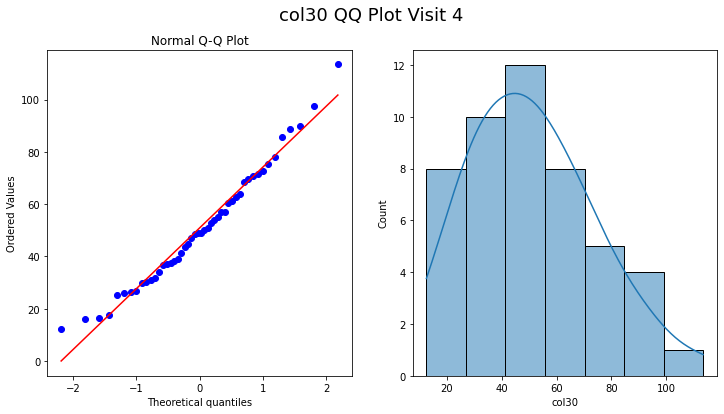

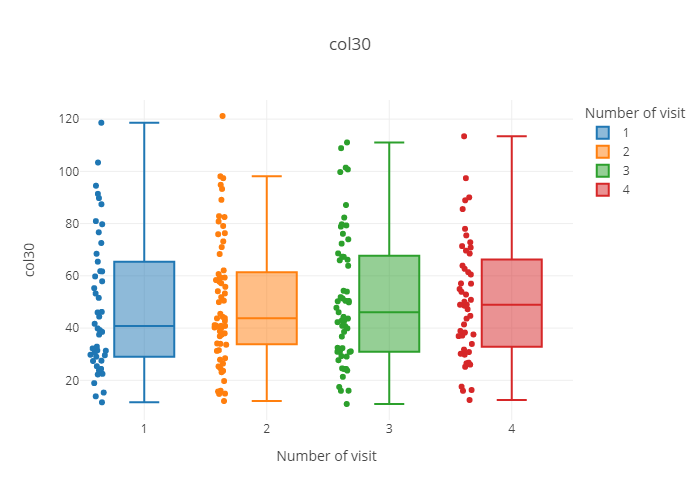

   number_of_visit     median       sem       mean
0                1  40.751460  3.888197  48.767097
1                2  43.771594  3.019341  50.069096
2                3  46.057901  3.352040  51.285963
3                4  48.964122  3.304390  50.887518


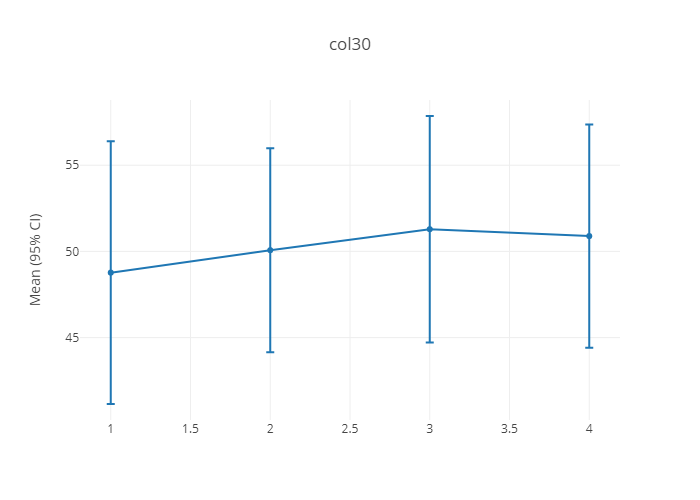

//////////////////////////////////////////////////////////////////////////////////////


In [40]:
visit_reject = range(5, 10, 1)

data_box_plot = []

for i in range(1, 31, 1):
    data_box_plot.append('col' + str(i))

title_box_plot = data_box_plot.copy()
y_asix = data_box_plot.copy()

for i in range(len(data_box_plot)):
    box_plot_group(df2.query("number_of_visit not in @visit_reject"), 'number_of_visit', data_box_plot[i], title_box_plot[i], y_asix[i])#, y_lim[i])

Parametric tests will be used for parameters:
2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30

Nonparametric tests will be used for parameters:
1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27

<a id='Analysis_of_quantitative_data_by_visits'></a>
# Analysis of quantitative (hidden) data by visits
[Table of contents](#content)

<a id='Parametric_tests'></a>
### Parametric tests (ANOVA, Tukey's test)
[Table of contents](#content)

In [41]:
def parametric_test(data, param, group):
    '''visualisation, ANOVA and Tukey's test'''
    
    # graf
    fig = px.box(data, x=group, y=param, color = group, points="all", 
                template="gridon",
                title = param)
    fig.show('png')
    
    data_stat = data.groupby(group, as_index=False)[param].agg({'mean', 'sem'})
    data_stat['95% CI low'] = data_stat['mean'] - data_stat['sem'] * 1.96
    data_stat['95% CI up'] = data_stat['mean'] + data_stat['sem'] * 1.96
    print(data_stat)
    print()
    
    text_ANOVA = param + ' ~ C(' + group + ')'
    
    #two-way ANOVA
    model = ols(text_ANOVA, data=data).fit()
    print(sm.stats.anova_lm(model, typ=2))

    # perform Tukey's test
    tukey = pairwise_tukeyhsd(endog=data[param],
    groups=data[group],
    alpha= 0.05)
    
    #display results
    if True in tukey.reject:
        print('There is a sig difference')
        print("Tukey's test")
        print(tukey)
          
        # mean changing
        data_mean = (data.groupby(group)[param].agg({'mean', 'median', 'sem'}).reset_index())   

        fig = go.Figure(data=go.Scatter(
            x=data_mean['number_of_visit'].astype('str').tolist(),
            y=data_mean['mean'].tolist(),
            error_y=dict(
                type='data', # value of error bar given in data coordinates
                array=(data_mean['sem']*1.96).tolist(),
                visible=True)
        ))

        fig.update_layout(title=param)
        fig.update_layout(template='gridon')
        fig.update_yaxes(title='Mean (95% CI)')
        fig.show('png')
        
    print('/////////////////////////////////////////////////////////////////////////////////////////////////')

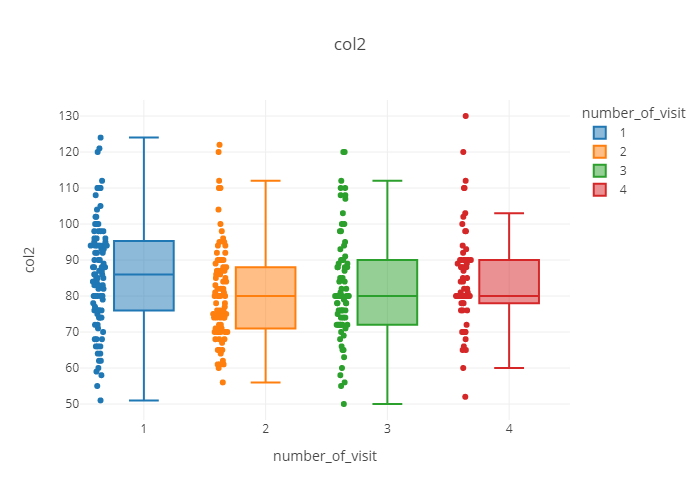

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.551854  85.938144   82.896511  88.979778
2                1.479407  81.011628   78.111991  83.911265
3                1.656088  82.371795   79.125863  85.617727
4                1.533113  83.876712   80.871811  86.881614

                          sum_sq     df         F    PR(>F)
C(number_of_visit)   1214.451049    3.0  1.986441  0.115816
Residual            67250.725598  330.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


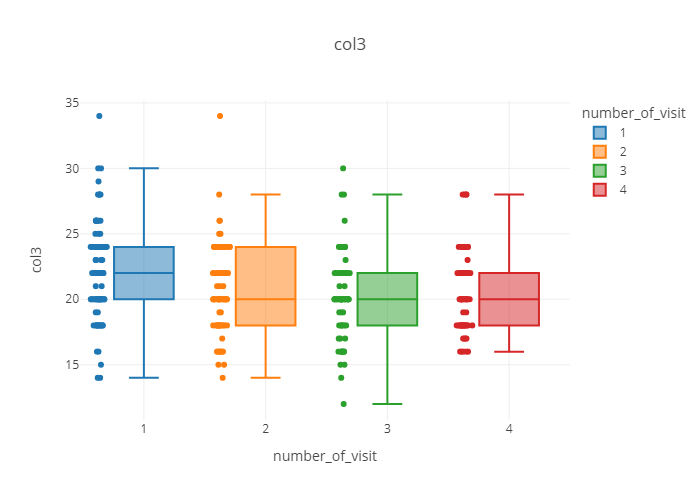

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                0.368695  22.114583   21.391940  22.837226
2                0.356496  20.813953   20.115221  21.512686
3                0.365927  20.294872   19.577655  21.012088
4                0.357063  20.671233   19.971389  21.371077

                         sum_sq     df        F    PR(>F)
C(number_of_visit)   168.477191    3.0  5.07161  0.001908
Residual            3643.090377  329.0      NaN       NaN
There is a sig difference
Tukey's test
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -1.3006 0.0438 -2.5764 -0.0248   True
     1      3  -1.8197 0.0022 -3.1296 -0.5099   True
     1      4  -1.4434 0.0282 -2.7777  -0.109   True
     2      3  -0.5191 0.7509 -1.8626  0.8245  False
     2      4  -0.1427 0.9931 -1.5102  1.2247  False
  

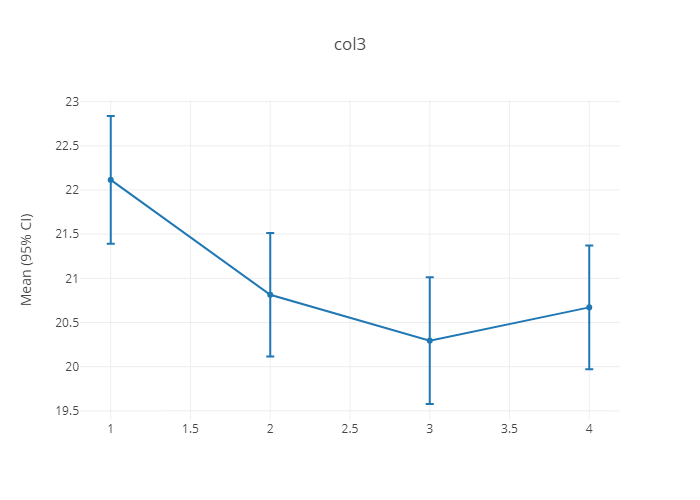

/////////////////////////////////////////////////////////////////////////////////////////////////


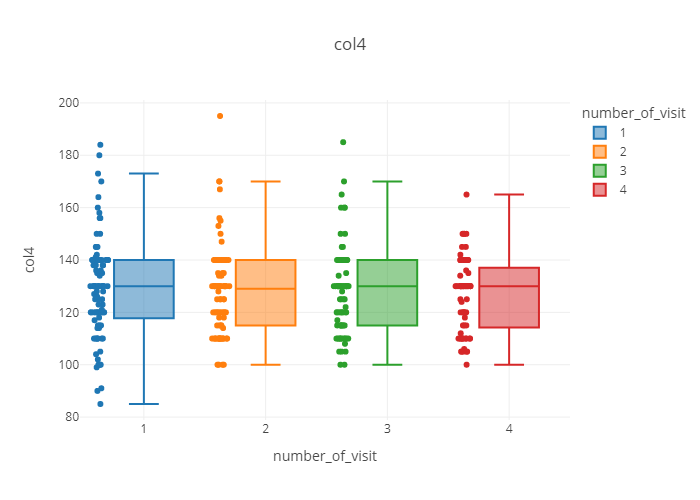

                      sem        mean  95% CI low   95% CI up
number_of_visit                                              
1                1.905215  128.680412  124.946192  132.414633
2                1.839120  127.430233  123.825556  131.034909
3                1.888274  127.743590  124.042572  131.444607
4                1.632886  126.465753  123.265296  129.666210

                          sum_sq     df         F  PR(>F)
C(number_of_visit)    210.193834    3.0  0.246089  0.8641
Residual            93955.210357  330.0       NaN     NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


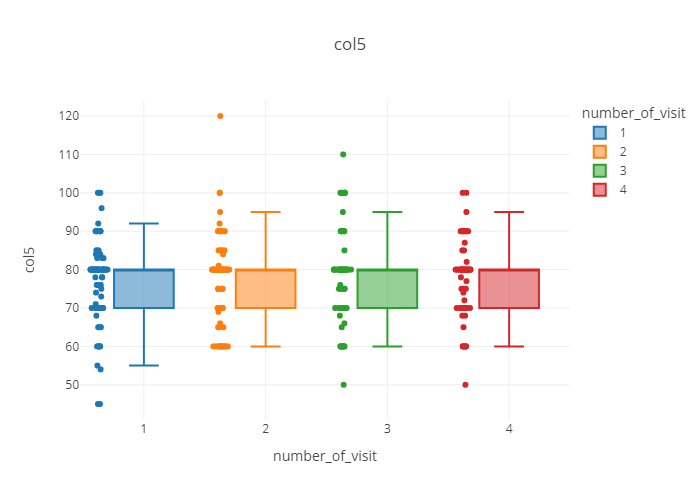

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.064593  77.041237   74.954635  79.127840
2                1.190844  77.174419   74.840364  79.508473
3                1.371266  77.500000   74.812319  80.187681
4                1.177212  77.205479   74.898143  79.512816

                          sum_sq     df         F    PR(>F)
C(number_of_visit)      9.408329    3.0  0.026202  0.994263
Residual            39497.636581  330.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


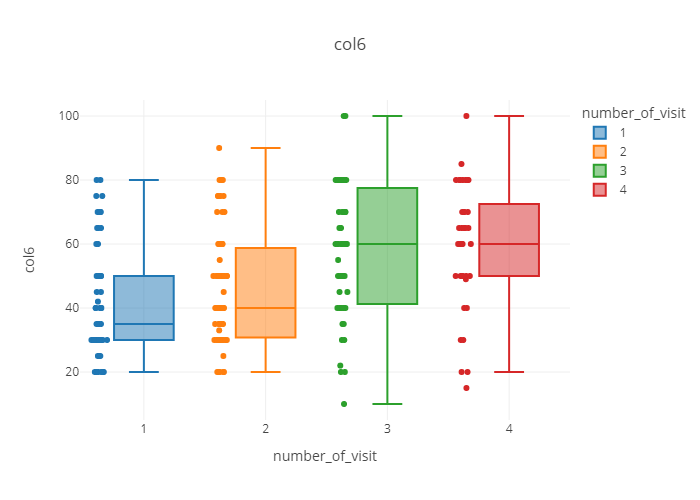

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                2.358323  42.000000   37.377687  46.622313
2                2.226295  46.317460   41.953923  50.680998
3                2.724371  57.763636   52.423869  63.103404
4                3.250979  59.297297   52.925378  65.669217

                          sum_sq     df          F    PR(>F)
C(number_of_visit)  10912.445758    3.0  10.369718  0.000002
Residual            72611.307796  207.0        NaN       NaN
There is a sig difference
Tukey's test
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   4.3175 0.5925 -4.5916 13.2265  False
     1      3  15.7636 0.0001  6.5548 24.9725   True
     1      4  17.2973 0.0001  7.0203 27.5743   True
     2      3  11.4462  0.006  2.4944  20.398   True
     2      4  12.9798 0.0053  2.9325 23.0271 

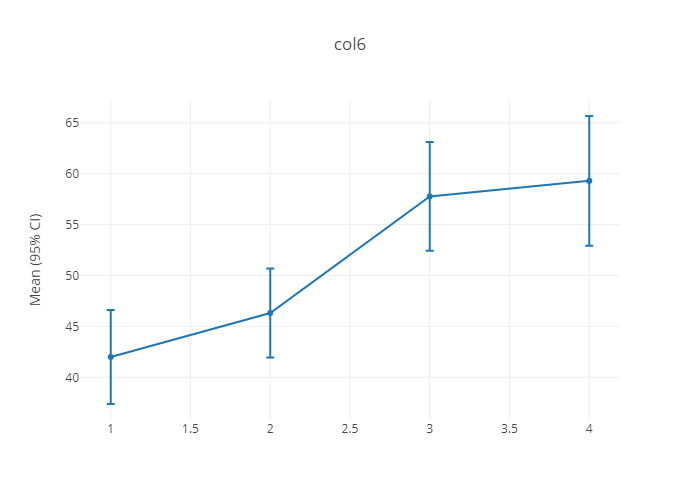

/////////////////////////////////////////////////////////////////////////////////////////////////


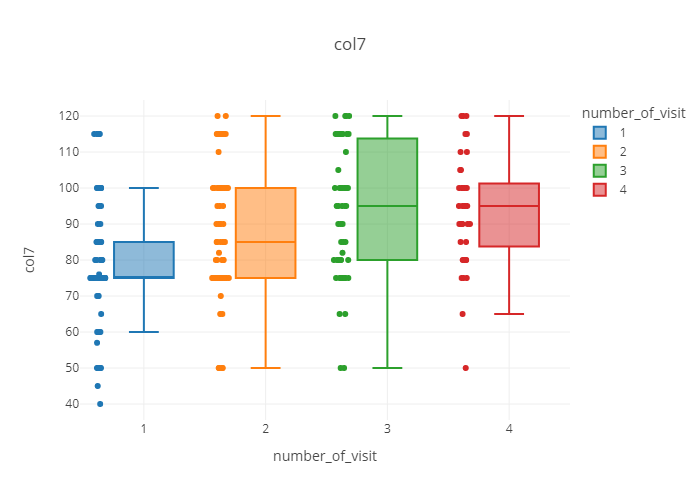

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.854918  77.867470   74.231831  81.503109
2                2.035606  87.324324   83.334537  91.314111
3                2.471170  92.945455   88.101962  97.788947
4                2.567765  93.648649   88.615829  98.681468

                          sum_sq     df          F        PR(>F)
C(number_of_visit)  10405.872417    3.0  11.685931  3.494865e-07
Residual            72721.027181  245.0        NaN           NaN
There is a sig difference
Tukey's test
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   9.4569 0.0039  2.3317  16.582   True
     1      3   15.078    0.0  7.3294 22.8265   True
     1      4  15.7812    0.0  6.9717 24.5907   True
     2      3   5.6211 0.2605  -2.313 13.5553  False
     2      4   6.3243 0.2649 -2.6

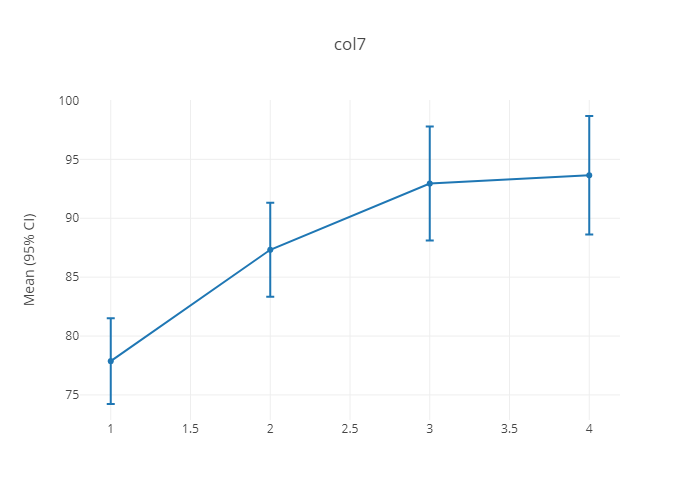

/////////////////////////////////////////////////////////////////////////////////////////////////


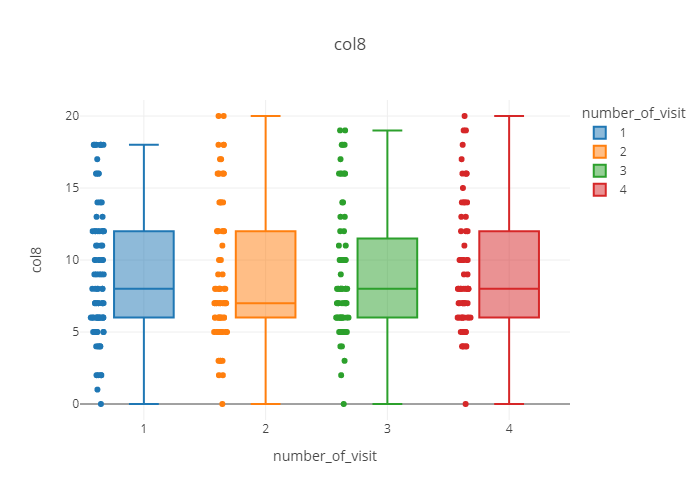

                      sem      mean  95% CI low  95% CI up
number_of_visit                                           
1                0.480002  9.010989    8.070186   9.951792
2                0.551654  9.013333    7.932092  10.094575
3                0.526837  9.041667    8.009065  10.074268
4                0.515469  9.257143    8.246823  10.267462

                         sum_sq     df         F    PR(>F)
C(number_of_visit)     3.060361    3.0  0.049396  0.985456
Residual            6278.222106  304.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


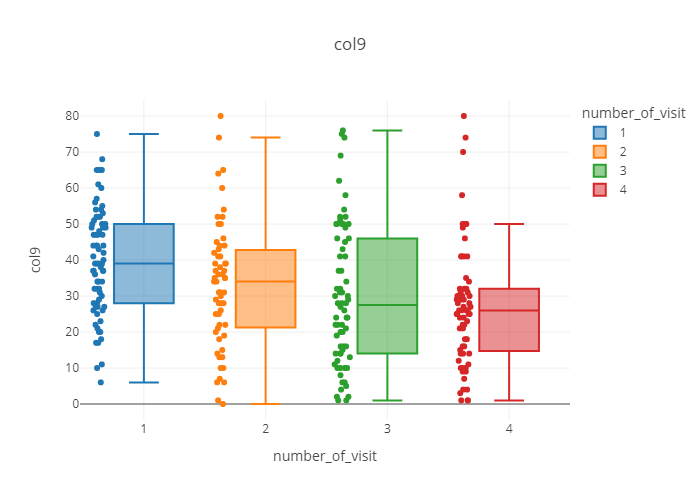

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.708514  39.662162   36.313474  43.010850
2                2.258877  33.050847   28.623448  37.478247
3                2.324551  29.685714   25.129594  34.241834
4                2.019302  27.000000   23.042169  30.957831

                          sum_sq     df        F    PR(>F)
C(number_of_visit)   6454.792186    3.0  7.34928  0.000094
Residual            78460.487226  268.0      NaN       NaN
There is a sig difference
Tukey's test
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     1      2  -6.6113 0.1221 -14.3317  1.1091  False
     1      3  -9.9764 0.0031 -17.3516 -2.6013   True
     1      4 -12.6622 0.0001 -20.0648 -5.2596   True
     2      3  -3.3651  0.682 -11.1828  4.4525  False
     2      4  -6.0508 0.1927 -13.8944  1.792

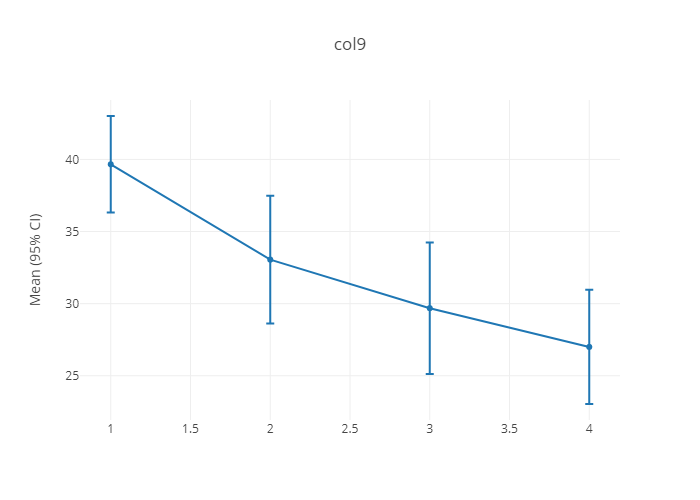

/////////////////////////////////////////////////////////////////////////////////////////////////


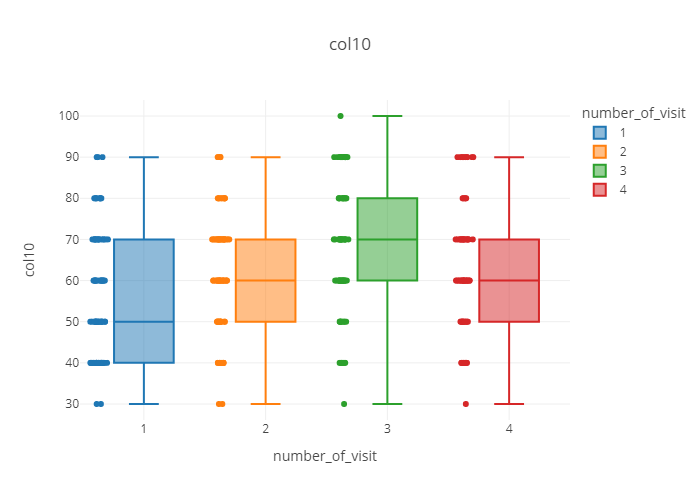

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.569718  54.680851   51.604203  57.757499
2                1.591550  61.463415   58.343977  64.582852
3                1.931152  67.027027   63.241968  70.812086
4                1.811727  62.739726   59.188741  66.290711

                          sum_sq     df         F    PR(>F)
C(number_of_visit)   6679.288747    3.0  9.374401  0.000006
Residual            75762.816516  319.0       NaN       NaN
There is a sig difference
Tukey's test
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     1      2   6.7826   0.02   0.7683 12.7968   True
     1      3  12.3462    0.0   6.1608 18.5316   True
     1      4   8.0589  0.005   1.8498 14.2679   True
     2      3   5.5636 0.1118   -0.818 11.9453  False
     2      4   1.2763 0.9556  -5.1283  7.

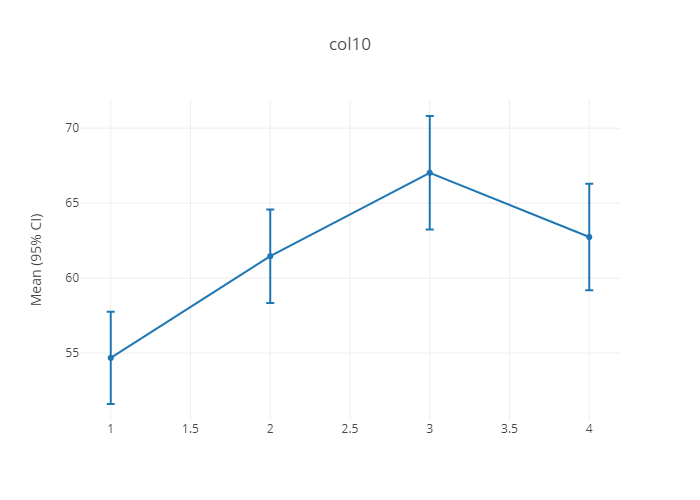

/////////////////////////////////////////////////////////////////////////////////////////////////


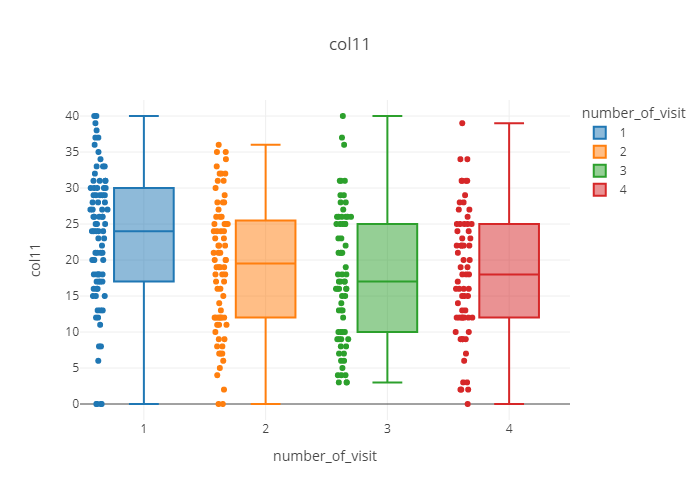

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                1.002720  23.046512   21.081181  25.011842
2                1.043516  19.039474   16.994181  21.084766
3                1.099246  17.714286   15.559764  19.868807
4                1.090942  18.044776   15.906529  20.183023

                          sum_sq     df         F    PR(>F)
C(number_of_visit)   1455.357095    3.0  5.804307  0.000725
Residual            24655.846918  295.0       NaN       NaN
There is a sig difference
Tukey's test
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   -4.007  0.029 -7.7258 -0.2883   True
     1      3  -5.3322 0.0019 -9.1347 -1.5298   True
     1      4  -5.0017 0.0049 -8.8508 -1.1527   True
     2      3  -1.3252 0.8178 -5.2383  2.5879  False
     2      4  -0.9947 0.9158 -4.9531  2.9637  Fa

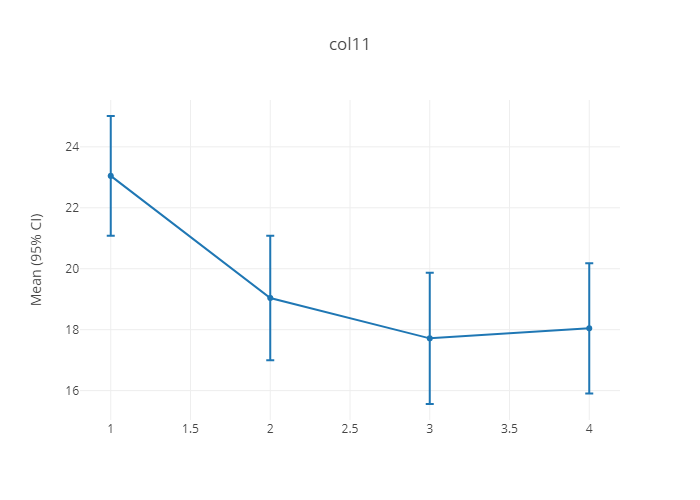

/////////////////////////////////////////////////////////////////////////////////////////////////


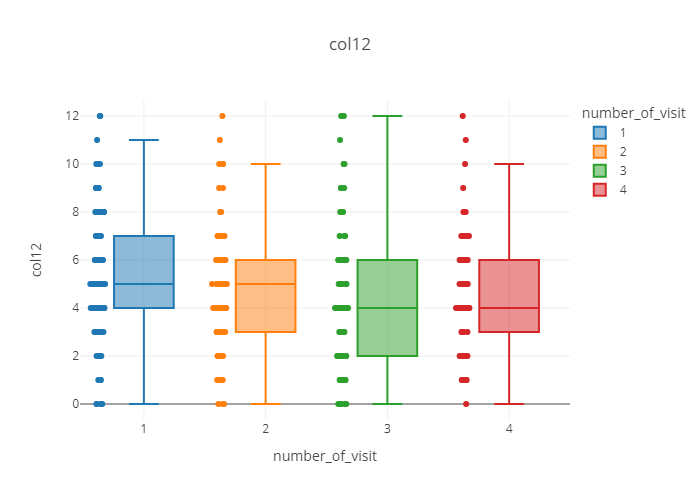

                      sem      mean  95% CI low  95% CI up
number_of_visit                                           
1                0.290958  5.233333    4.663055   5.803611
2                0.298010  4.714286    4.130187   5.298384
3                0.363129  4.441176    3.729445   5.152908
4                0.304408  4.621212    4.024572   5.217852

                         sum_sq     df         F    PR(>F)
C(number_of_visit)    28.282732    3.0  1.274978  0.283085
Residual            2196.109295  297.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


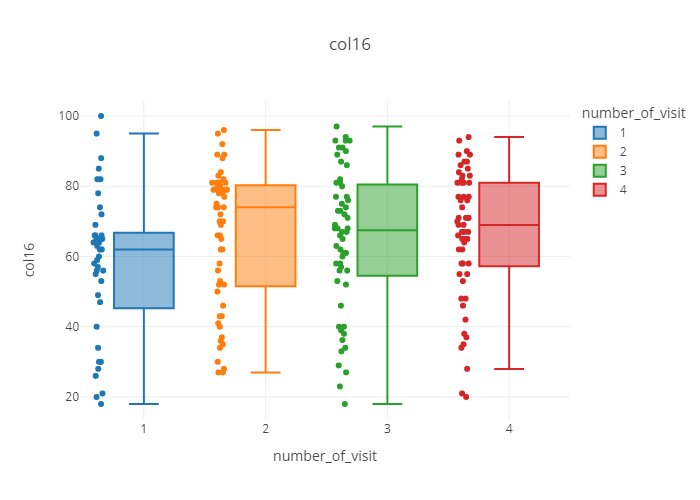

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                3.237179  57.560976   51.216105  63.905846
2                2.589172  65.912281   60.837504  70.987057
3                2.722313  64.896429   59.560696  70.232162
4                2.443613  66.473684   61.684203  71.263165

                          sum_sq     df         F    PR(>F)
C(number_of_visit)   2295.920607    3.0  1.968648  0.119802
Residual            80470.708777  207.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


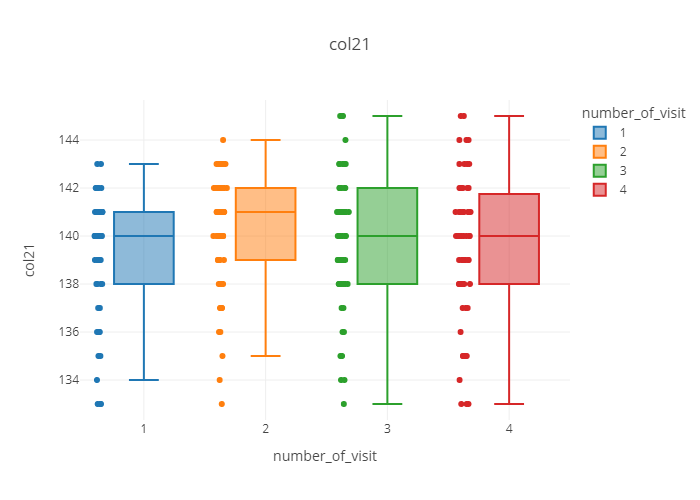

                      sem        mean  95% CI low   95% CI up
number_of_visit                                              
1                0.374068  139.060000  138.326828  139.793172
2                0.302586  140.209677  139.616608  140.802747
3                0.351825  139.883333  139.193757  140.572910
4                0.395269  139.457627  138.682901  140.232354

                         sum_sq     df        F    PR(>F)
C(number_of_visit)    42.009141    3.0  1.91266  0.128311
Residual            1661.921595  227.0      NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


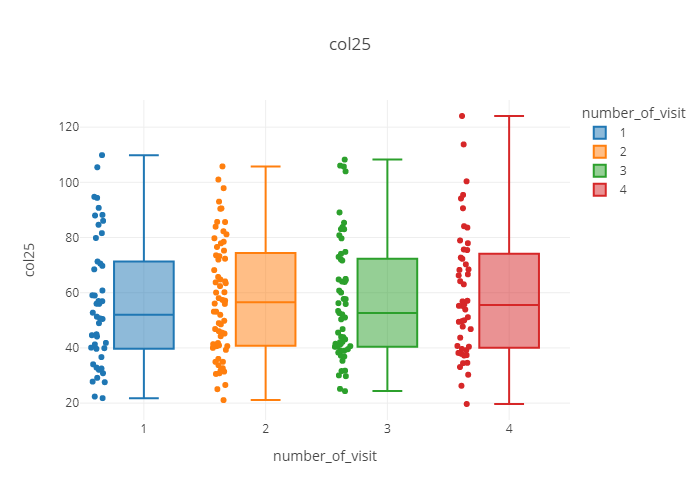

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                3.464423  56.662729   49.872460  63.452998
2                2.627490  58.144164   52.994283  63.294044
3                2.867877  57.096303   51.475264  62.717343
4                3.349891  59.744944   53.179157  66.310731

                           sum_sq     df         F    PR(>F)
C(number_of_visit)     274.425302    3.0  0.185144  0.906424
Residual            104249.966485  211.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


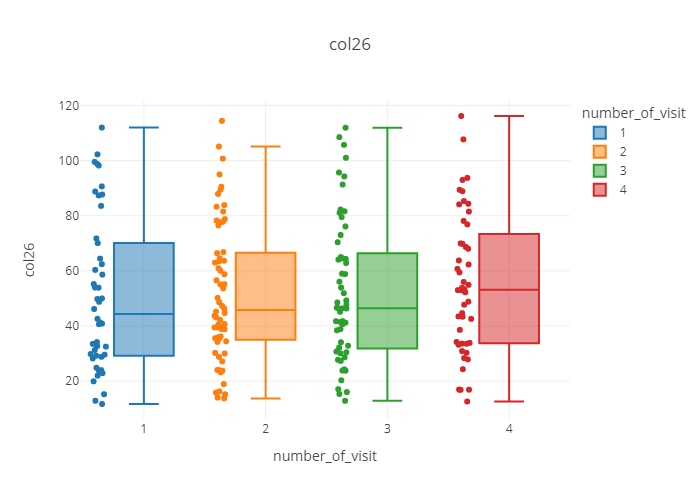

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                4.093533  51.032519   43.009194  59.055845
2                3.106223  51.803512   45.715315  57.891710
3                3.410096  52.333012   45.649223  59.016801
4                3.647256  55.439571   48.290949  62.588193

                           sum_sq     df         F    PR(>F)
C(number_of_visit)     544.699208    3.0  0.272247  0.845375
Residual            140719.650581  211.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


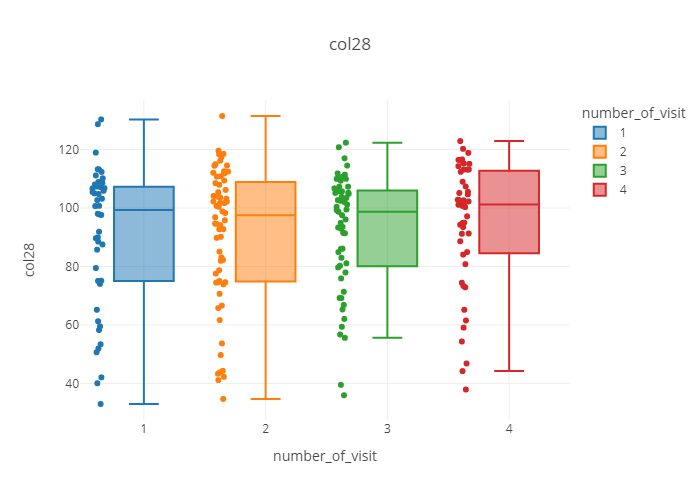

                      sem       mean  95% CI low   95% CI up
number_of_visit                                             
1                3.598230  90.552485   83.499954   97.605016
2                2.932220  90.851219   85.104068   96.598370
3                2.630254  92.042125   86.886826   97.197424
4                3.112245  94.585768   88.485769  100.685767

                           sum_sq     df         F    PR(>F)
C(number_of_visit)     501.023914    3.0  0.334325  0.800535
Residual            105402.400267  211.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


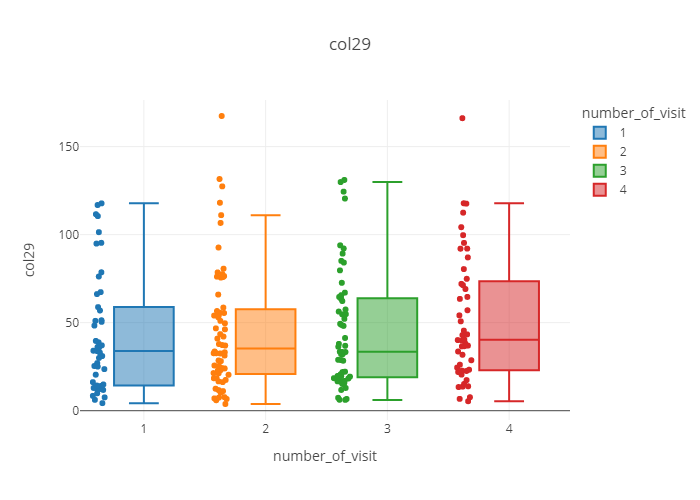

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                4.917858  43.107058   33.468056  52.746061
2                4.365982  45.534611   36.977286  54.091936
3                4.378092  45.242755   36.661695  53.823814
4                5.207962  51.910278   41.702673  62.117882

                           sum_sq     df         F    PR(>F)
C(number_of_visit)    2080.173193    3.0  0.586881  0.624231
Residual            249293.246749  211.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


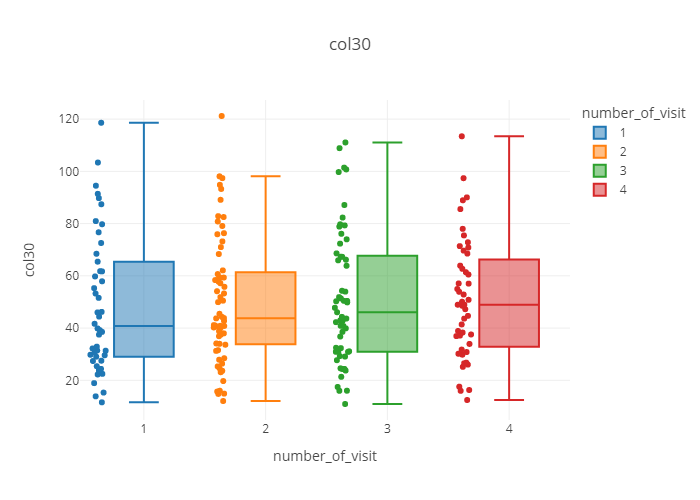

                      sem       mean  95% CI low  95% CI up
number_of_visit                                            
1                3.888197  48.767097   41.146232  56.387963
2                3.019341  50.069096   44.151189  55.987004
3                3.352040  51.285963   44.715964  57.855961
4                3.304390  50.887518   44.410914  57.364122

                           sum_sq     df         F    PR(>F)
C(number_of_visit)     183.478397    3.0  0.100385  0.959717
Residual            128550.916501  211.0       NaN       NaN
/////////////////////////////////////////////////////////////////////////////////////////////////


In [42]:
# ANOVA, Tukey's test
for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]:
    param = 'col' + str(i)
    parametric_test(df2[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [43]:
# for the first therapy group
# for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]:
#     param = 'col' + str(i)
#     parametric_test(df_united.query('group == 1')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [44]:
# for the second therapy group
# for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]:
#     param = 'col' + str(i)
#     parametric_test(df_united.query('group == 2')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [45]:
# for the third therapy group
# for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]:
#     param = 'col' + str(i)
#     parametric_test(df_united.query('group == 3')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

<a id='Nonparametric_tests'></a>
### Nonparametric tests (Kruskal Wallis test, Mann-Whitneyu test [method for adjusting p values - Bonferroni])
[Table of contents](#content)

In [46]:
def nonparametric_test(data, param, group):
    
    # descriptive statistics
    print(data[[group, param]].dropna().groupby(group, as_index='False')[param].agg({'describe'}))
    
    # graf
    fig = px.box(data, x=group, y=param, color = group, points="all", 
                template="gridon",
                title = param)
    fig.show('png')

    # Kruskal-Wallis test
    a = df2.query('number_of_visit == 1')[param].dropna().tolist()
    b = df2.query('number_of_visit == 2')[param].dropna().tolist()
    c = df2.query('number_of_visit == 3')[param].dropna().tolist()
    d = df2.query('number_of_visit == 4')[param].dropna().tolist()
    st, p_value = stats.kruskal(a, b, c, d, nan_policy='omit')
    
    print(param)
    print('H(3) =', round(st, 2), 'p =', round(p_value, 2))    

    # Mann-Whitneyu test. Method for adjusting p values - Bonferroni
    if p_value < 0.05:
        print('Mann-Whitneyu test. Method for adjusting p values - Bonferroni')
        print(sp.posthoc_mannwhitney(data, val_col=param, group_col=group, alternative='two-sided', p_adjust='bonferroni'))
    print('//////////////////////////////////////////////////////////////////////////////////////////////////////')

                describe                                                   
                   count       mean       std   min   25%   50%   75%   max
number_of_visit                                                            
1                   97.0  93.783505  3.816703  78.0  92.0  95.0  96.0  99.0
2                   87.0  93.977011  4.057657  80.0  92.0  95.0  97.0  99.0
3                   78.0  94.179487  3.638694  81.0  93.0  95.0  97.0  99.0
4                   73.0  94.520548  3.753182  83.0  93.0  95.0  98.0  99.0


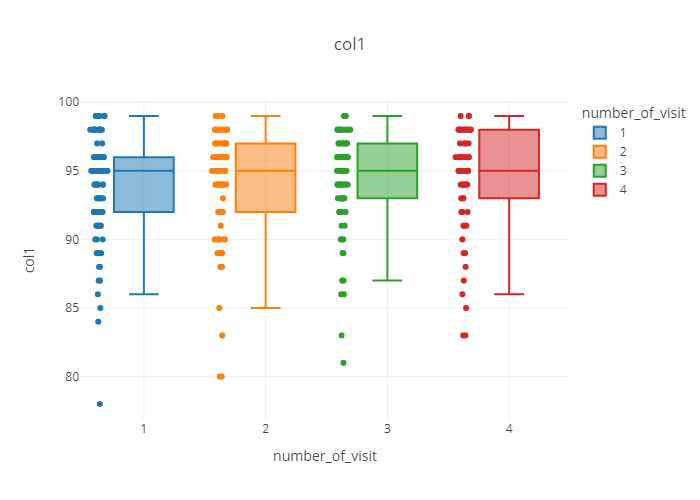

col1
H(3) = 2.66 p = 0.45
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                             
                   count      mean       std  min  25%  50%  75%  max
number_of_visit                                                      
1                   92.0  3.065217  1.174868  0.0  2.0  3.5  4.0  4.0
2                   75.0  2.866667  1.166345  0.0  2.0  3.0  4.0  4.0
3                   69.0  2.492754  1.378652  0.0  1.0  3.0  4.0  4.0
4                   68.0  2.720588  1.207509  0.0  2.0  3.0  4.0  4.0


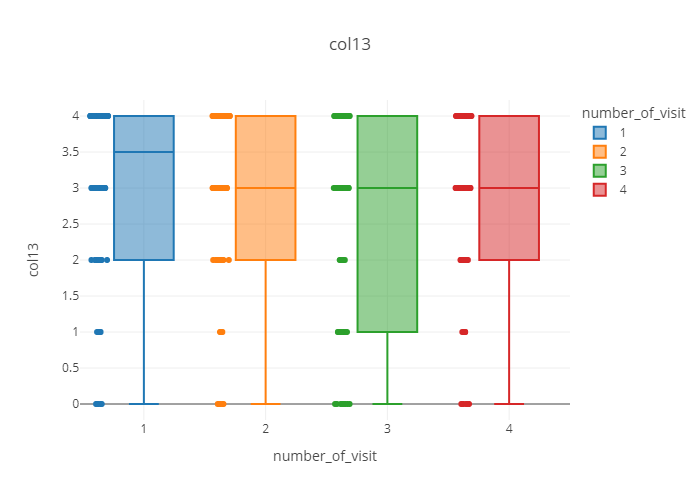

col13
H(3) = 9.37 p = 0.02
Mann-Whitneyu test. Method for adjusting p values - Bonferroni
          1         2         3         4
1  1.000000  0.962957  0.027647  0.182336
2  0.962957  1.000000  0.791287  1.000000
3  0.027647  0.791287  1.000000  1.000000
4  0.182336  1.000000  1.000000  1.000000
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                    
                   count      mean       std   min     25%   50%   75%   max
number_of_visit                                                             
1                   50.0  7.431000  0.055485  7.30  7.4000  7.43  7.48  7.53
2                   62.0  7.414468  0.044745  7.30  7.3925  7.42  7.44  7.60
3                   60.0  7.402667  0.058999  7.10  7.3975  7.40  7.43  7.54
4                   60.0  7.404700  0.028638  7.32  7.3975  7.40  7.42  7.47


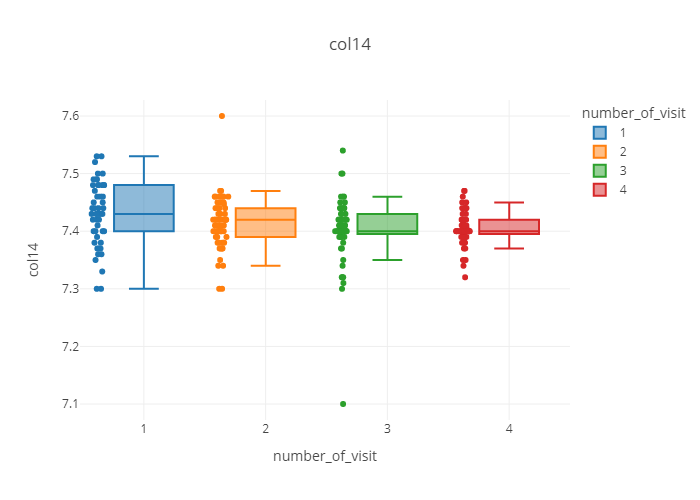

col14
H(3) = 12.89 p = 0.0
Mann-Whitneyu test. Method for adjusting p values - Bonferroni
          1         2         3         4
1  1.000000  0.231217  0.043739  0.008792
2  0.231217  1.000000  1.000000  0.449244
3  0.043739  1.000000  1.000000  1.000000
4  0.008792  0.449244  1.000000  1.000000
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                   \
                   count       mean        std   min     25%    50%   75%   
number_of_visit                                                             
1                   49.0  43.681633  10.267844  24.8  36.500  41.80  47.2   
2                   62.0  45.216129   7.452433  30.0  40.300  44.40  50.7   
3                   59.0  45.376271  10.244685  29.0  39.000  42.20  49.3   
4                   60.0  44.121667   7.563003  26.0  40.175  43.05  48.1   

                       
                  max  
number_of

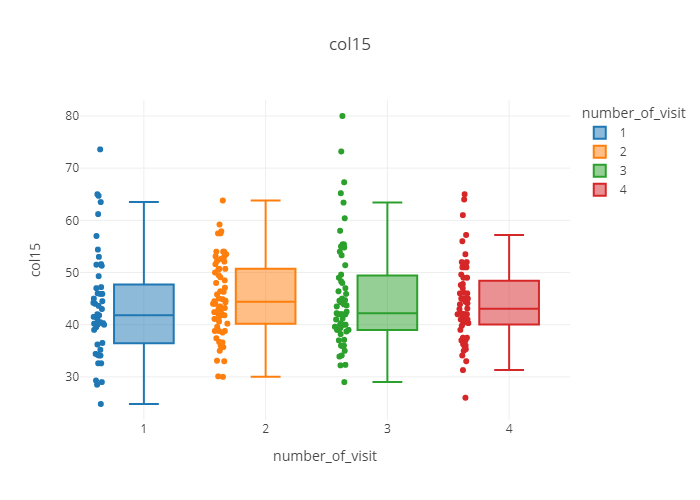

col15
H(3) = 2.24 p = 0.52
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                              
                   count      mean       std  min  25%  50%  75%   max
number_of_visit                                                       
1                   49.0  3.795918  4.425210 -6.0  2.0  3.0  6.0  24.0
2                   59.0  4.322034  3.334463 -2.0  2.0  4.0  6.5  16.0
3                   58.0  3.206897  2.660686 -2.0  2.0  2.5  5.0  12.0
4                   58.0  2.724138  2.483582 -3.0  1.0  2.0  4.0  11.0


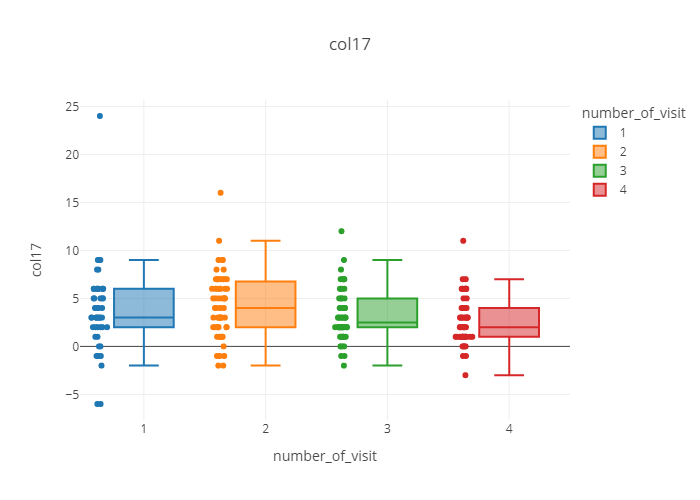

col17
H(3) = 10.33 p = 0.02
Mann-Whitneyu test. Method for adjusting p values - Bonferroni
          1         2         3         4
1  1.000000  1.000000  1.000000  0.343275
2  1.000000  1.000000  0.215181  0.018268
3  1.000000  0.215181  1.000000  1.000000
4  0.343275  0.018268  1.000000  1.000000
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                     
                   count       mean       std   min     25%   50%   75%   max
number_of_visit                                                              
1                   49.0  29.140816  5.871645  16.3  26.100  28.6  30.7  50.3
2                   62.0  29.343548  4.013650  22.0  26.275  29.4  32.0  42.2
3                   59.0  28.106780  3.763796  22.0  25.800  27.5  30.0  40.8
4                   59.0  27.549153  3.690920  19.0  25.450  27.4  30.0  39.7


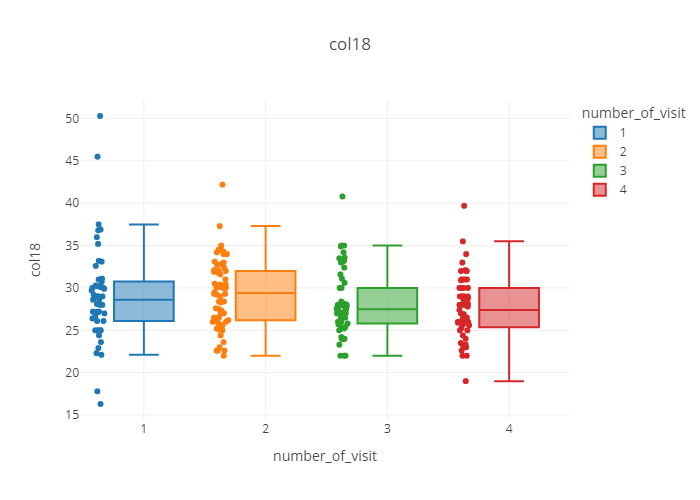

col18
H(3) = 7.85 p = 0.05
Mann-Whitneyu test. Method for adjusting p values - Bonferroni
          1         2         3         4
1  1.000000  1.000000  1.000000  0.595243
2  1.000000  1.000000  0.407242  0.054813
3  1.000000  0.407242  1.000000  1.000000
4  0.595243  0.054813  1.000000  1.000000
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                    
                   count       mean       std   min   25%   50%    75%   max
number_of_visit                                                             
1                   47.0  30.510638  5.985026  17.0  27.5  30.0  32.00  50.0
2                   62.0  30.774194  4.154474  23.0  28.0  31.0  33.75  44.0
3                   59.0  29.376271  3.619123  23.0  27.0  29.0  31.50  37.0
4                   59.0  29.033898  4.012765  20.0  26.5  29.0  31.00  42.0


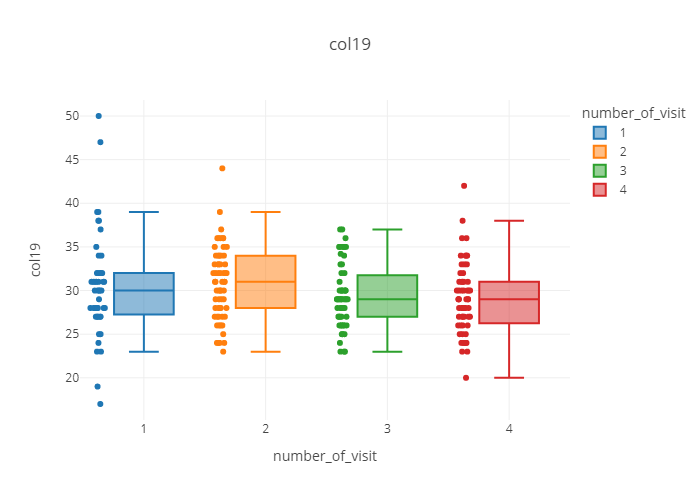

col19
H(3) = 6.94 p = 0.07
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                    
                   count       mean       std   min   25%   50%   75%    max
number_of_visit                                                             
1                   47.0  93.404255  4.599903  82.0  91.0  93.0  98.0   99.0
2                   49.0  94.653061  3.332610  86.0  94.0  95.0  97.0   99.0
3                   49.0  93.755102  3.591254  85.0  91.0  94.0  97.0  100.0
4                   50.0  93.840000  3.513008  84.0  92.0  94.5  96.0   99.0


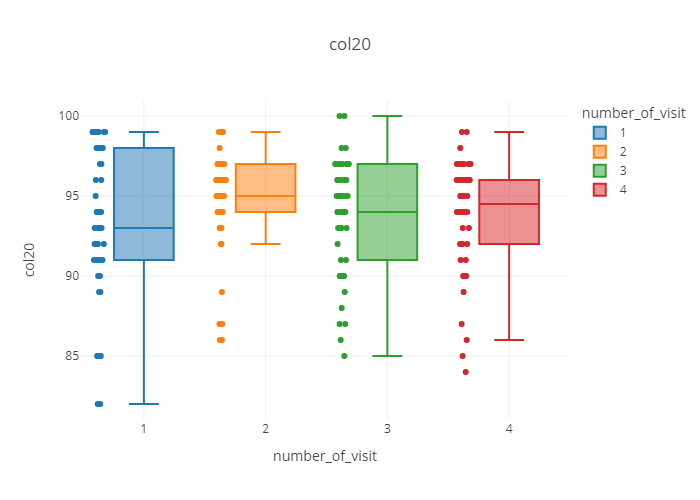

col20
H(3) = 2.88 p = 0.41
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                 
                   count      mean       std  min    25%   50%   75%  max
number_of_visit                                                          
1                   50.0  4.312000  0.959515  2.7  3.900  4.15  4.45  8.2
2                   62.0  4.129032  0.664902  3.3  3.800  4.00  4.20  7.7
3                   60.0  4.096667  0.453598  3.1  3.875  4.10  4.30  5.5
4                   59.0  4.054237  0.371076  3.2  3.900  4.00  4.20  5.3


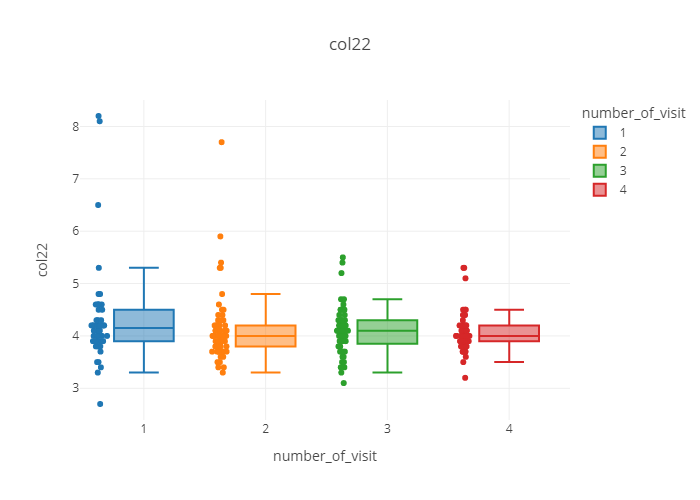

col22
H(3) = 4.24 p = 0.24
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                    
                   count       mean       std   min    25%   50%   75%   max
number_of_visit                                                             
1                   50.0  40.140000  7.748627  23.0  36.25  40.5  44.0  57.0
2                   61.0  42.163934  5.879854  29.0  39.00  42.0  46.0  56.0
3                   60.0  41.503333  6.576923  26.0  38.00  41.0  45.0  61.0
4                   59.0  41.101695  4.773110  29.0  38.00  41.0  44.0  58.0


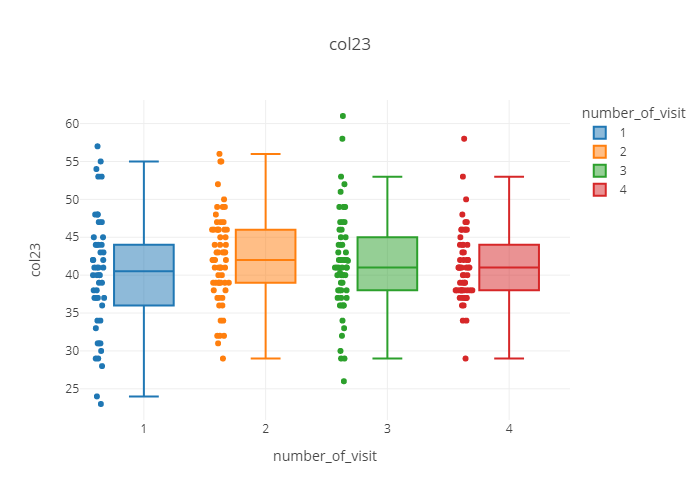

col23
H(3) = 2.99 p = 0.39
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                                    \
                   count        mean        std   min    25%    50%    75%   
number_of_visit                                                              
1                   49.0  135.877551  26.012523  78.0  122.0  136.0  150.0   
2                   61.0  143.377049  19.938375  99.0  133.0  143.0  156.0   
3                   60.0  140.766667  20.766961  99.0  129.0  139.0  150.0   
4                   59.0  139.423729  16.193020  99.0  129.0  139.0  149.5   

                        
                   max  
number_of_visit         
1                194.0  
2                190.0  
3                207.0  
4                197.0  


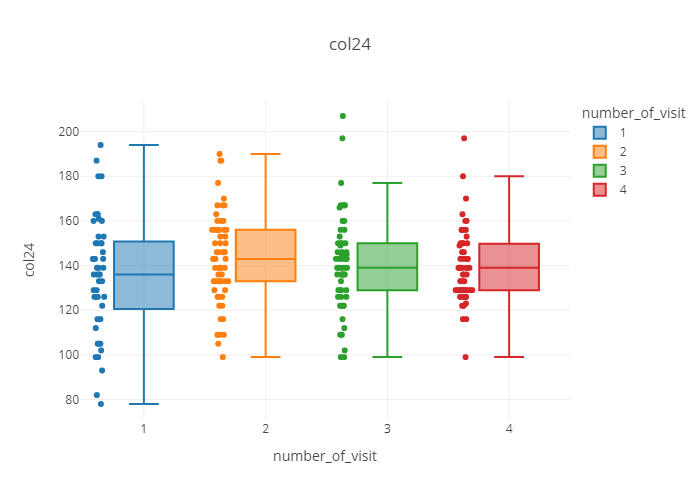

col24
H(3) = 3.37 p = 0.34
//////////////////////////////////////////////////////////////////////////////////////////////////////
                describe                                             \
                   count       mean        std       min        25%   
number_of_visit                                                       
1                   46.0  47.219033  30.889081  8.774373  24.682347   
2                   64.0  48.940777  29.400228  9.615385  28.001888   
3                   57.0  52.360511  29.930185  9.242762  33.081761   
4                   48.0  57.412345  33.519751  7.873090  29.935502   

                                                   
                       50%        75%         max  
number_of_visit                                    
1                41.077778  58.130318  141.927409  
2                41.216775  61.593276  132.506527  
3                49.125168  66.161027  152.666667  
4                55.302764  80.723015  148.073022  


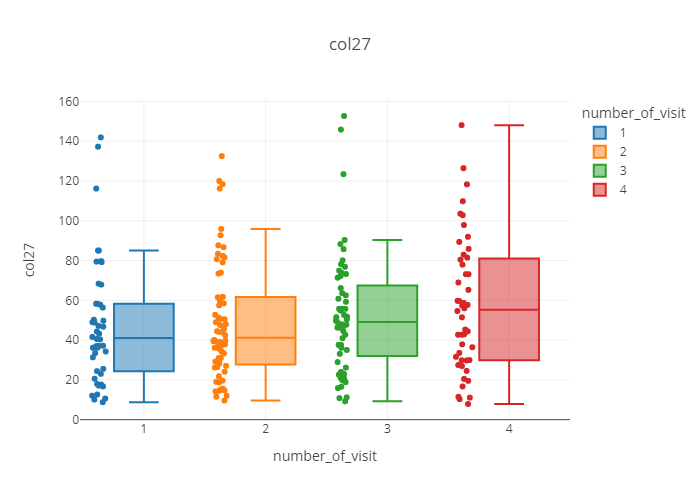

col27
H(3) = 3.61 p = 0.31
//////////////////////////////////////////////////////////////////////////////////////////////////////


In [47]:
# Kruskal Wallis test, Mann-Whitneyu test (method for adjusting p values - Bonferroni)
for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
    param = 'col' + str(i)
    nonparametric_test(df2[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [48]:
# for the first therapy group
# for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
#     param = 'col' + str(i)
#     nonparametric_test(df_united.query('group == 1')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [49]:
# for the second therapy group
# for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
#     param = 'col' + str(i)
#     nonparametric_test(df_united.query('group == 2')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

In [50]:
# for the third therapy group
# for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
#     param = 'col' + str(i)
#     nonparametric_test(df_united.query('group == 3')[[param, 'number_of_visit']].dropna(), param, 'number_of_visit')

<a id='Per-protocol_analysis'></a>
# Per-protocol analysis
[To the table of contents](#content)

<a id='ANOVA_for_repeated_measures'></a>
### ANOVA for repeated measures
[To the table of contents](#content)

In [51]:
def param_per_protocol_analysis(data, number_of_par, title): 
    
    data_visit = ({'ID': range(1, len(data.query('number_of_visit == 1')[number_of_par]) + 1, 1),
    'col1': data.query('number_of_visit == 1')[number_of_par].tolist(), 
    'col2': data.query('number_of_visit == 2')[number_of_par].tolist(),
    'col3': data.query('number_of_visit == 3')[number_of_par].tolist(),
    'col4': data.query('number_of_visit == 4')[number_of_par].tolist()})
        
    data_drop = pd.DataFrame(data=data_visit)
    data_drop = data_drop.dropna()

    print("Number of the participants: ", len(data_drop['col1'].tolist()))
    
    d = {'number_of_visit': [1] * len(data_drop['col1'].tolist()) + [2] * len(data_drop['col1'].tolist()) + 
         [3] * len(data_drop['col1'].tolist()) + [4] * len(data_drop['col1'].tolist()), 
         "ID": data_drop['ID'].tolist() * 4,
         number_of_par: data_drop['col1'].tolist() + data_drop['col2'].tolist() + data_drop['col3'].tolist() 
         + data_drop['col4'].tolist()}
    
    df = pd.DataFrame(data=d) 
    
    fig = px.box(df, x='number_of_visit', 
             y=number_of_par, color = 'number_of_visit', points="all", 
             template="gridon",
             title = title)    
    fig.show('png')  
    
    # mean changing
    data_mean = (df.groupby('number_of_visit', as_index=False)[number_of_par].agg({'mean', 'sem'}))

    fig = go.Figure(data=go.Scatter(
    x=['col1', 'col2', 'col3', 'col4'],
    y=data_mean['mean'].tolist(),
    error_y=dict(
                 type='data', # value of error bar given in data coordinates
                 array=(data_mean['sem']*1.96).tolist(),
                 visible=True)
    ))

    fig.update_layout(title=title)
    fig.update_layout(template='gridon')
    fig.update_yaxes(title='Mean (95% CI)')
    fig.show('png')
    
    result = AnovaRM(data=df, depvar=number_of_par, subject='ID', within=['number_of_visit']).fit()
    print(result)
    
    #display results
    if result.anova_table['Pr > F'][0] < 0.05:
        print('There is a sig difference')
        
        # perform Tukey's test
        tukey = pairwise_tukeyhsd(endog=df[number_of_par],
        groups=df['number_of_visit'],
        alpha= 0.05)
        print(tukey)        
        
    print('/////////////////////////////////////////////////////////////////////////////////////////////////')   

Number of the participants:  69


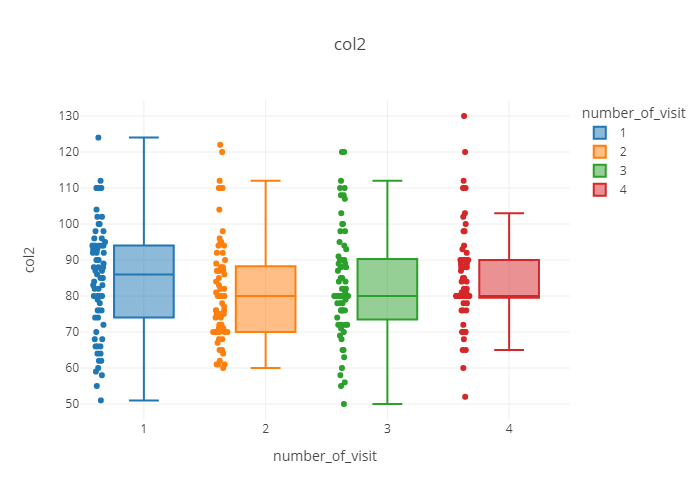

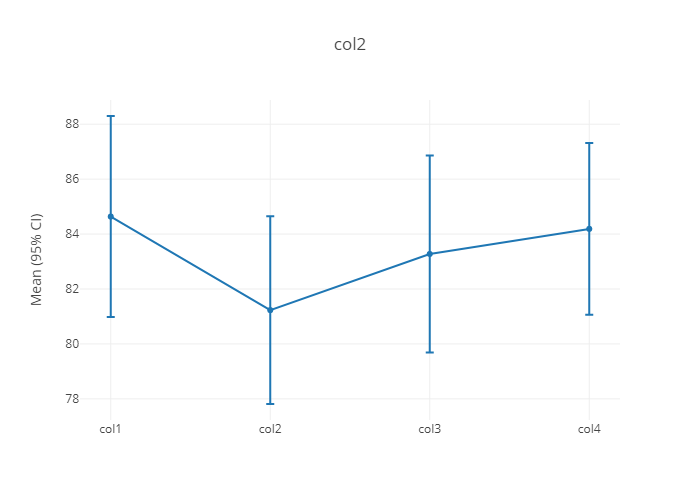

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  1.1432 3.0000 204.0000 0.3327

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  69


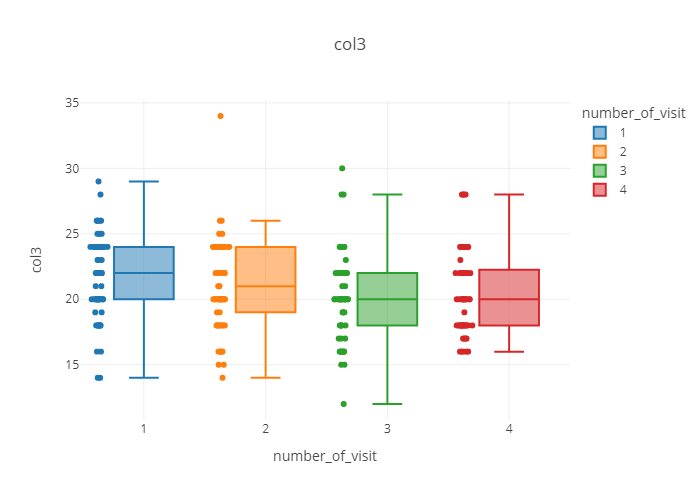

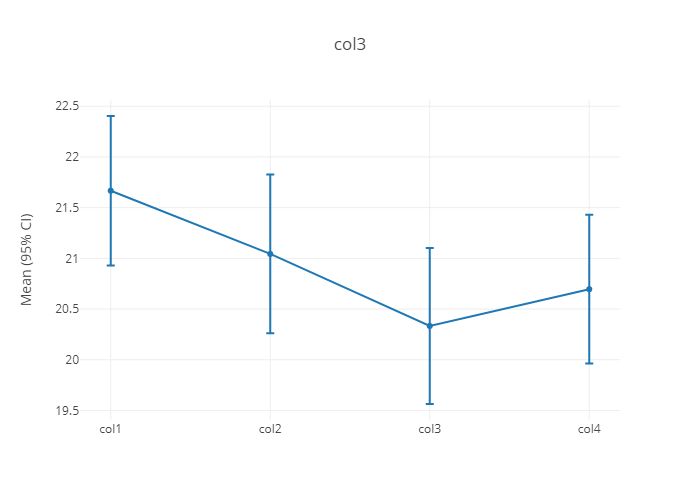

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  2.9983 3.0000 204.0000 0.0317

There is a sig difference
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2  -0.6232 0.6636 -2.0332 0.7869  False
     1      3  -1.3333 0.0714 -2.7434 0.0767  False
     1      4   -0.971 0.2851 -2.3811  0.439  False
     2      3  -0.7101 0.5625 -2.1202 0.6999  False
     2      4  -0.3478 0.9197 -1.7579 1.0622  False
     3      4   0.3623 0.9104 -1.0477 1.7724  False
---------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  69


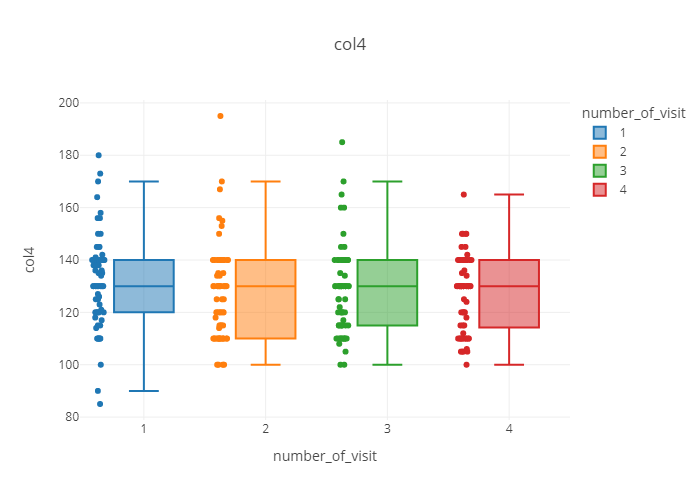

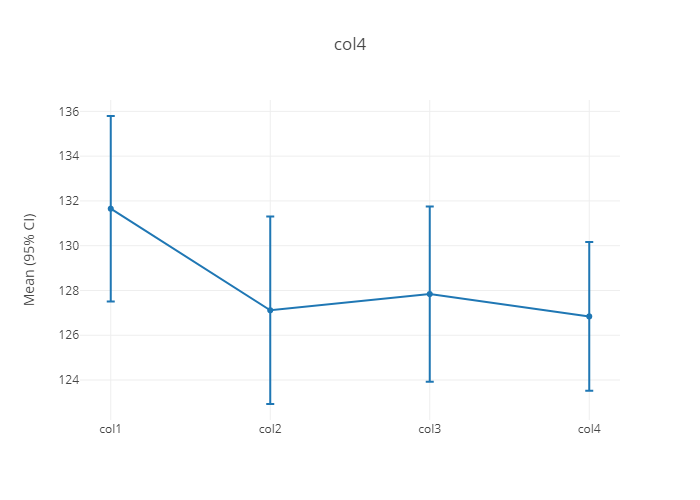

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  2.2239 3.0000 204.0000 0.0865

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  69


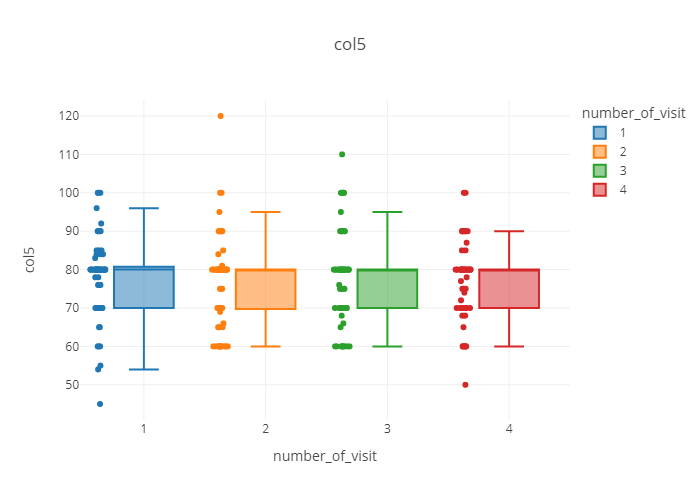

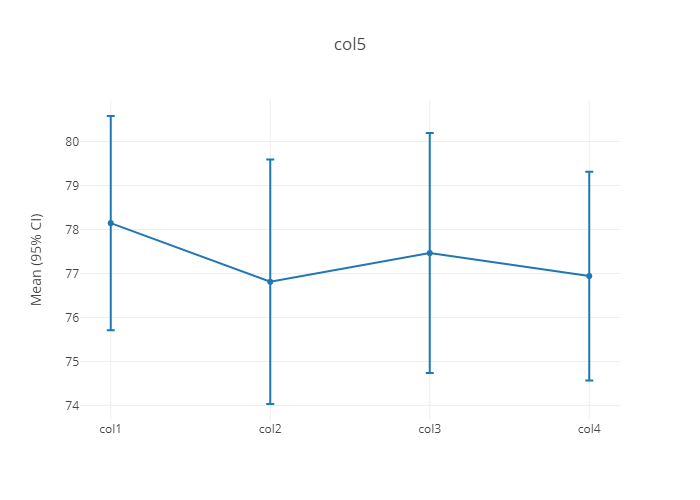

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  0.3198 3.0000 204.0000 0.8110

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  15


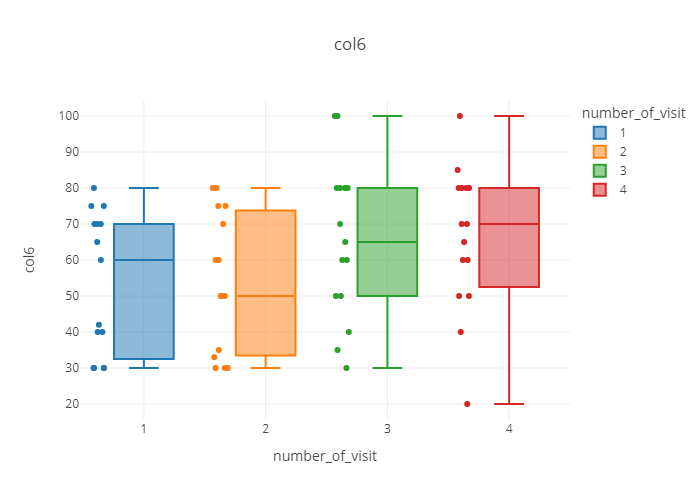

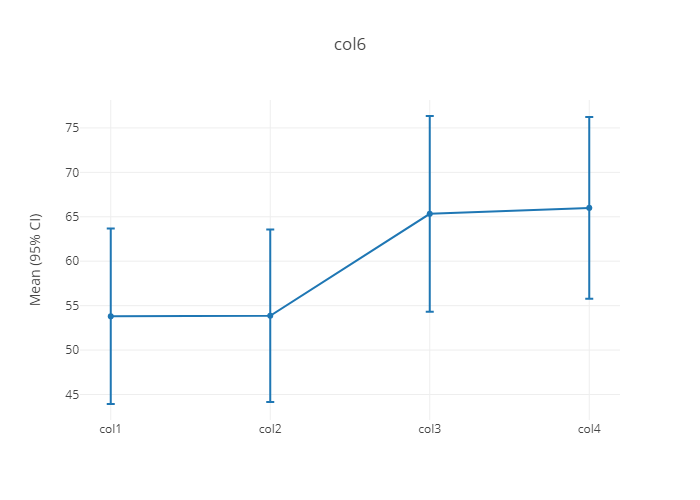

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  3.9252 3.0000 42.0000 0.0148

There is a sig difference
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     1      2   0.0667    1.0 -19.4407 19.5741  False
     1      3  11.5333 0.4064  -7.9741 31.0407  False
     1      4     12.2 0.3564  -7.3074 31.7074  False
     2      3  11.4667 0.4115  -8.0407 30.9741  False
     2      4  12.1333 0.3613  -7.3741 31.6407  False
     3      4   0.6667 0.9997 -18.8407 20.1741  False
-----------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  34


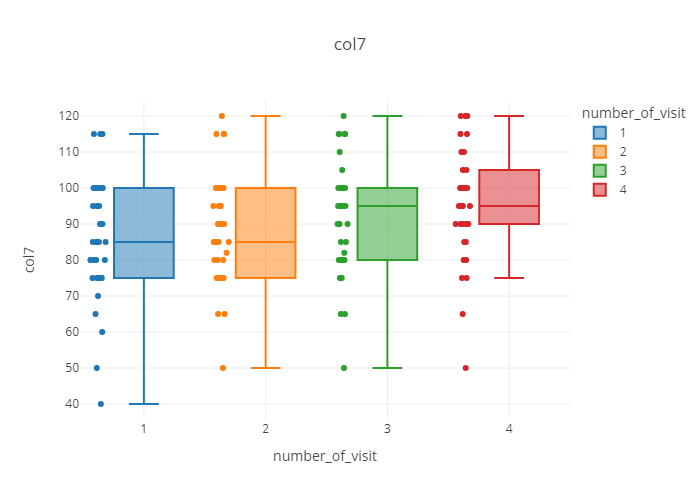

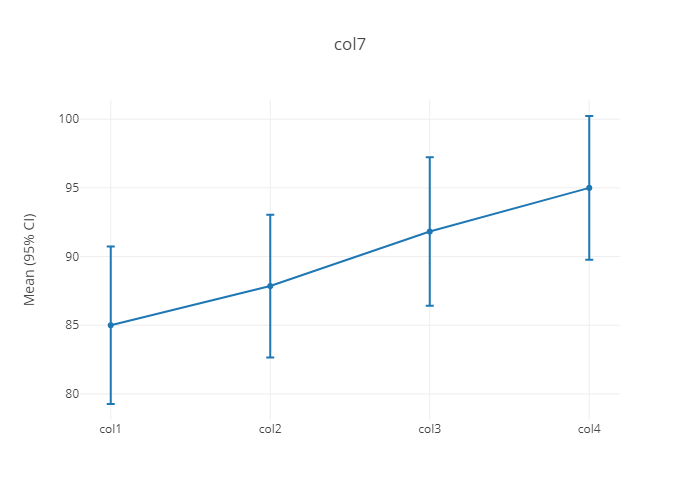

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit 10.5497 3.0000 99.0000 0.0000

There is a sig difference
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   2.8529 0.8838 -7.2805 12.9864  False
     1      3   6.8235 0.3012 -3.3099  16.957  False
     1      4     10.0 0.0545 -0.1335 20.1335  False
     2      3   3.9706 0.7383 -6.1629  14.104  False
     2      4   7.1471 0.2616 -2.9864 17.2805  False
     3      4   3.1765  0.847  -6.957 13.3099  False
----------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  54


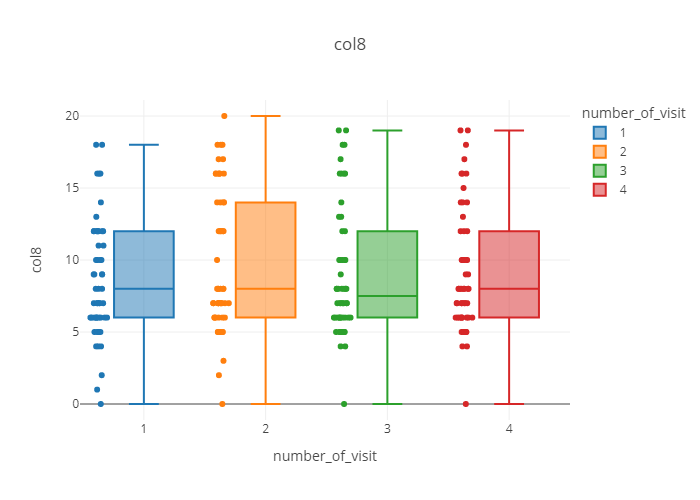

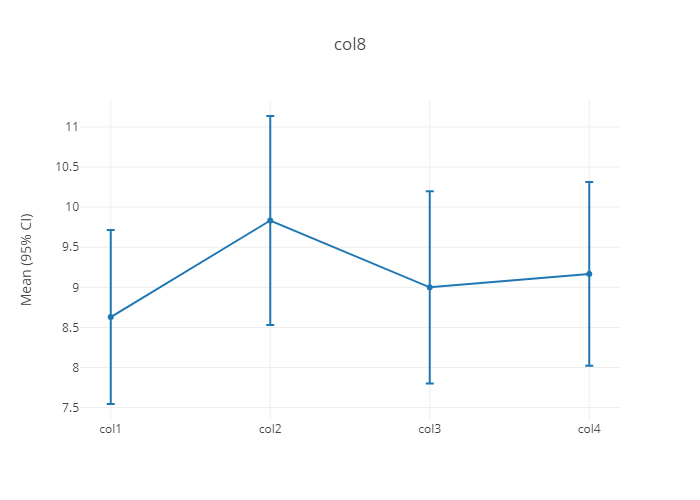

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  0.8517 3.0000 159.0000 0.4676

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  30


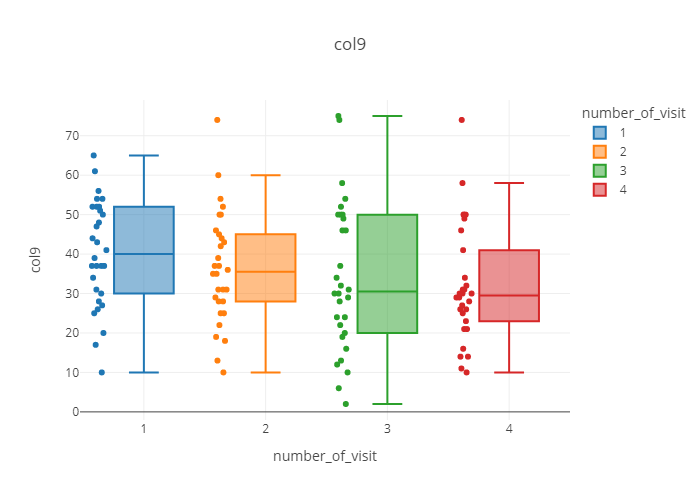

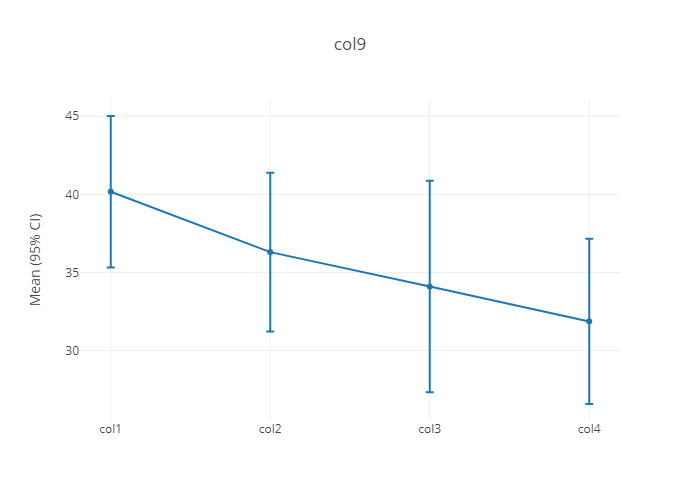

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  2.5666 3.0000 87.0000 0.0597

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  61


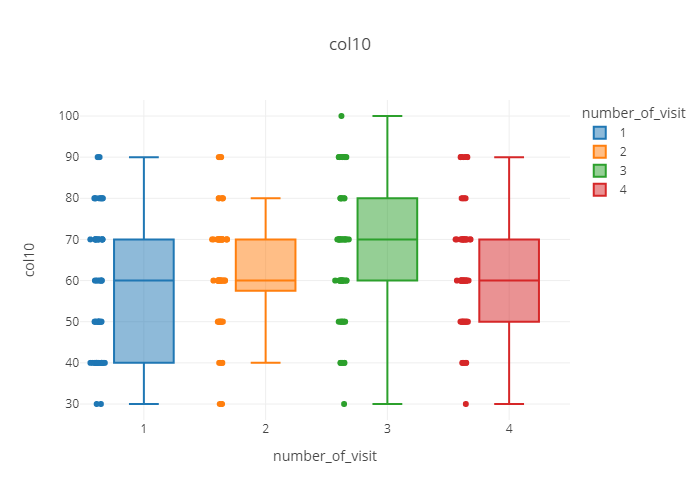

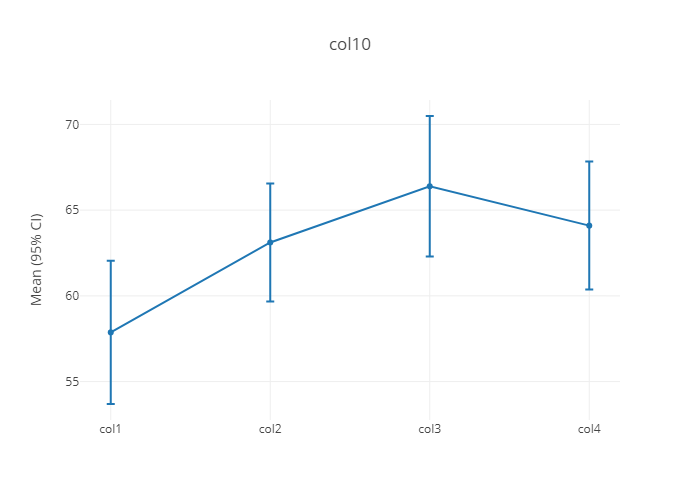

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  8.4096 3.0000 180.0000 0.0000

There is a sig difference
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   5.2459  0.241 -1.9869 12.4787  False
     1      3   8.5246 0.0135  1.2917 15.7574   True
     1      4   6.2295 0.1186 -1.0033 13.4624  False
     2      3   3.2787 0.6446 -3.9542 10.5115  False
     2      4   0.9836  0.985 -6.2492  8.2164  False
     3      4  -2.2951 0.8445 -9.5279  4.9378  False
----------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  54


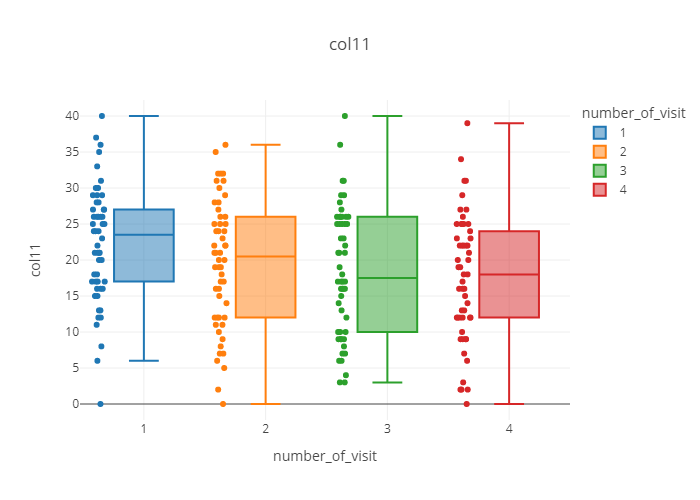

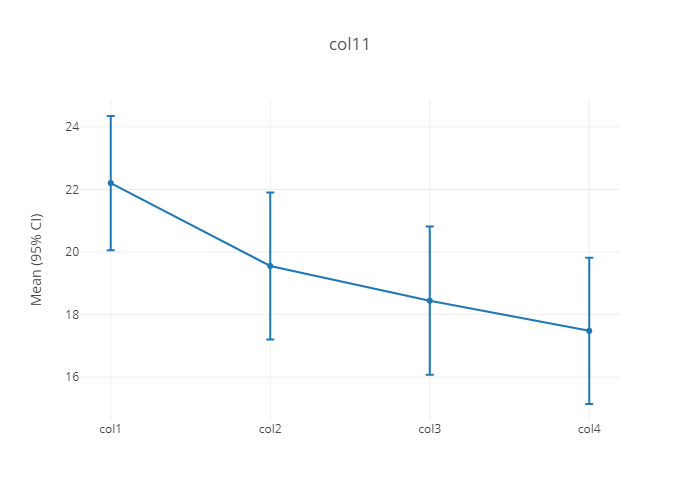

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  5.9185 3.0000 159.0000 0.0007

There is a sig difference
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -2.6481 0.3837 -6.9478  1.6515  False
     1      3  -3.7593 0.1099 -8.0589  0.5404  False
     1      4  -4.7222  0.025 -9.0219 -0.4225   True
     2      3  -1.1111 0.9086 -5.4108  3.1886  False
     2      4  -2.0741 0.5963 -6.3738  2.2256  False
     3      4   -0.963  0.938 -5.2626  3.3367  False
----------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  53


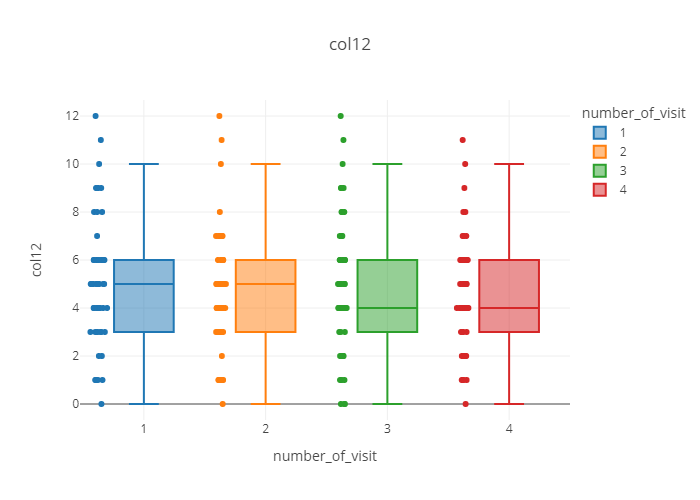

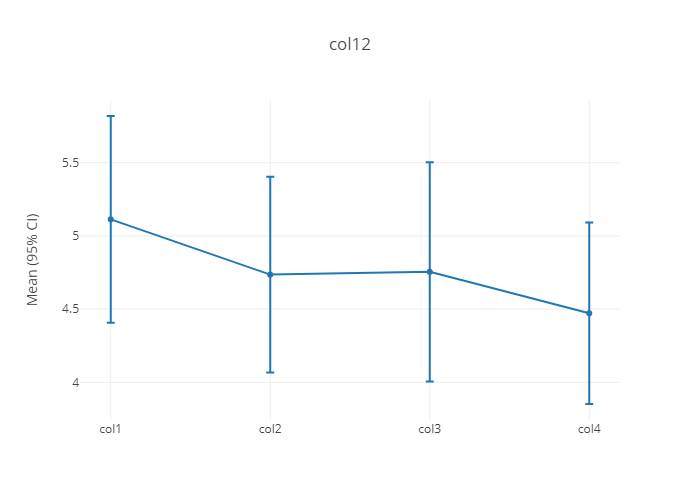

                    Anova
                F Value Num DF  Den DF  Pr > F
----------------------------------------------
number_of_visit  1.1656 3.0000 156.0000 0.3248

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  14


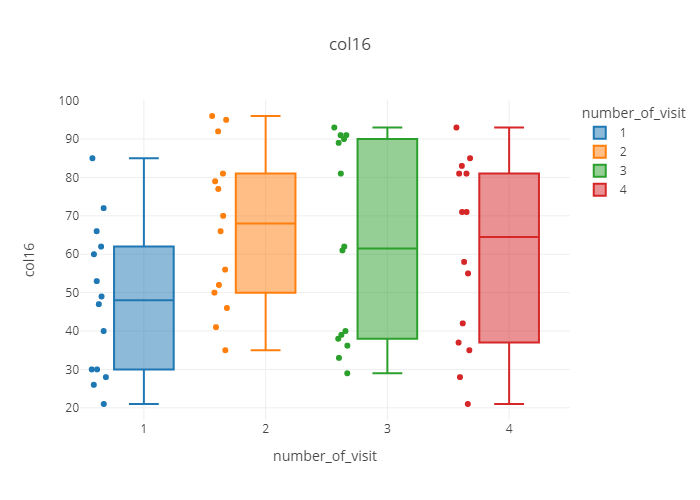

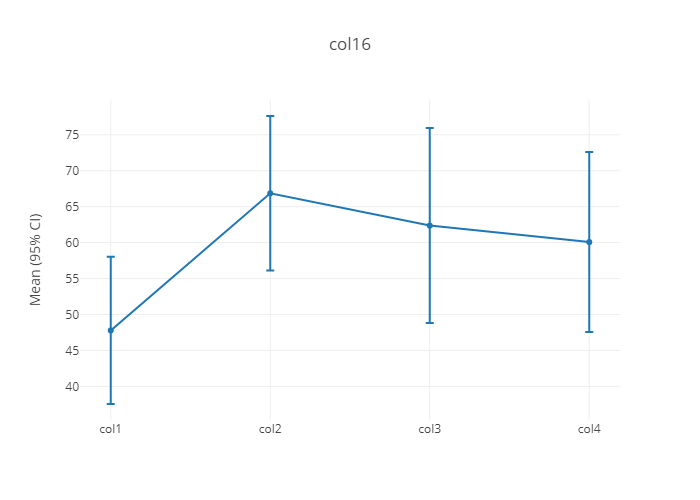

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  3.2663 3.0000 39.0000 0.0313

There is a sig difference
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     1      2  19.0714 0.1279  -3.5982 41.7411  False
     1      3  14.5857 0.3302   -8.084 37.2554  False
     1      4  12.2857 0.4817  -10.384 34.9554  False
     2      3  -4.4857 0.9526 -27.1554  18.184  False
     2      4  -6.7857 0.8566 -29.4554  15.884  False
     3      4     -2.3 0.9931 -24.9697 20.3697  False
-----------------------------------------------------
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  17


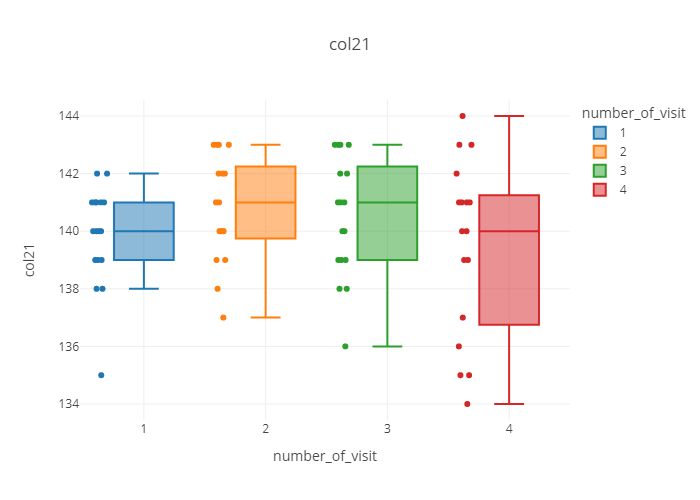

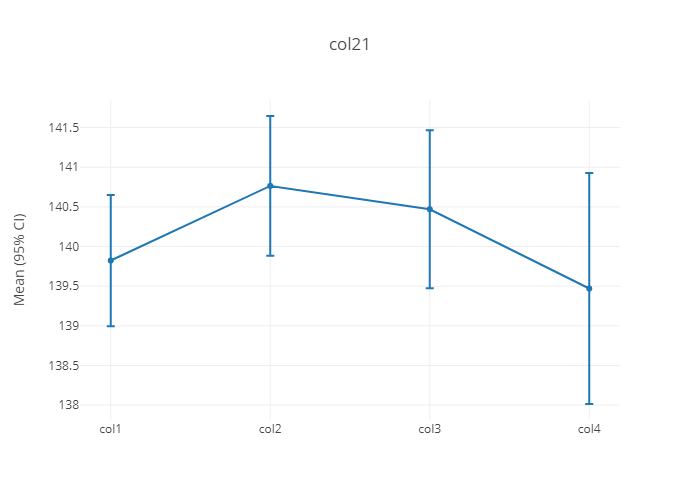

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  1.5618 3.0000 48.0000 0.2108

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


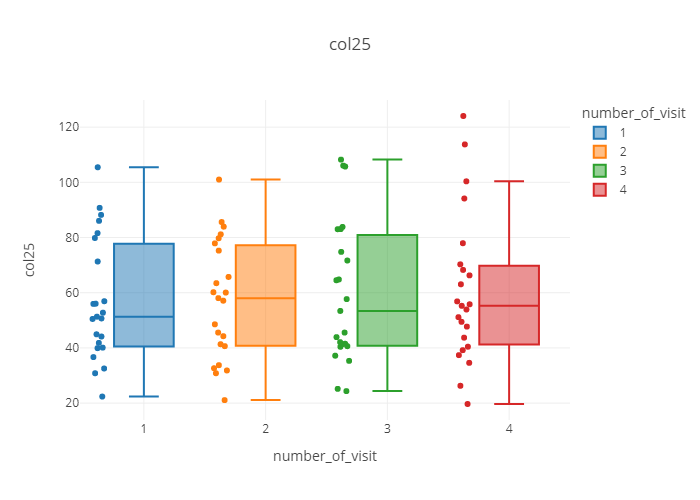

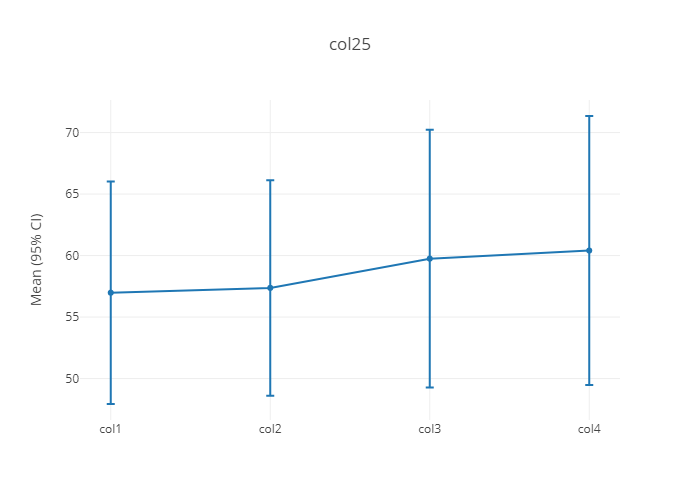

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  0.4704 3.0000 66.0000 0.7040

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


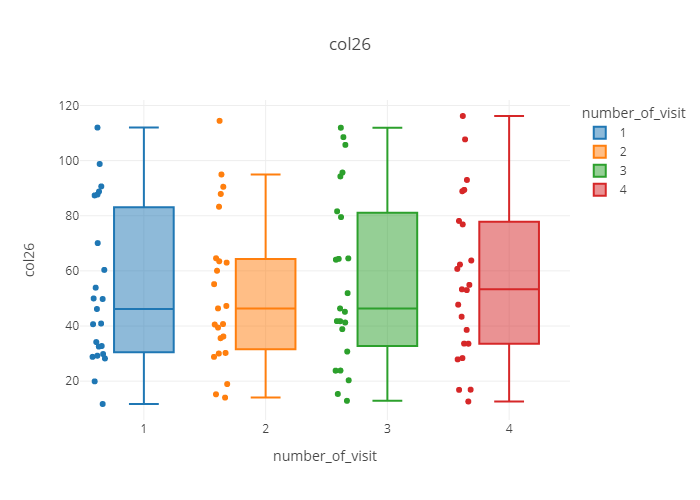

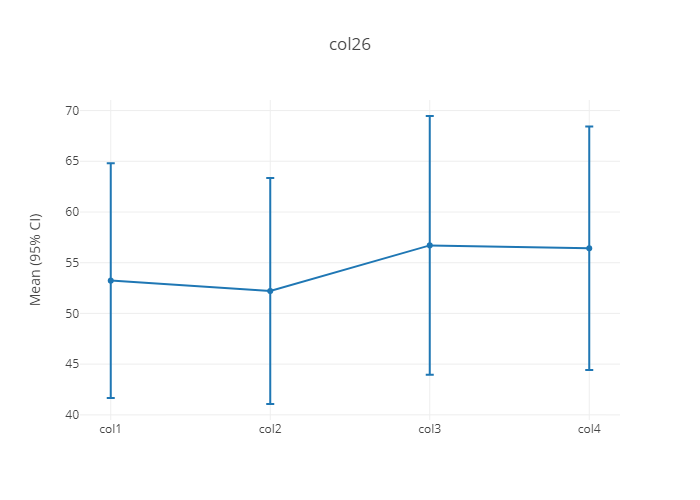

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  1.1622 3.0000 66.0000 0.3309

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


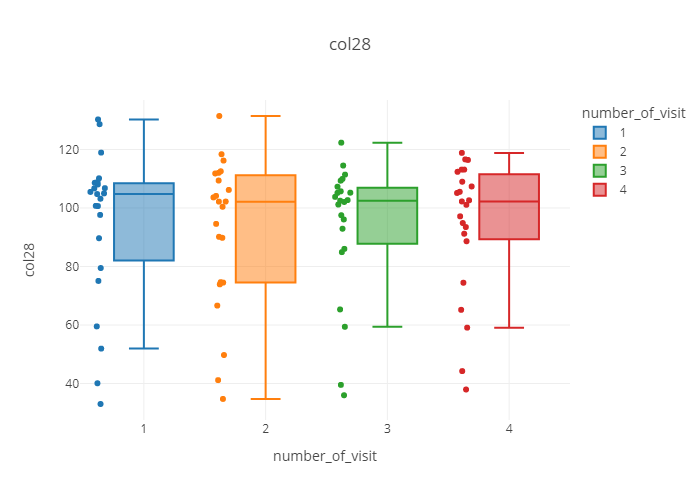

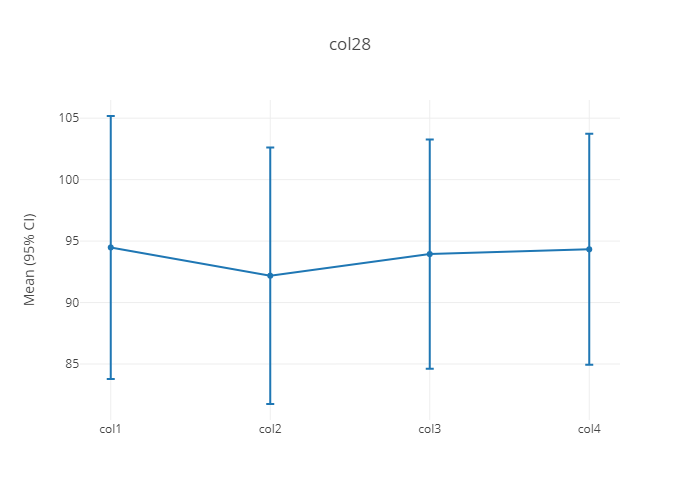

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  0.3285 3.0000 66.0000 0.8048

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


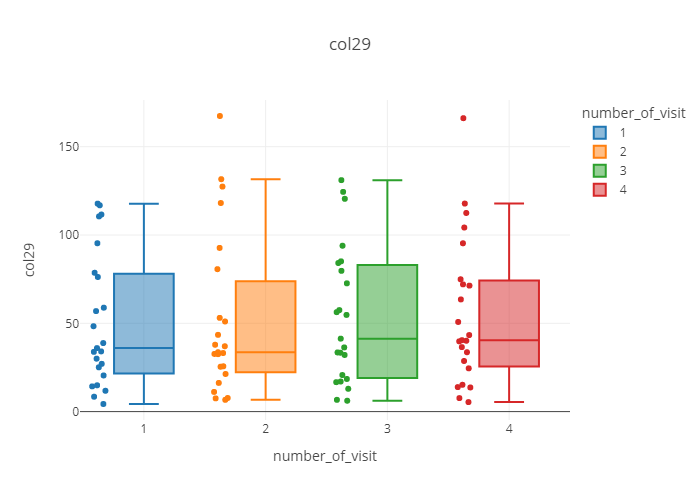

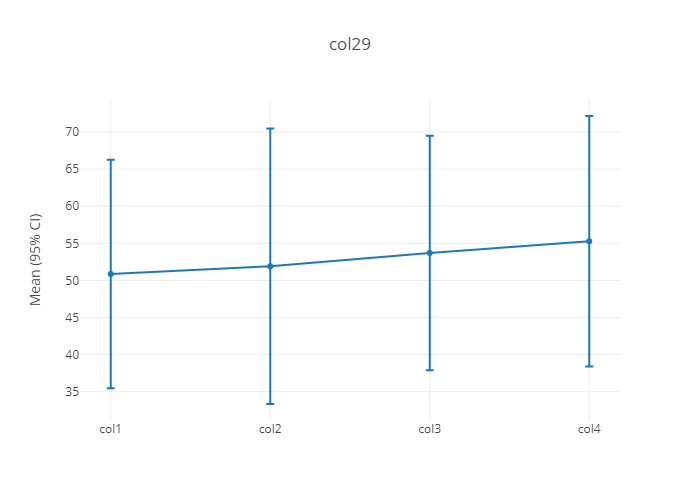

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  0.4042 3.0000 66.0000 0.7504

/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


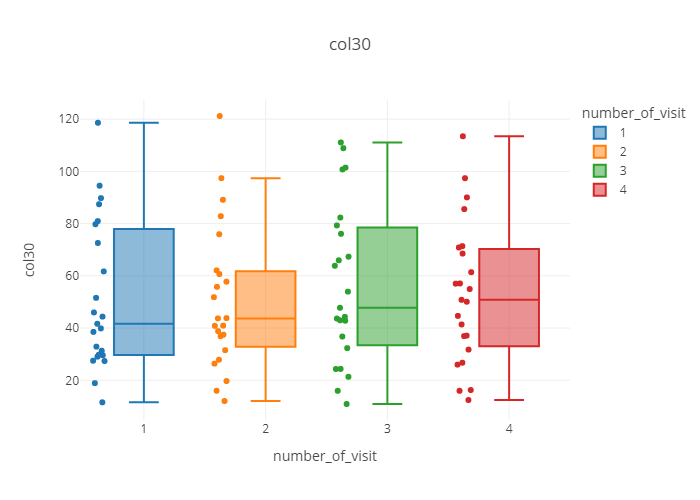

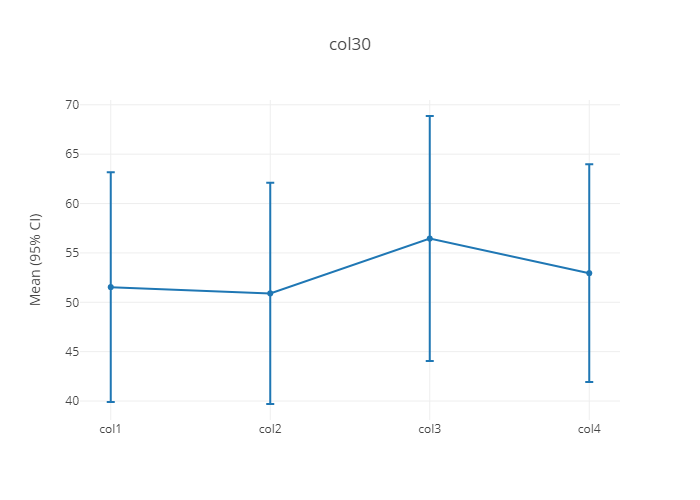

                    Anova
                F Value Num DF  Den DF Pr > F
---------------------------------------------
number_of_visit  1.6769 3.0000 66.0000 0.1805

/////////////////////////////////////////////////////////////////////////////////////////////////


In [52]:
for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]: 
    param = 'col' + str(i)
    param_per_protocol_analysis(df2, param, param)

In [53]:
# for the second therapy group
# for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]: 
#     param = 'col' + str(i)
#     param_per_protocol_analysis(df_united.query('group == 2'), param, param)

In [54]:
# for the third therapy group
# for i in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 21, 25, 26, 28, 29, 30]: 
#     param = 'col' + str(i)
#     param_per_protocol_analysis(df_united.query('group == 3'), param, param)

<a id='Friedman_test'></a>
### The Friedman test for repeated samples
[Table of contents](#content)

In [55]:
def nonparam_per_protocol_analysis(data, number_of_par, title): 
    
    data_visit = ({'ID': range(1, len(data.query('number_of_visit == 1')[number_of_par]) + 1, 1),
    'col1': data.query('number_of_visit == 1')[number_of_par].tolist(), 
    'col2': data.query('number_of_visit == 2')[number_of_par].tolist(),
    'col3': data.query('number_of_visit == 3')[number_of_par].tolist(),
    'col4': data.query('number_of_visit == 4')[number_of_par].tolist()})
        
    data_drop = pd.DataFrame(data=data_visit)
    data_drop = data_drop.dropna()

    print("Number of the participants: ", len(data_drop['col1'].tolist()))

    d = {'number_of_visit': [1] * len(data_drop['col1'].tolist()) + [2] * len(data_drop['col1'].tolist()) + 
         [3] * len(data_drop['col1'].tolist()) + [4] * len(data_drop['col1'].tolist()), 
         "ID": data_drop['ID'].tolist() * 4,
         number_of_par: data_drop['col1'].tolist() + data_drop['col2'].tolist() + data_drop['col3'].tolist() 
         + data_drop['col4'].tolist()}
    
    df = pd.DataFrame(data=d) 
    
    fig = px.box(df, x='number_of_visit', 
              y=number_of_par, color = 'number_of_visit', points="all", 
              template="gridon",
              title = title)    
    fig.show('png')    
    
    # mean changing
    data_mean = (df.groupby('number_of_visit', as_index=False)[number_of_par].agg({'mean', 'sem'}))
    
    fig = go.Figure(data=go.Scatter(
    x=['col1', 'col2', 'col3', 'col4'],
    y=data_mean['mean'].tolist(),
    error_y=dict(
              type='data', # value of error bar given in data coordinates
              array=(data_mean['sem']*1.96).tolist(),
              visible=True)
     ))

    fig.update_layout(title=title)
    fig.update_layout(template='gridon')
    fig.update_yaxes(title='Mean (95% CI)')
    fig.show('png')
    
    # the Friedman test for repeated samples
    friedman_result = stats.friedmanchisquare(data_drop['col1'], data_drop['col2'], data_drop['col3'], data_drop['col4'])
    print(friedman_result)
 
  
    if friedman_result.pvalue < 0.05:
        # Conover test
        print('Conover test')
        print(sp.posthoc_conover_friedman(data_drop[['col1', 'col2', 'col3', 'col4']]))
        
    print('/////////////////////////////////////////////////////////////////////////////////////////////////')   

Number of the participants:  70


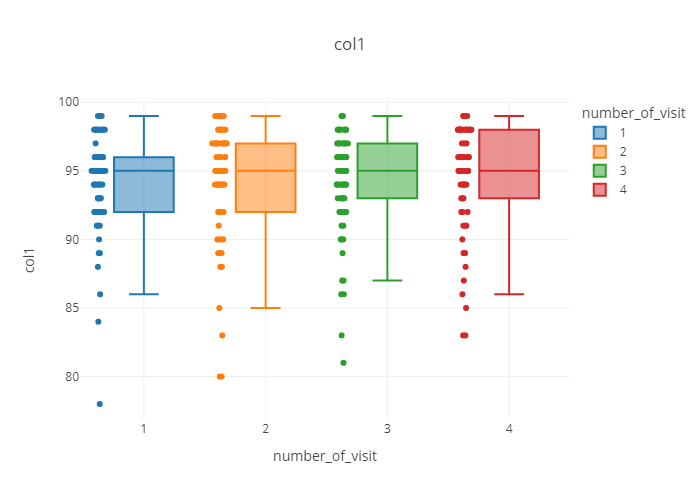

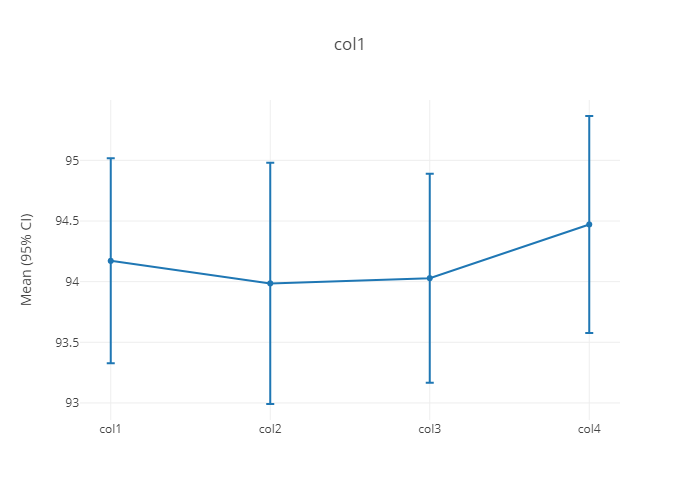

FriedmanchisquareResult(statistic=1.209375000000108, pvalue=0.7507566887943224)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  58


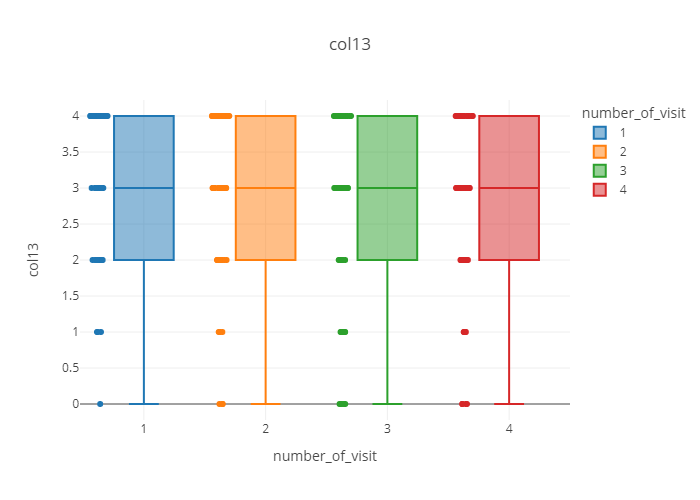

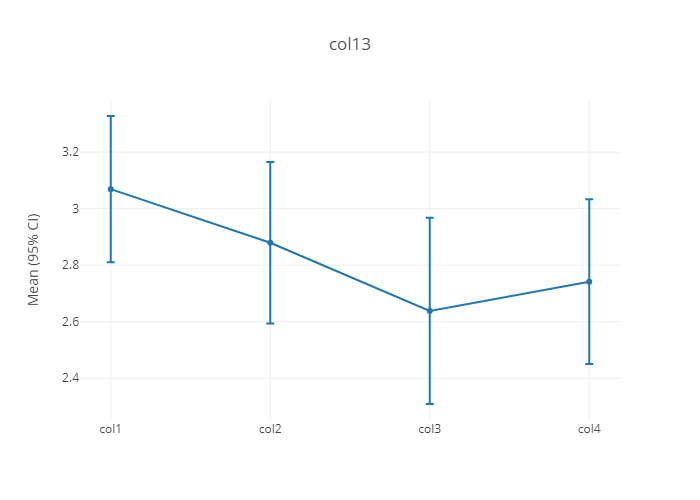

FriedmanchisquareResult(statistic=8.739130434782588, pvalue=0.0329680888736868)
Conover test
          col1      col2      col3      col4
col1  1.000000  0.226026  0.006463  0.029408
col2  0.226026  1.000000  0.124882  0.327793
col3  0.006463  0.124882  1.000000  0.575676
col4  0.029408  0.327793  0.575676  1.000000
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  17


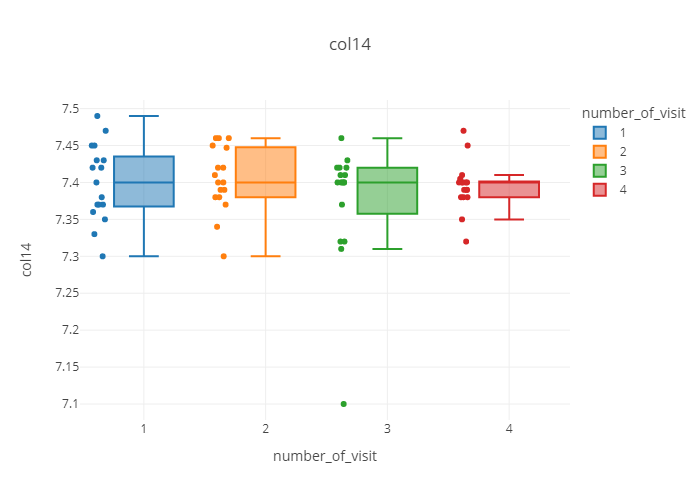

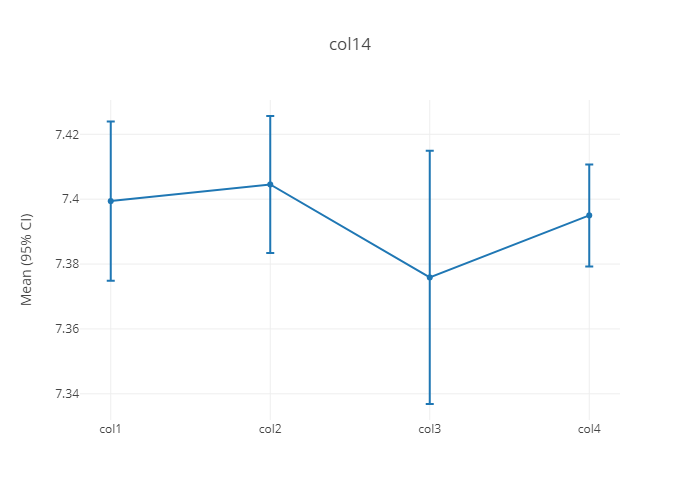

FriedmanchisquareResult(statistic=1.772727272727292, pvalue=0.620887693109557)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  17


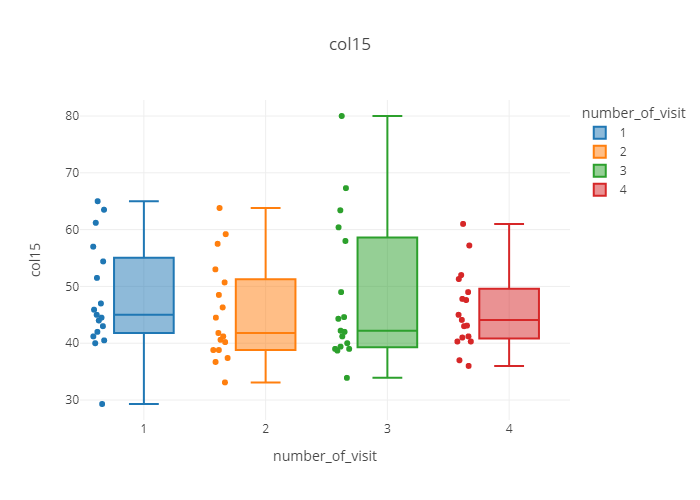

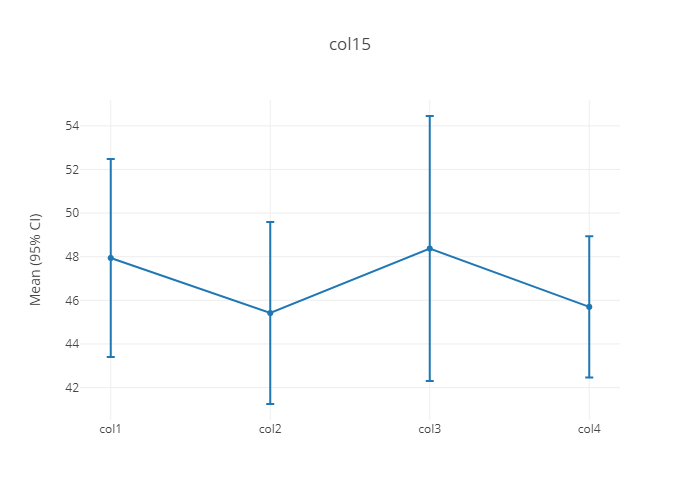

FriedmanchisquareResult(statistic=3.0714285714285965, pvalue=0.38074287198185863)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  12


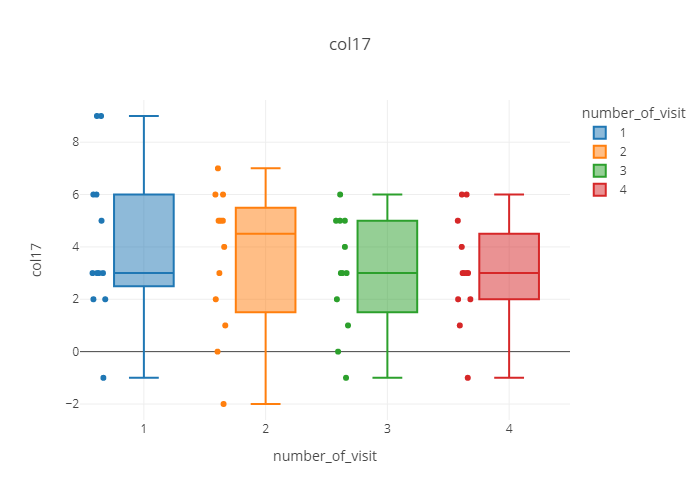

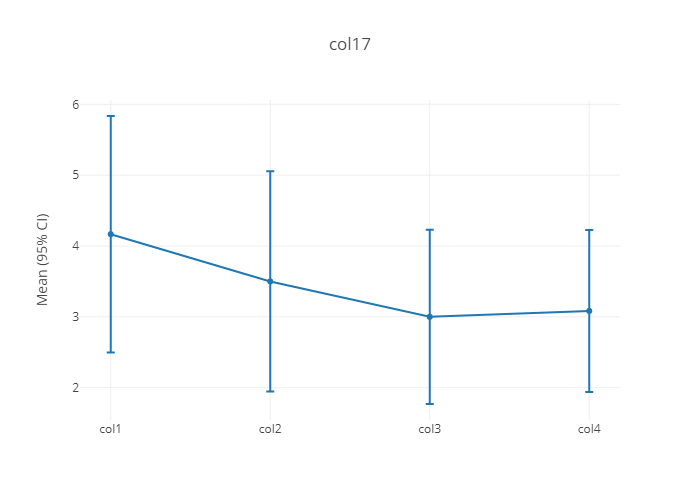

FriedmanchisquareResult(statistic=5.576086956521747, pvalue=0.13415794206423662)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  16


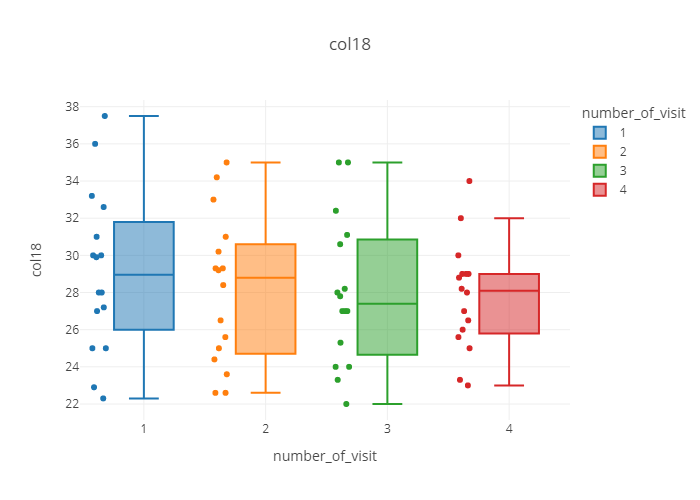

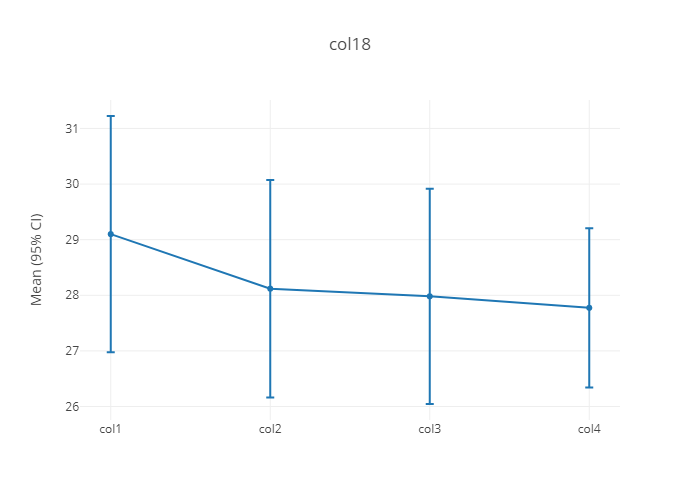

FriedmanchisquareResult(statistic=5.279220779220761, pvalue=0.15245642023228323)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  16


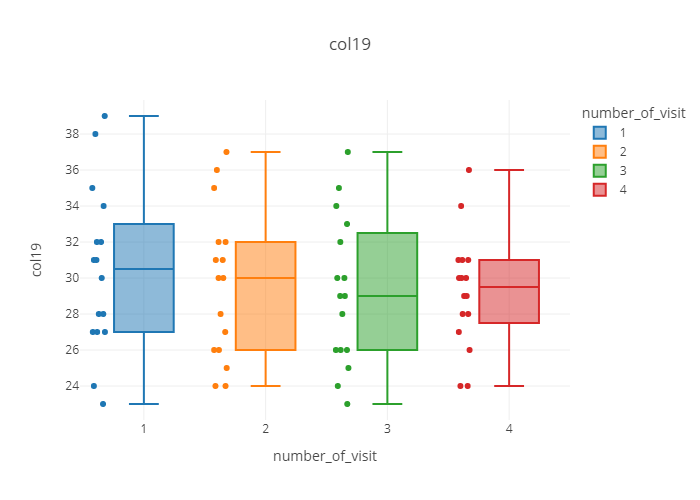

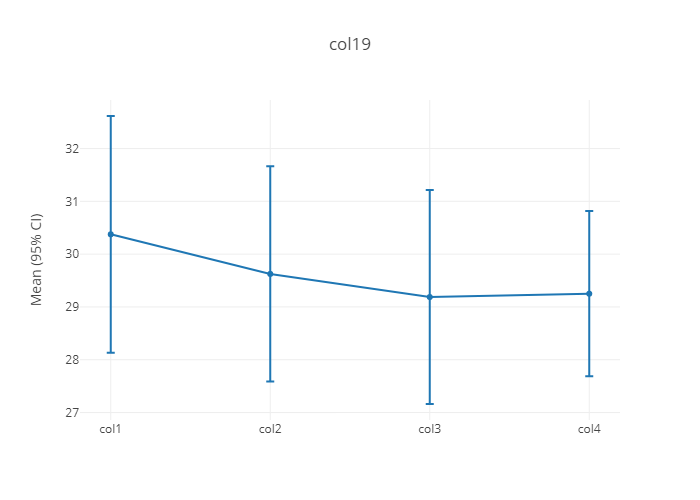

FriedmanchisquareResult(statistic=4.367647058823502, pvalue=0.22440407019560105)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  7


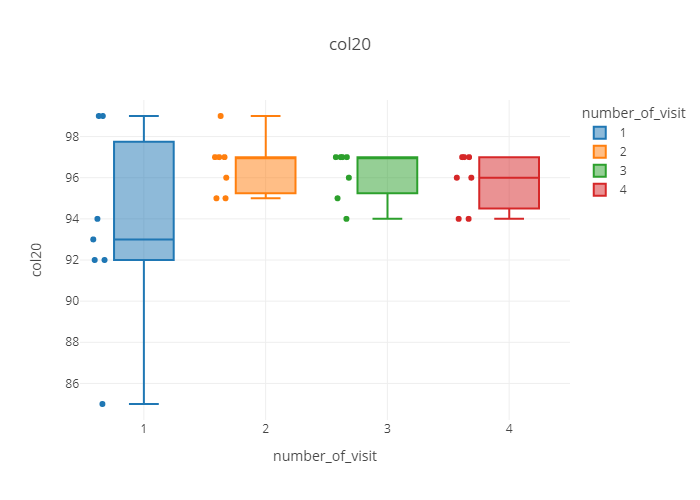

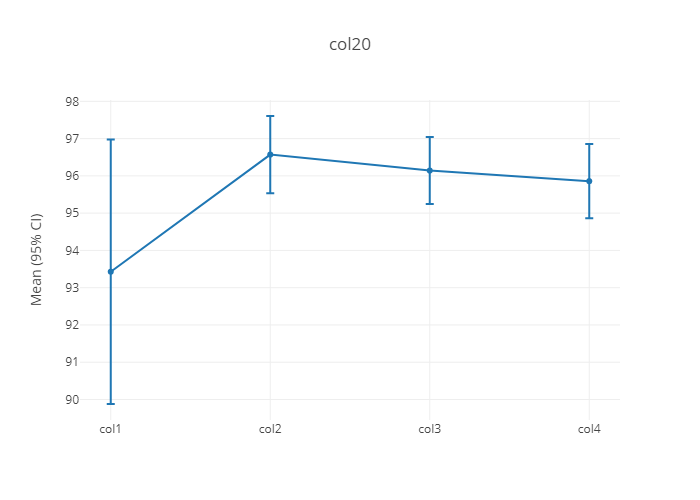

FriedmanchisquareResult(statistic=3.3809523809523827, pvalue=0.3365335688430705)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  17


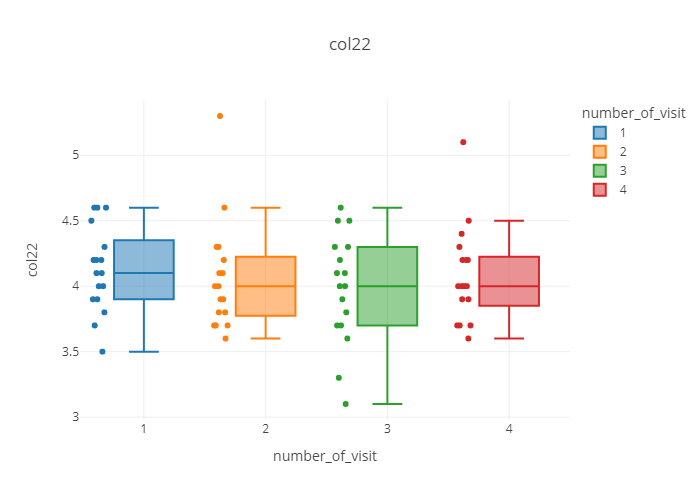

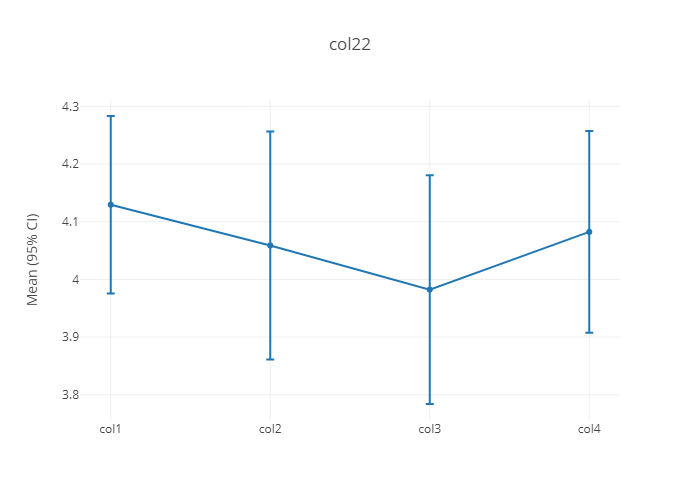

FriedmanchisquareResult(statistic=1.2828947368420827, pvalue=0.7331988427314733)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  17


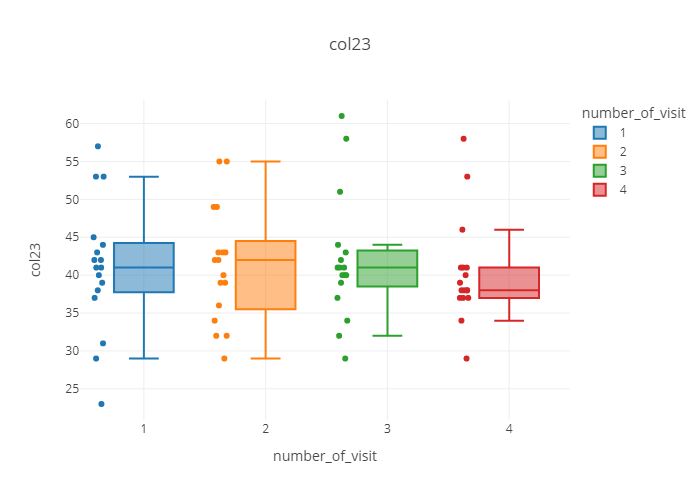

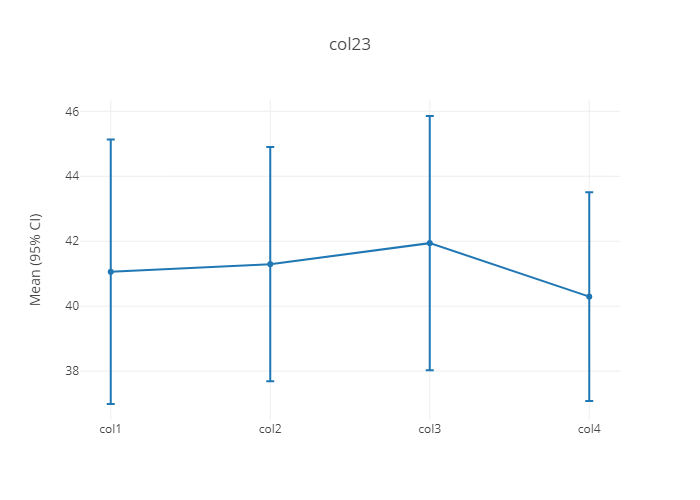

FriedmanchisquareResult(statistic=6.196078431372535, pvalue=0.10245066110633552)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  16


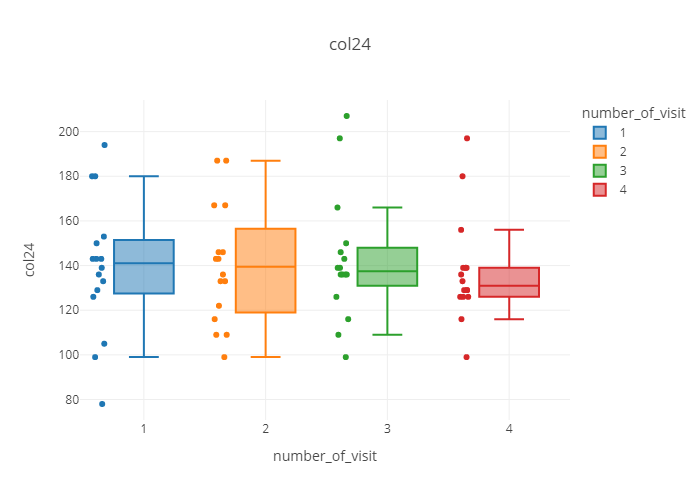

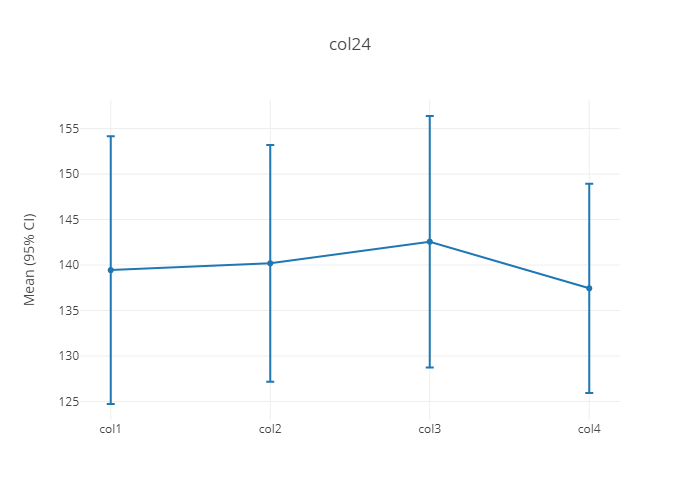

FriedmanchisquareResult(statistic=6.270833333333314, pvalue=0.09915188409533529)
/////////////////////////////////////////////////////////////////////////////////////////////////
Number of the participants:  23


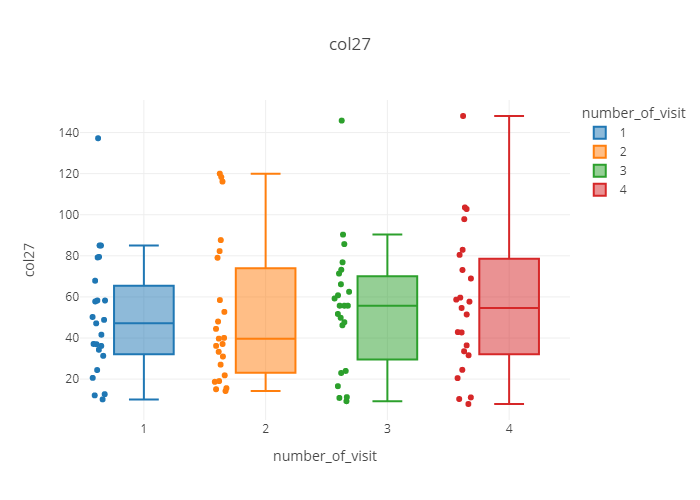

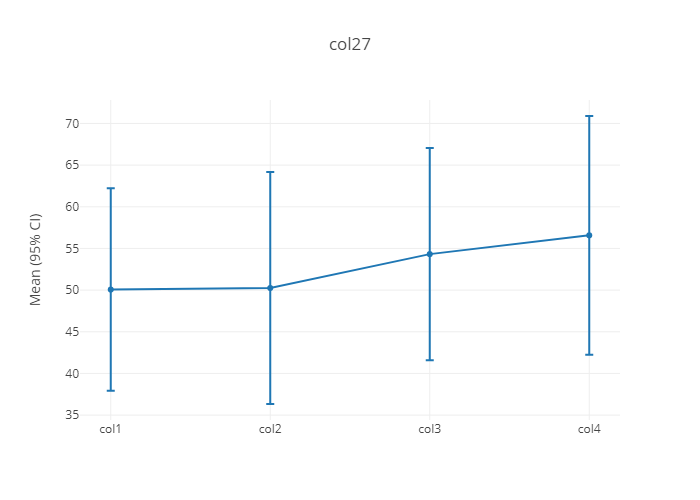

FriedmanchisquareResult(statistic=2.1652173913043384, pvalue=0.5388319138973188)
/////////////////////////////////////////////////////////////////////////////////////////////////


In [56]:
for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
    param = 'col' + str(i)
    nonparam_per_protocol_analysis(df2, param, param)

In [57]:
# for the second therapy group
# for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
#     param = 'col' + str(i)
#     nonparam_per_protocol_analysis(df_united.query('group == 2'), param, param)

In [58]:
# for the third therapy group
# for i in [1, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 27]:
#     param = 'col' + str(i)
#     nonparam_per_protocol_analysis(df_united.query('group == 3'), param, param)